#### Enhance Cohort from v4

Visit Paper resources notebook for the cohort 

Data set : 2016-2021

In [1]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import roc_auc_score
from sklearn import metrics as sk_metrics
from xgboost import XGBClassifier as xgbc
from interpret.glassbox import ExplainableBoostingClassifier as EBC
import pandas as pd
import seaborn as sns
import torch
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
import numpy as np
from utils.evaluate import Evaluation
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns

sns.set_style('whitegrid')

def composite(rows):
    assert isinstance(rows['mortality'],int) or isinstance(rows['mortality'],bool)
    assert isinstance(rows['readmission'],int) or isinstance(rows['readmission'],bool)
    
    if (rows['hosp_after_icu'] > 168*2) | (rows['mortality']==1) | (rows['readmission']==1):
        return 1
    else: return 0
    
    


def roc(prob, gt):
    x = []
    y = []
    tup = []
    delta = 0.1
    auc = 0
    for i in np.arange(0,1.1,delta):
        
        prediction = prob>i
        tp = (prediction * gt).sum()
        fp = ((prediction == 1) * (gt == 0)).sum()
        tn = ((prediction == 0) * (gt == 0)).sum()
        fn = ((prediction == 0) * (gt == 1)).sum()
        tpr = tp / (tp+fn)
        fpr = 1 - tn/(tn+fp)
        x += [fpr]
        y += [tpr]
        tup += [(fpr,tpr)]
        
#         auc += tpr*delta
    tup = sorted(tup, key=lambda tup: tup[0])
    
    for x_, y_ in tup:
        auc += delta*y_
    return x,y,auc
        

def fill_values(series):
    unique = len(series.unique())
    if unique < (series.shape[0]):
        val = series.median()
        series = series.fillna(val)
    else:
        series = series.fillna(series.mean())
    return series
    









# stats = pd.read_csv('C:/Users/chunhunghow/Project Repository/ICUMV in D/repo/ckpt/statistics/final_cohort_stats.csv')
stats = pd.read_csv('C:/Users/chunhunghow/Project Repository/ICUMV in D/repo/ckpt/statistics/cohort.csv')
features = ['adm_apache','adm_sofa','disc_sofa','disc_apache','icu los','mv_duration','cci']
stats['Discharge'] = stats['mortality']
stats['mortality'] = (stats['mortality'].str.contains('Death')) & (stats['hosp_after_icu']<=168*2) & (stats['readmission']!=1)
stats['longstay'] = (stats['hosp_after_icu'] > 168*2).astype(int)
stats['target'] = stats.apply(lambda row: composite(row),1)
stats['R BMI'] = stats.apply(lambda row: row['WEIGHT/SCALE']/16 / row['HEIGHT']**2 * 703,1 )
stats = stats.drop('composite_risk',1)
stats['resp_secretion_6_pos'] = stats['resp_secretion_6_Large'].fillna(0) + stats['resp_secretion_6_Moderate'].fillna(0)
stats['resp_secretion_6_pos'] = stats['resp_secretion_6_pos'] > 0
stats['gender_male'] = stats['gender'] == 'Male'
stats['mv_duration'] = stats['mv_duration'].apply(lambda x: stats['mv_duration'].median() if x == 0 else x)

for col in features:
    if stats[col].isna().sum() > 0:
        assert col != 'target'
        stats[col] = stats[col].fillna(stats[col].mean()) if col in ['mv_duration','icu los'] else stats[col].fillna(stats[col].mode())
    



for col in ['R BMI','POCT PCO2','POCT PH','PULSE OXIMETRY','PO2/FIO2','RESPIRATIONS','BICARBONATE, SERUM','FIO2, ABG','POCT PO2']:
    stats[col] = fill_values(stats[col])

name_vec = np.array(['mortality','readmission','longstay'])
data = stats[features]


X_train, X_test, y_train, y_test = train_test_split(data, stats['target'], test_size=0.2, random_state=10)
test_ind = y_test.index
train_ind = y_train.index
# data[features] = (data[features] - data[features].mean())/data[features].std()

C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_23208\1052143189.py:83: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  stats = stats.drop('composite_risk',1)


In [23]:
to_drop = ['enc_id', 'enc_index',]
stats.fillna(0).drop(to_drop, 1)[['mortality','longstay','readmission','target']].astype(int).describe()

,mortality,longstay,readmission,target
count,2541.000000,2541.000000,2541.000000,2541.000000
mean,0.043290,0.207005,0.185754,0.416765
std,0.203549,0.405239,0.388984,0.493120
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000


Gradient Tree Boosting

Let $\hat{y}_i^{(t-1)}$ be the prediction of $i$-th instance at the $t$-th iteration

$$L^{(t)} = \sum_{i=1}^{n}l(y_i , \hat{y}_i^{(t-1)} + f_t(x_i)) +  \Omega{(f_t)} $$

where $$ \Omega{(f_t)} = \gamma T + \frac{1}{2}\lambda ||w|| ^2$$


In [93]:
# X_train,_,_,_ = train_test_split(data, stats['target'], test_size=0.2, random_state=10)
# X_train2,_,_,_ = train_test_split(data2, stats['target'], test_size=0.2, random_state=10)

In [2]:


from matplotlib import colors

def plot_calib(gt, pred_prob, ax):
    assert len(gt) == len(pred_prob)
    n_class = len(np.unique(gt))
    assert n_class > 1
    assert pred_prob.shape[1] == n_class
    cl = list(colors.TABLEAU_COLORS.values())
    for cls in range(n_class):
        ax = sns.distplot(pred_prob[np.where(gt == cls)][:,cls], label=str(cls),hist=False , ax=ax , color=cl[cls])
        
#     ax.legend(np.unique(gt), loc='upper right')
    ax.legend(labels=[0,1])
    
    # ap score 
    ap = sk_metrics.average_precision_score(gt,pred_prob[:,1])
#     ap = gt == pred_prob > 
    ax.set_title(f' (AP {ap})')
    return ax


def plot_eval(model, X_test, y_test, features=None):
    assert 'stats' in globals()  , 'Must declare main dataset as stats'
    assert (isinstance(X_test, pd.core.frame.DataFrame) &  isinstance(y_test, pd.core.series.Series))
    
    if features is None: features = X_test.columns
    
    if isinstance(model,torch.nn.Module):
        model.predict_proba = model.forward
        model.eval()
        assert model.training == False
        
        
    prediction_prob = model.predict_proba(X_test.values)
    met = Evaluation(y_test.values, prediction_prob[:,1])
    pr = met.prec_recall

    _ ,ax = plt.subplots(2,3, figsize=(30,20))
    ax[0,0].plot(pr[0],pr[1])
    ax[0,0].set_ylabel('Precision')
    ax[0,0].set_xlabel('Recall/Sensitivity')
    ax[0,0].set_title('Precision Recall Curve')

    
    if hasattr(model, 'feature_importances_') :
        if hasattr(model,'estimators_'):
            std = np.std([tree.feature_importances_ for tree in model.estimators_])
        else:
            std = 0
        if isinstance(model, EBC):
            ax[0,1].barh(ebm_feature_inter,model_ebm.feature_importances_)
        elif hasattr(model, 'best_estimator_'):
            model = model.best_estimator_
            imp = sorted(zip(features, model.feature_importances_), key= lambda pair: pair[1], reverse=False  )
            feat = [x for x,_ in imp]
            imp = [x for _,x in imp]
            ax[0,1].barh(feat,imp)
            ax[0,1].set_title('Feature Importances')
            ax[0,1].set_ylabel('Mean Decrease in Impurity')
            ax[0,1].set_xlabel('Features')

    else: pass

    plot_calib(y_test, prediction_prob, ax[0,2])

    ax[0,2].set_xlabel('Prediction Prob')
    ax[0,2].set_ylabel('Density')
    ax[0,2].set_title('Overall Confidence' + ax[0,2].title._text)



    plot_calib(stats.loc[y_test.index]['mortality'].astype(int).values, prediction_prob, ax[1,0])
    ax[1,0].set_xlabel('Prediction Prob')
    ax[1,0].set_ylabel('Density')
    ax[1,0].set_title('Confidence in Mortality' + ax[1,0].title._text)

    plot_calib(stats.loc[y_test.index]['longstay'].astype(int).values, prediction_prob, ax[1,1])
    ax[1,1].set_xlabel('Prediction Prob')
    ax[1,1].set_ylabel('Density')
    ax[1,1].set_title('Confidence in Long Stay' + ax[1,1].title._text)

    plot_calib(stats.loc[y_test.index]['readmission'].astype(int).values, prediction_prob, ax[1,2])
    ax[1,2].set_xlabel('Prediction Prob')
    ax[1,2].set_ylabel('Density')
    ax[1,2].set_title('Confidence in Readmission' + ax[1,2].title._text)

    print(met.confusion_matrix)
    print(met.rate())
    return met
    
    
    
def plot_model_scatter(model, data,features):
    _, ax = plt.subplots(3,2,figsize=(10,15))
    RANDOM_STATE = 10
    X_embedded = TSNE(n_components=2, random_state=RANDOM_STATE).fit_transform(data[ (stats['readmission']!=1) & (stats['longstay']!=1) ][features])
    label = stats[ (stats['readmission']!=1) & (stats['longstay']!=1) ]['mortality']
    sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=label,ax=ax[0,0])
    pred = model.predict(data[ (stats['readmission']!=1) & (stats['longstay']!=1) ][features].values)
    vec = np.zeros(len(label))
    vec[(pred == 1) & (label==0)] = 2
    vec[(pred == 0) & (label==1)] = 3
    vec[(pred == 1) & (label==1)] = 1
    color_Dict =  dict(zip(np.arange(0,4),colors.TABLEAU_COLORS.values()))
    g = sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=color_Dict, ax=ax[0,1],hue=vec)
    ax[0,1].legend(['','TN','TP','FP','FN'])
    ax[0,0].set_title('Mortality Ground Truth')
    ax[0,1].set_title('Mortality Prediction')

    X_embedded = TSNE(n_components=2,random_state=RANDOM_STATE).fit_transform(data[ (stats['readmission']!=1) & (stats['mortality']!=1) ][features])
    label = stats[ (stats['readmission']!=1) & (stats['mortality']!=1) ]['longstay']
    sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=label,ax=ax[1,0])
    pred = model.predict(data[ (stats['readmission']!=1) & (stats['mortality']!=1) ][features].values)
    vec = np.zeros(len(label))
    vec[(pred == 1) & (label==0)] = 2
    vec[(pred == 0) & (label==1)] = 3
    vec[(pred == 1) & (label==1)] = 1
    color_Dict =  dict(zip(np.arange(0,4),colors.TABLEAU_COLORS.values()))
    sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue= vec,palette=color_Dict ,ax=ax[1,1])
    ax[1,1].legend(['','TN','TP','FP','FN'])
    ax[1,0].set_title('LongStay Ground Truth')
    ax[1,1].set_title('LongStay Prediction')
    

    X_embedded = TSNE(n_components=2,random_state=RANDOM_STATE).fit_transform(data[ (stats['longstay']!=1) & (stats['mortality']!=1) ][features])
    label = stats[ (stats['longstay']!=1) & (stats['mortality']!=1) ]['readmission']
    sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=label,ax=ax[2,0])
    pred = model.predict(data[ (stats['longstay']!=1) & (stats['mortality']!=1) ][features].values)
    vec = np.zeros(len(label))
    vec[(pred == 1) & (label==0)] = 2
    vec[(pred == 0) & (label==1)] = 3
    vec[(pred == 1) & (label==1)] = 1
    color_Dict =  dict(zip(np.arange(0,4),colors.TABLEAU_COLORS.values()))
    sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=vec, palette=color_Dict ,ax=ax[2,1])

    ax[2,1].legend(['','TN','TP','FP','FN'])
    ax[2,0].set_title('Readmission Ground Truth')
    ax[2,1].set_title('Readmission Prediction')
    

<module 'scipy.stats' from 'C:\\ProgramData\\Anaconda3\\lib\\site-packages\\scipy\\stats\\__init__.py'>

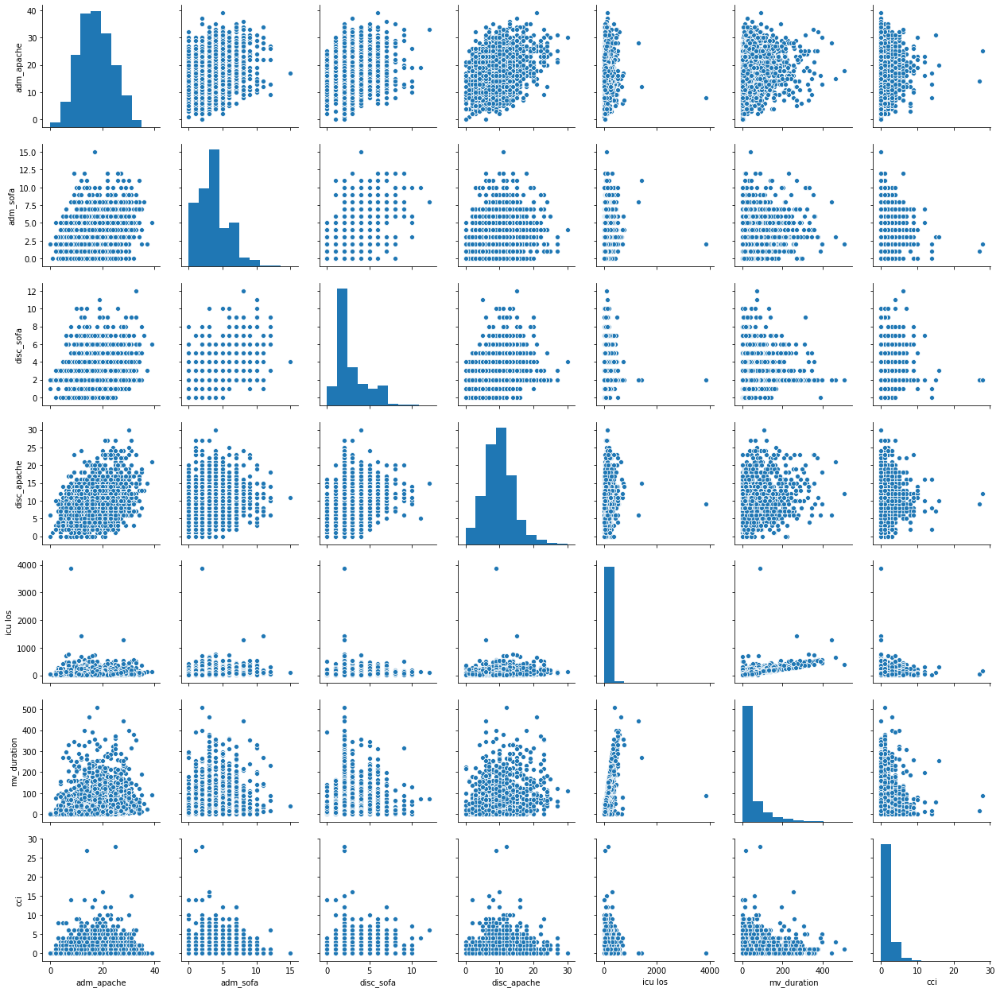

In [7]:

        
sns.pairplot(stats[features])




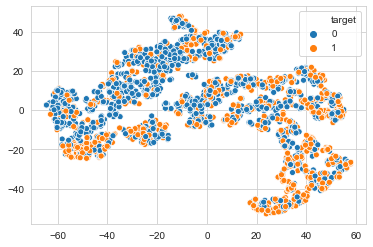

In [62]:

from sklearn.manifold import TSNE
import seaborn as sns


def tsneplot(X,y, plot=True):
    X_emb = TSNE(n_components=2,init='random').fit_transform(X, y)
    if plot:
        sns.scatterplot(X_emb[:,0],X_emb[:,1], hue=y)
    else:
        return X_emb


tsneplot(X_train, y_train)



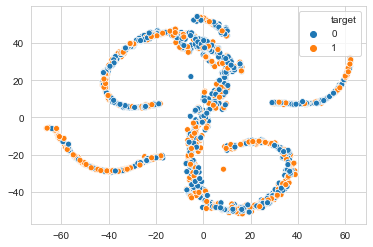

In [103]:

from sklearn.manifold import TSNE
import seaborn as sns


def tsneplot(X,y, plot=True):
    X_emb = TSNE(n_components=2,init='random').fit_transform(X, y)
    if plot:
        sns.scatterplot(X_emb[:,0],X_emb[:,1], hue=y)
    else:
        return X_emb


tsneplot(X_train_final, y_train_final)



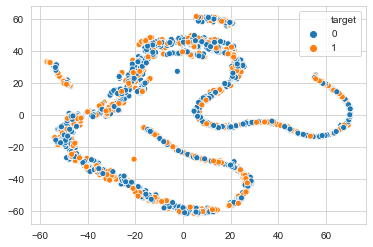

In [158]:
tsneplot(stats[features_final].fillna(0) , stats['target'])

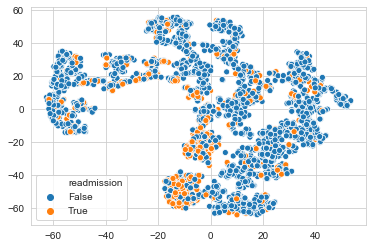

In [63]:
tsneplot(data[features], stats['readmission'])

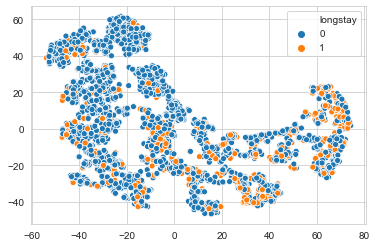

In [64]:
tsneplot(data[features], stats['longstay'])

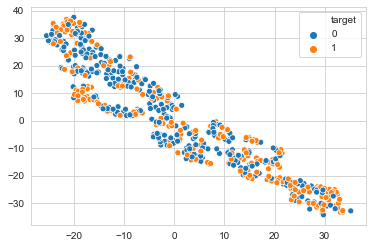

In [65]:
tsneplot(X_test, y_test)

Healthy discharge - Hospital Discharge without long stay and readmission

Mortality within Healthy discharge

We subset by non readmission (readmission priors mortality)

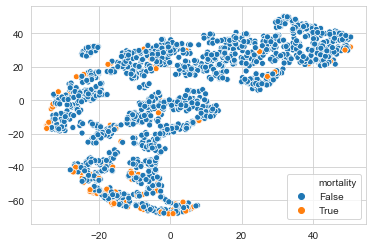

In [80]:
assert data.shape[0] == stats.shape[0]
vec = np.array([1,0,0])
vec = 1 - vec
col = name_vec[np.where(vec!=1)][0]
tsneplot(data[ (stats['readmission']!=vec[1]) & (stats['longstay']!=vec[2]) ][features], stats[ (stats['readmission']!=vec[1]) & (stats['longstay']!=vec[2]) ][col])

Readmission within healthy discharge

We take first admission, so each data row will never be a readmission case. But we have readmission column to indicate the case that tags with it. So we subset by non death (death case will never readmit, if death after readmitted then it will not be in the data because those are only first admission), and subset by non long stayer. 

According to slides,
P(B|A=0, C=0) , the probability of readmission out of discharges. The cluster is clearer when we look at smaller eligible set (vs healthy discharge).

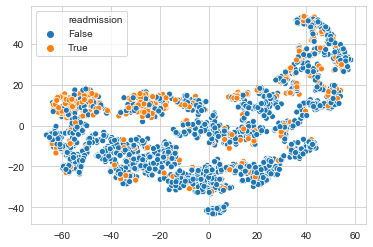

In [66]:
assert data.shape[0] == stats.shape[0]
vec = np.array([0,1,0])
vec = 1 - vec
col = name_vec[np.where(vec!=1)][0]
tsneplot(data[ (stats['mortality']!=vec[0]) & (stats['longstay']!=vec[2]) ][features], stats[ (stats['mortality']!=vec[0]) & (stats['longstay']!=vec[2]) ][col])

Long stay within healthy discharge

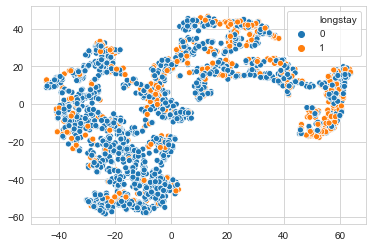

In [67]:
assert data.shape[0] == stats.shape[0]
vec = np.array([0,0,1])
vec = 1 - vec
col = name_vec[np.where(vec!=1)][0]
tsneplot(data[ (stats['mortality']!=vec[0]) & (stats['readmission']!=vec[1]) ][features], stats[ (stats['mortality']!=vec[0]) & (stats['readmission']!=vec[1]) ][col])

What we observe:
1. Mortality patients are highly separable from Healthy discharge patients.
2. Long stay patients slightly separable from Healthy discharge patients.
3. Mortality , readmision and long stay have tight relationship. And they should be positively associated, ie high mortality patient is likely to readmit (if survived) or having long hospital LOS.

To aggregate all condition, we end up detecting healthy discharge patient or in contrast aka Composite risky patient.

Average Precision : How good model can correctly identify all the positive examples without accidentally marking too many negative examples as positive.

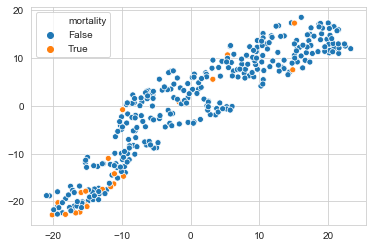

In [68]:
assert data.shape[0] == stats.shape[0]
vec = np.array([1,0,0])
vec = 1 - vec
col = name_vec[np.where(vec!=1)][0]
tsneplot(data.loc[y_test.index][ (stats.loc[y_test.index]['readmission']!=vec[1]) & (stats.loc[y_test.index]['longstay']!=vec[2]) ][features], stats.loc[y_test.index][ (stats.loc[y_test.index]['readmission']!=vec[1]) & (stats.loc[y_test.index]['longstay']!=vec[2]) ][col])

## 2. Model training

XGBoost

In [170]:
# from skopt import BayesSearch

Train performance

In [3]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
model_xg = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_rfc.fit(X_train.values, y_train.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg = CV_rfc.best_estimator_

{'subsample': 1.0, 'reg_lambda': 102.4, 'reg_alpha': 1, 'pos_weight_scale': 2.3999999999999995, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 50, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 1.0}
Wall time: 44.6 s


[[989 190]
 [309 544]]
defaultdict(<class 'list'>, {'tpr': 0.6377491207502931, 'fpr': 0.16115351993214588, 'fnr': 0.3622508792497069, 'tnr': 0.8388464800678541, 'acc': 0.7544291338582677, 'precision': 0.7411444141689373, 'AP': 0.7851808195176218, 'f1': 0.6855702583490864, 'cohenkappa': 0.4859686299161504, 'auroc': 0.7382978004090737})


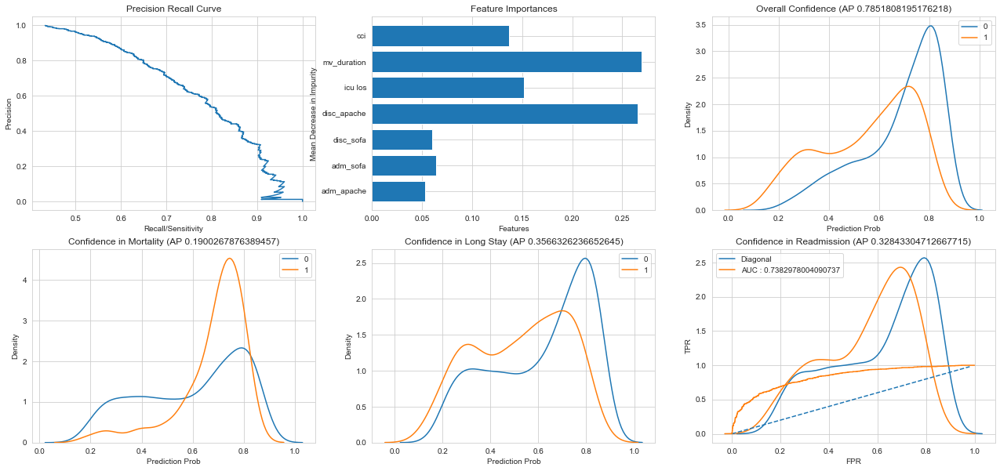

In [64]:
met = plot_eval(model_xg, X_train, y_train, features)

Test performance

[[236  67]
 [ 87 119]]
defaultdict(<class 'list'>, {'tpr': 0.5776699029126213, 'fpr': 0.22112211221122113, 'fnr': 0.4223300970873786, 'tnr': 0.7788778877887789, 'acc': 0.6974459724950884, 'precision': 0.6397849462365591, 'AP': 0.6794985191257221, 'f1': 0.6071428571428571, 'cohenkappa': 0.36217614893894023, 'auroc': 0.6782738953507002})


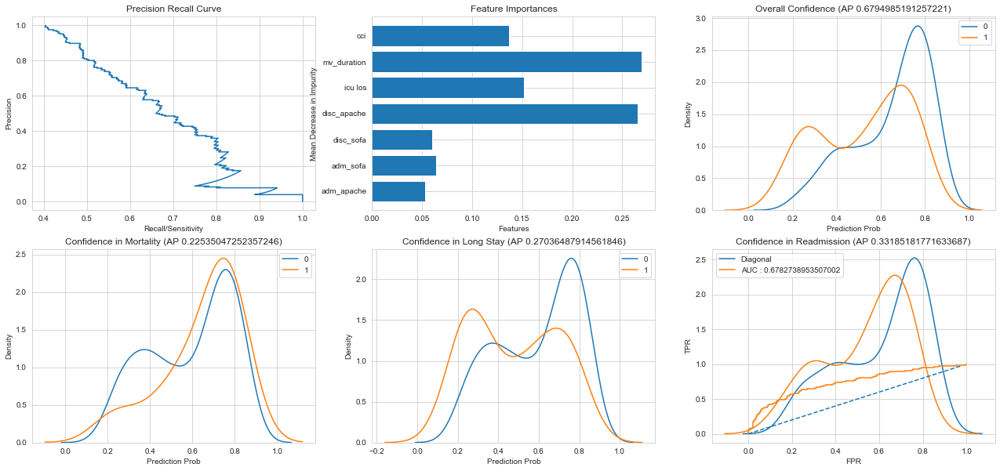

In [65]:
met_xg = plot_eval(model_xg, X_test, y_test,features)

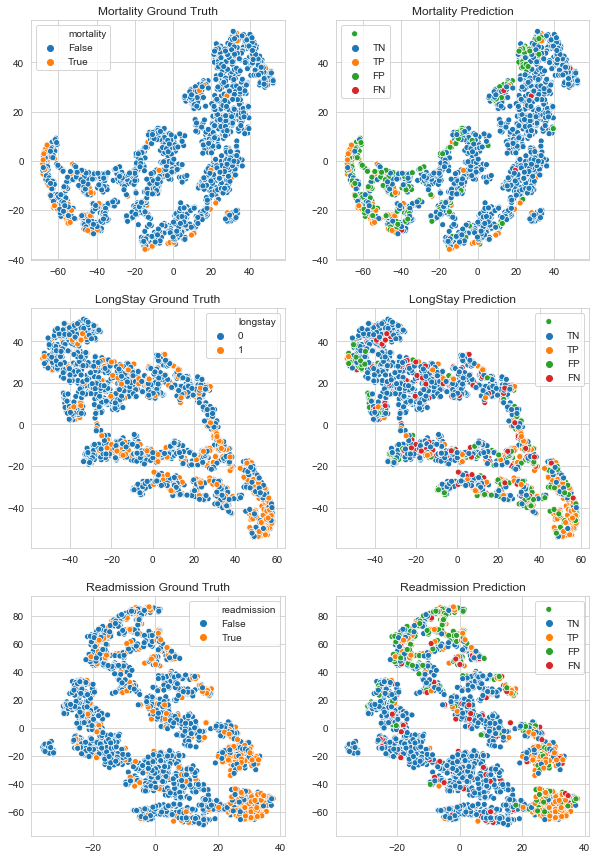

In [26]:
plot_model_scatter(model_xg)

What we observe during model inference

1. The APACHE, ICU LOS, MV duration has high explaining power to risky patient, most easily reflected in prediction of mortality cases.
2. It aligns with our tsne plot that mortality cases are highly separable from healthy patients.
3. Using our current variables could not explain still many of long stay and readmission cases, ie x% of long stay have normal ..

Control variables

In [66]:
control_features = [f for f in features if (f != 'disc_apache') & (f != 'adm_sofa')]
X1_train, X1_test, y1_train, y1_test = train_test_split(data[control_features], stats['target'], test_size=0.2, random_state=10)
test1_ind = y1_test.index
train1_ind = y1_train.index

In [67]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
# model_xg = xgbc(100,1,1,0)
model_xg_control = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg_control,param_distributions=xg_param_grid, scoring='accuracy' ,cv=8, n_iter=50, random_state=0)

CV_rfc.fit(X1_train.values, y1_train.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_control = CV_rfc.best_estimator_

{'subsample': 0.6, 'reg_lambda': 102.4, 'reg_alpha': 0.8, 'pos_weight_scale': 1.8999999999999997, 'n_estimators': 100, 'min_child_weight': 5, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 1.5, 'colsample_bytree': 0.6}
Wall time: 38.6 s


[[935 244]
 [391 462]]
defaultdict(<class 'list'>, {'tpr': 0.5416178194607268, 'fpr': 0.20695504664970313, 'fnr': 0.45838218053927315, 'tnr': 0.7930449533502969, 'acc': 0.6875, 'precision': 0.6543909348441926, 'AP': 0.6812642525233371, 'f1': 0.5926876202694036, 'cohenkappa': 0.34283089171520365, 'auroc': 0.6673313864055119})


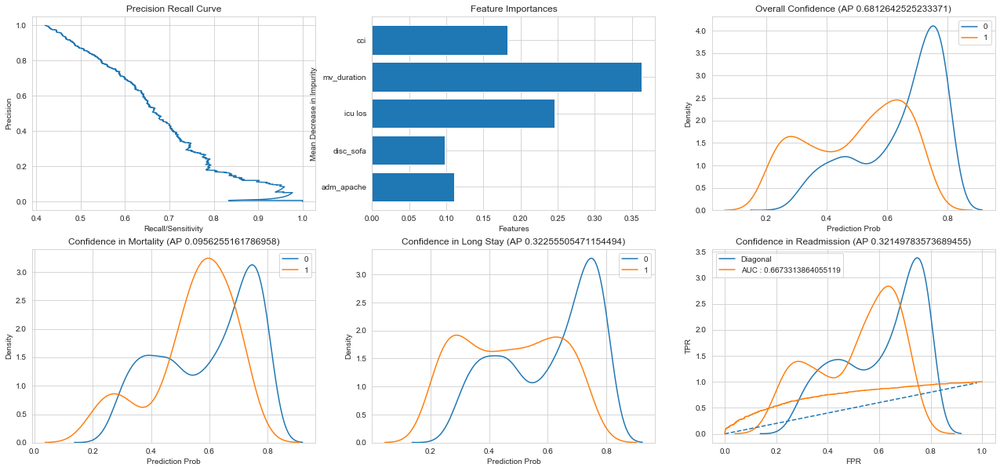

In [68]:
met_xg_control = plot_eval(model_xg_control, X1_train, y1_train, control_features)

[[228  75]
 [ 83 123]]
defaultdict(<class 'list'>, {'tpr': 0.5970873786407767, 'fpr': 0.24752475247524752, 'fnr': 0.4029126213592233, 'tnr': 0.7524752475247525, 'acc': 0.6895874263261297, 'precision': 0.6212121212121212, 'AP': 0.6408832726583684, 'f1': 0.6089108910891089, 'cohenkappa': 0.35174915363533776, 'auroc': 0.6747813130827646})


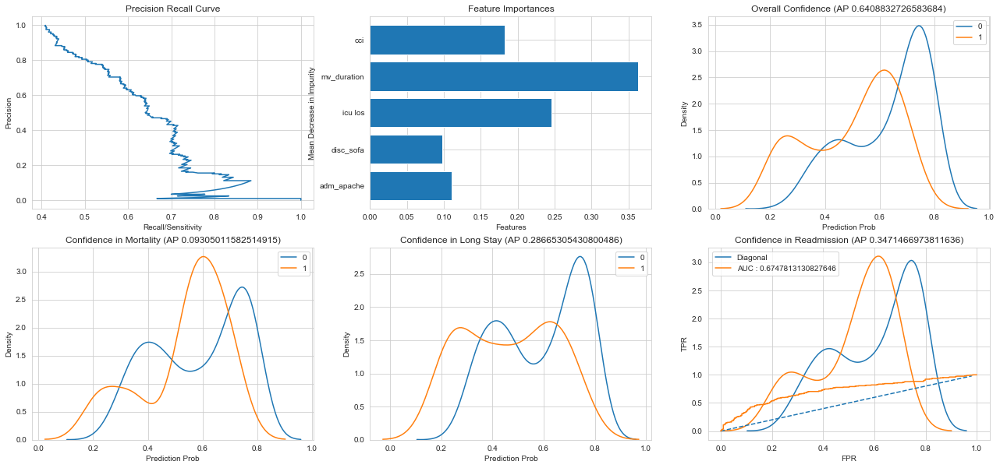

In [69]:
met_xg_control = plot_eval(model_xg_control, X1_test, y1_test, control_features)

0.6747813130827646

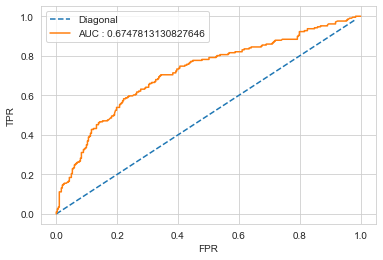

In [10]:
met_xg_control.roc

Logistic regression

In [70]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss


logit = LogisticRegression(random_state=0)
logit.fit(X_train.values,y_train)

# main_llk = log_loss(prediction,prediction_prob[:,1])


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

Clinician Approach

D:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


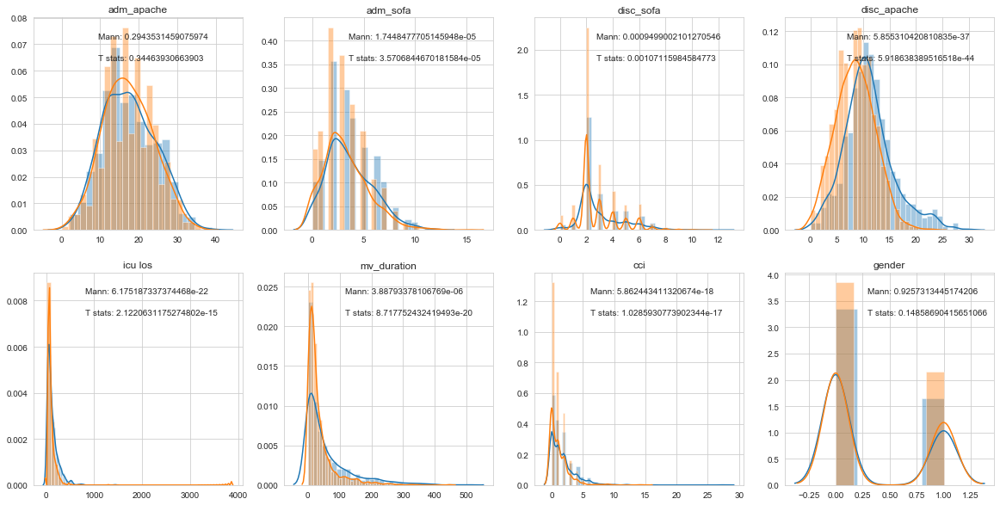

In [69]:
import scipy
from scipy.stats import ttest_ind

# batch_y = batch_gender.apply(lambda row: composite(row),1).values
batch_y = stats['target']
batch_x = stats[features+ ['gender']]
batch_x['gender'] = batch_x['gender'].apply(lambda x: 1 if x == 'Female' else 0)

_ , ax = plt.subplots(2,4,figsize=(20,10))
for i,factor in enumerate(features + ['gender']):
#     factor = 'SOFA_adm'

    a = batch_x[batch_y == 1][factor].values
    b = batch_x[batch_y == 0][factor].values
    # sns.violinplot(y=batch[factor], x=batch_y)
    sns.distplot(a,ax=ax[i//4, i%4])
    sns.distplot(b, ax=ax[i//4, i%4])
    xlim = ax[i//4, i%4].axes.get_xlim()[1] - ax[i//4, i%4].axes.get_xlim()[1] * 0.8
    ylim1 = ax[i//4, i%4].axes.get_ylim()[1] - ax[i//4, i%4].axes.get_ylim()[1] * 0.1
    ylim2 = ax[i//4, i%4].axes.get_ylim()[1] - ax[i//4, i%4].axes.get_ylim()[1] * 0.2
    whitney = scipy.stats.mannwhitneyu( a,b, alternative='greater')
    t = ttest_ind(a,b)
    ax[i//4, i%4].text(xlim,ylim1,s=f"Mann: {whitney.pvalue}")
    ax[i//4, i%4].text(xlim,ylim2,s=f'T stats: {t.pvalue}')
    ax[i//4, i%4].set_title(factor)


[[995 184]
 [499 354]]
defaultdict(<class 'list'>, {'tpr': 0.41500586166471276, 'fpr': 0.15606446140797287, 'fnr': 0.5849941383352872, 'tnr': 0.8439355385920272, 'acc': 0.6638779527559056, 'precision': 0.6579925650557621, 'AP': 0.6288739711589474, 'f1': 0.5089863407620417, 'cohenkappa': 0.2728728275607696, 'auroc': 0.6294707001283699})


0.6294707001283699

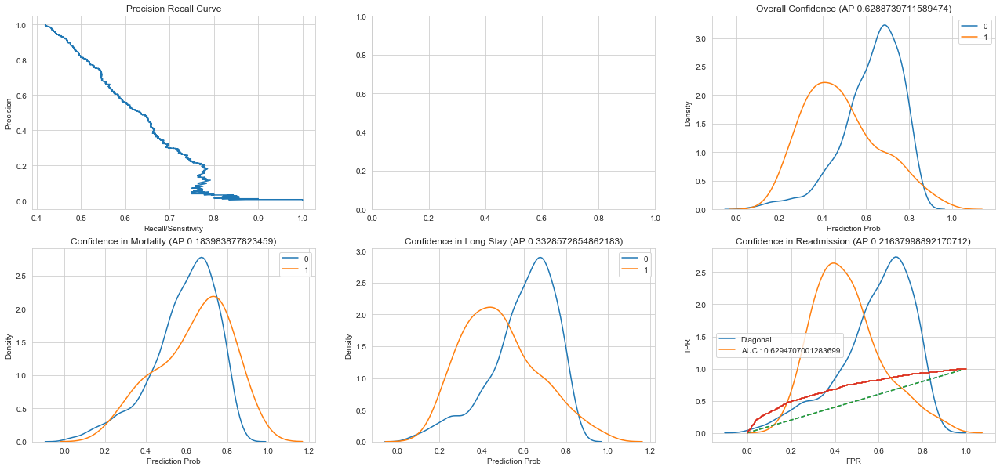

In [71]:
met_log = plot_eval(logit, X_train, y_train, features)
met_log.roc

[[255  48]
 [122  84]]
defaultdict(<class 'list'>, {'tpr': 0.4077669902912621, 'fpr': 0.15841584158415842, 'fnr': 0.5922330097087378, 'tnr': 0.8415841584158416, 'acc': 0.6660117878192534, 'precision': 0.6363636363636364, 'AP': 0.5919009872707639, 'f1': 0.4970414201183432, 'cohenkappa': 0.2645633956042087, 'auroc': 0.6246755743535518})


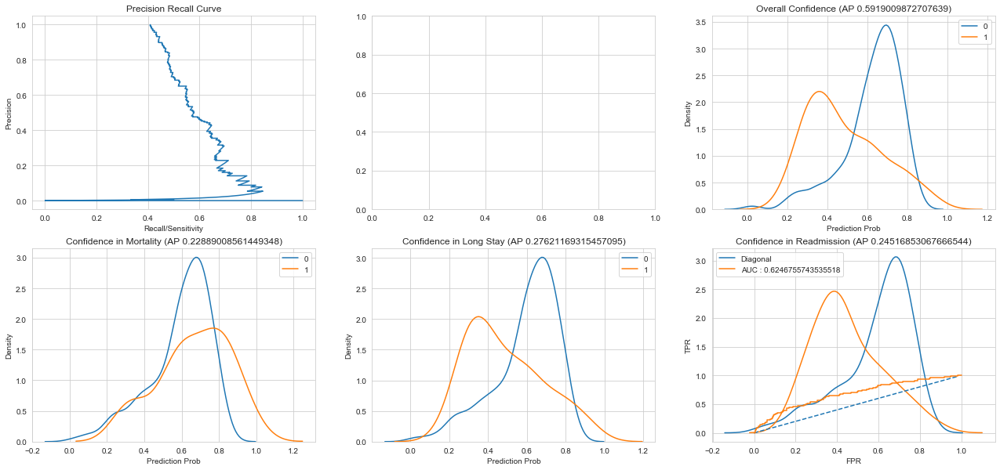

In [72]:
met_logit = plot_eval(logit, X_test, y_test, features)

In [14]:
logit.coef_

array([[-0.03425854,  0.01046315,  0.00479301,  0.11728444,  0.00154091,
         0.0030099 ,  0.1793729 ]])

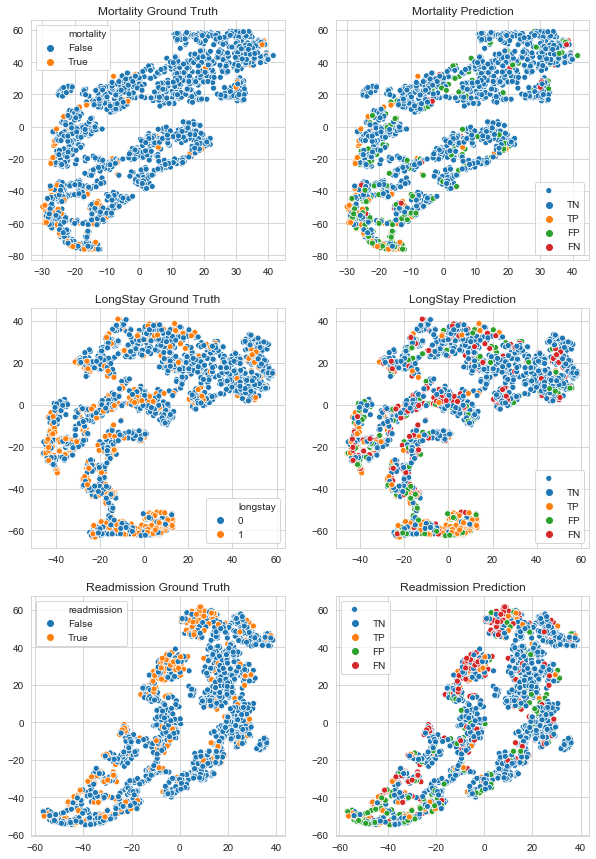

In [29]:
plot_model_scatter(logit)

EBM

In [ ]:

model_ebm = EBC(random_state=100)
# ebm
# 
param_dict = {
    
    'max_bins': [10,20,50,70,90,120,150,170,200,256,270,295,320,350],
    'max_interaction_bins' : [5,8,10,12,15,18,20,25,27,50,70,90],
    'binning':["uniform", "quantile", "quantile_humanized"],
    'outer_bags' : [0,1,2,4,6,8,10,12,15,17],
    'inner_bags' : [0,1,2,4,6,8,10,12,15,17],
    'learning_rate' : [1e-5,5e-5,1e-4,5e-4,1e-3,5e-3,1e-2,3e-2,5e-2,0.1,0.2,0.4],
    'min_samples_leaf' : [1,2,3,4,5,6,7,8,9],
    'max_leaves' : [2,3,4,5,6,7,8,9]
}


CV_ebm = RandomizedSearchCV(estimator=model_ebm,param_distributions=param_dict, scoring='accuracy' ,cv=5)

CV_ebm.fit(X_train.values.astype(float), y_train.values.astype(float))
print(CV_ebm.best_params_)

### use best fit
model_ebm = CV_ebm.best_estimator_

ebm_map = dict(zip(model_ebm.feature_names[:len(features)], features))
ebm_feature_inter = []
for s in model_ebm.feature_names:
    l = s.split(' ')
    text = ''
    for t in l:
        if t in ebm_map:
            text += ebm_map[t]
            text += ' '
    ebm_feature_inter += [text]   
    
    
plt.bar(ebm_feature_inter,model_ebm.feature_importances_)
plt.xticks(rotation='vertical')
plt.title('Feature Importance')

In [ ]:
met_ebm = plot_eval(model_ebm,X_train,y_train, features)

In [ ]:
met_ebm = plot_eval(model_ebm,X_test,y_test, features)

Shallow Neural Network

In [23]:
#mlp
import torch
from torch import nn
from tqdm import tqdm


class mlp(nn.Module):
    def __init__(self, channel, hidden_dim=64, hidden_layer=2):
        super().__init__()
        self.hiddenLayer = []
        self.layer1 = nn.Sequential(nn.Linear(channel, hidden_dim),
                                    nn.BatchNorm1d(hidden_dim),
                                    nn.Tanh())
        for l in range(hidden_layer):
            self.hiddenLayer += [nn.Linear(hidden_dim,hidden_dim)]
            self.hiddenLayer += [nn.BatchNorm1d(hidden_dim)]
            self.hiddenLayer += [nn.Tanh()]
            self.hiddenLayer += [nn.Dropout(0.2)]
        self.hiddenLayer = nn.Sequential(*self.hiddenLayer)
        self.lastlayer = nn.Linear(hidden_dim,1)
    def forward(self,x):
        if isinstance(x,torch.Tensor):
            out = self.layer1(x)
            out = self.hiddenLayer(out)
            out = self.lastlayer(out)
            return out
        else:
            print('Evaluation mode')
            if isinstance(x,np.ndarray):
                x = (x - x.mean(0))/x.std(0)
                x = torch.tensor(x).float()
                out = self.layer1(x)
                out = self.hiddenLayer(out)
                out = self.lastlayer(out)
                return out.detach().numpy()
            else:
                raise NotImplementedError
    
def loader(X, y, batchsize=5):
    ind = np.arange(len(X))
#     np.random.seed(10)
    np.random.shuffle(ind)
    for i in range(len(ind)//batchsize):
        batchind = ind[i*batchsize : (i+1)*batchsize]
        yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))

In [77]:
xnorm = (X_train - X_train.mean())/ X_train.std()
xnorm = torch.tensor(xnorm.values).to(torch.float)

xtestnorm = (X_test - X_test.mean())/ X_test.std()
xtestnorm = torch.tensor(xtestnorm.values).to(torch.float)
ytestt = torch.tensor(y_test.values)

acc_fn = lambda out,y : ((out > 0.5).view(-1).to(torch.float).numpy()  == y.view(-1).numpy()).mean()

torch.manual_seed(0)
model_mlp = mlp(len(features),256)
criterion = torch.nn.BCELoss()
optimizer = torch.optim.SGD(model_mlp.parameters(), lr=0.001)
batchsize = 8
epoch_loss = []
test_loss = []
test_acc = []

for e in range(50):
    model_mlp.train()
    acc = []
    loader1 = loader(xnorm, y_train.values,batchsize)
    bar = tqdm(loader1,total=batchsize,bar_format=f'Epoch {e}')
    batch_loss = []
    for (x,y) in bar:
        y = y[:,None].to(torch.float)
        out = model_mlp(x)
        out = torch.sigmoid(out)
        loss = criterion(out,y )
        loss.backward()
        batch_loss += [loss.detach().item()]
        optimizer.step()
        optimizer.zero_grad()
        acc += [acc_fn(out,y)]
    epoch_loss += [np.mean(batch_loss)]
    print(f'Train Accuracy {np.mean(acc)}')
    model_mlp.eval()
    pred = torch.sigmoid(model_mlp(xtestnorm))
    test_loss += [criterion(pred,ytestt.to(torch.float)).detach().item()]
    print(f'Test accuracy {acc_fn(pred,ytestt)}')
    test_acc += [acc_fn(pred,ytestt)]

Epoch 0D:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
Epoch 0


Train Accuracy 0.59251968503937


D:\ProgramData\Anaconda3\lib\site-packages\torch\nn\functional.py:2016: UserWarning: Using a target size (torch.Size([509])) that is different to the input size (torch.Size([509, 1])) is deprecated. Please ensure they have the same size.
  "Please ensure they have the same size.".format(target.size(), input.size()))


Test accuracy 0.630648330058939


Epoch 1


Train Accuracy 0.6333661417322834
Test accuracy 0.6463654223968566


Epoch 2


Train Accuracy 0.6496062992125984
Test accuracy 0.6463654223968566


Epoch 3


Train Accuracy 0.6545275590551181
Test accuracy 0.6542239685658153


Epoch 4


Train Accuracy 0.656496062992126
Test accuracy 0.656188605108055


Epoch 5


Train Accuracy 0.656003937007874
Test accuracy 0.6660117878192534


Epoch 6


Train Accuracy 0.6584645669291339
Test accuracy 0.6699410609037328


Epoch 7


Train Accuracy 0.6609251968503937
Test accuracy 0.6699410609037328


Epoch 8


Train Accuracy 0.6609251968503937
Test accuracy 0.6679764243614931


Epoch 9


Train Accuracy 0.6638779527559056
Test accuracy 0.6719056974459725


Epoch 10


Train Accuracy 0.6648622047244095
Test accuracy 0.6620825147347741


Epoch 11


Train Accuracy 0.6653543307086615
Test accuracy 0.6601178781925344


Epoch 12


Train Accuracy 0.6678149606299213
Test accuracy 0.6620825147347741


Epoch 13


Train Accuracy 0.6643700787401575
Test accuracy 0.6620825147347741


Epoch 14


Train Accuracy 0.6658464566929134
Test accuracy 0.6620825147347741


Epoch 15


Train Accuracy 0.6678149606299213
Test accuracy 0.6601178781925344


Epoch 16


Train Accuracy 0.6663385826771654
Test accuracy 0.6601178781925344


Epoch 17


Train Accuracy 0.6653543307086615
Test accuracy 0.6660117878192534


Epoch 18


Train Accuracy 0.6619094488188977
Test accuracy 0.6699410609037328


Epoch 19


Train Accuracy 0.6678149606299213
Test accuracy 0.6699410609037328


Epoch 20


Train Accuracy 0.6653543307086615
Test accuracy 0.6699410609037328


Epoch 21


Train Accuracy 0.6643700787401575
Test accuracy 0.6758349705304518


Epoch 22


Train Accuracy 0.6633858267716536
Test accuracy 0.6758349705304518


Epoch 23


Train Accuracy 0.6658464566929134
Test accuracy 0.6758349705304518


Epoch 24


Train Accuracy 0.6653543307086615
Test accuracy 0.6758349705304518


Epoch 25


Train Accuracy 0.6628937007874016
Test accuracy 0.6719056974459725


Epoch 26


Train Accuracy 0.6658464566929134
Test accuracy 0.6719056974459725


Epoch 27


Train Accuracy 0.6638779527559056
Test accuracy 0.6719056974459725


Epoch 28


Train Accuracy 0.6648622047244095
Test accuracy 0.6699410609037328


Epoch 29


Train Accuracy 0.6628937007874016
Test accuracy 0.6699410609037328


Epoch 30


Train Accuracy 0.6653543307086615
Test accuracy 0.6699410609037328


Epoch 31


Train Accuracy 0.6653543307086615
Test accuracy 0.6699410609037328


Epoch 32


Train Accuracy 0.6643700787401575
Test accuracy 0.6699410609037328


Epoch 33


Train Accuracy 0.6638779527559056
Test accuracy 0.6679764243614931


Epoch 34


Train Accuracy 0.6668307086614174
Test accuracy 0.6679764243614931


Epoch 35


Train Accuracy 0.6663385826771654
Test accuracy 0.6679764243614931


Epoch 36


Train Accuracy 0.6633858267716536
Test accuracy 0.6699410609037328


Epoch 37


Train Accuracy 0.6673228346456693
Test accuracy 0.6699410609037328


Epoch 38


Train Accuracy 0.6633858267716536
Test accuracy 0.6699410609037328


Epoch 39


Train Accuracy 0.6633858267716536
Test accuracy 0.6699410609037328


Epoch 40


Train Accuracy 0.6663385826771654
Test accuracy 0.6699410609037328


Epoch 41


Train Accuracy 0.6653543307086615
Test accuracy 0.6719056974459725


Epoch 42


Train Accuracy 0.6653543307086615
Test accuracy 0.6699410609037328


Epoch 43


Train Accuracy 0.6658464566929134
Test accuracy 0.6719056974459725


Epoch 44


Train Accuracy 0.6653543307086615
Test accuracy 0.6699410609037328


Epoch 45


Train Accuracy 0.6633858267716536
Test accuracy 0.6660117878192534


Epoch 46


Train Accuracy 0.6648622047244095
Test accuracy 0.6660117878192534


Epoch 47


Train Accuracy 0.6658464566929134
Test accuracy 0.6660117878192534


Epoch 48


Train Accuracy 0.6633858267716536
Test accuracy 0.6640471512770137


Epoch 49


Train Accuracy 0.6648622047244095
Test accuracy 0.6640471512770137


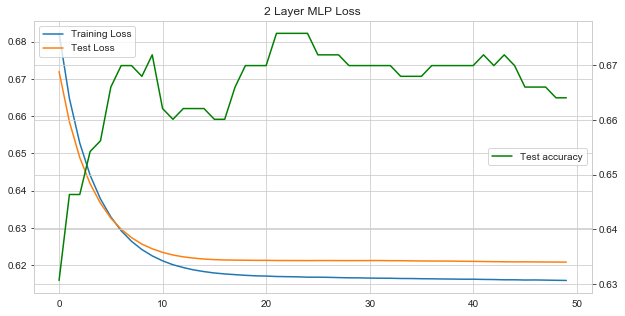

In [78]:
_, ax = plt.subplots(figsize=(10,5))
ax.plot(epoch_loss)
ax.plot(test_loss)
ax.set_title('2 Layer MLP Loss')
ax.legend(['Training Loss','Test Loss'],loc='upper left')

ax1 = ax.twinx()
ax1.plot(test_acc, color='green')
ax1.legend(['Test accuracy'],loc='center right')


Evaluation mode
Average Precision 0.6287490481670883


defaultdict(list,
            {'tpr': 0.2637749120750293,
             'fpr': 0.06700593723494487,
             'fnr': 0.7362250879249707,
             'tnr': 0.9329940627650551,
             'acc': 0.6520669291338582,
             'precision': 0.7401315789473685,
             'AP': 0.6287490481670883,
             'f1': 0.38893690579083834,
             'cohenkappa': 0.21598777559484839,
             'auroc': 0.5983844874200421})

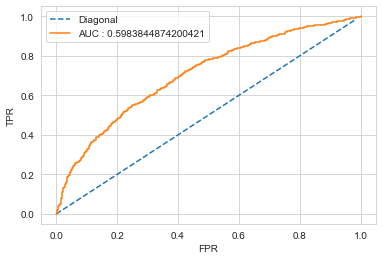

In [28]:
pred = model_mlp(X_train.values)
met_nn = Evaluation(y_train.values,pred)
print('Average Precision',sk_metrics.average_precision_score(y_train.values,pred))
met_nn.rate()

Evaluation mode
Average Precision 0.6069131865294174


defaultdict(list,
            {'tpr': 0.2815533980582524,
             'fpr': 0.0858085808580858,
             'fnr': 0.7184466019417476,
             'tnr': 0.9141914191419142,
             'acc': 0.6581532416502947,
             'precision': 0.6904761904761905,
             'AP': 0.6069131865294174,
             'f1': 0.39999999999999997,
             'cohenkappa': 0.21624396028388881,
             'auroc': 0.5978724086000833})

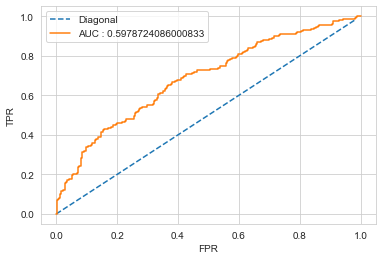

In [94]:
pred = model_mlp(X_test.values)
met_nn = Evaluation(y_test.values,pred)
print('Average Precision',sk_metrics.average_precision_score(y_test.values,pred))
met_nn.rate()

##### quadratic weighted cohen kappa
##### mljar supervised


## 3. Add more dimensions

We added dimensions that are significant in univariate analysis from file CH ML 13OCT2022.xlsx

In [5]:
features2 = features + ['chronic',
                        'comorb_Heart Failure',
                        'comorb_Stroke',
                        'comorb_Kidney',
                        'comorb_COPD',
                        'PULSE',
                        'R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE',
                        'R CPN GLASGOW COMA SCALE SCORE',
                        'POCT PCO2','BICARBONATE, SERUM']
data2 = stats[features2]
X_train2, X_test2, y_train2, y_test2 = train_test_split(data2, stats['target'], test_size=0.2, random_state=10)
test_ind2 = y_test2.index
train_ind2 = y_train2.index

In [ ]:
# can use 0.2, but remove those with 10% data

In [80]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
model_xg = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_rfc.fit(X_train2.values, y_train2.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_extra = CV_rfc.best_estimator_

{'subsample': 1.0, 'reg_lambda': 25.6, 'reg_alpha': 1, 'pos_weight_scale': 2.1999999999999997, 'n_estimators': 200, 'min_child_weight': 5, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 1, 'colsample_bytree': 1.0}
Wall time: 1min 20s


[[1011  168]
 [ 304  549]]
defaultdict(<class 'list'>, {'tpr': 0.6436107854630715, 'fpr': 0.14249363867684478, 'fnr': 0.3563892145369285, 'tnr': 0.8575063613231552, 'acc': 0.7677165354330708, 'precision': 0.7656903765690377, 'AP': 0.8137540041709018, 'f1': 0.6993630573248407, 'cohenkappa': 0.5124120632138272, 'auroc': 0.7505585733931134})


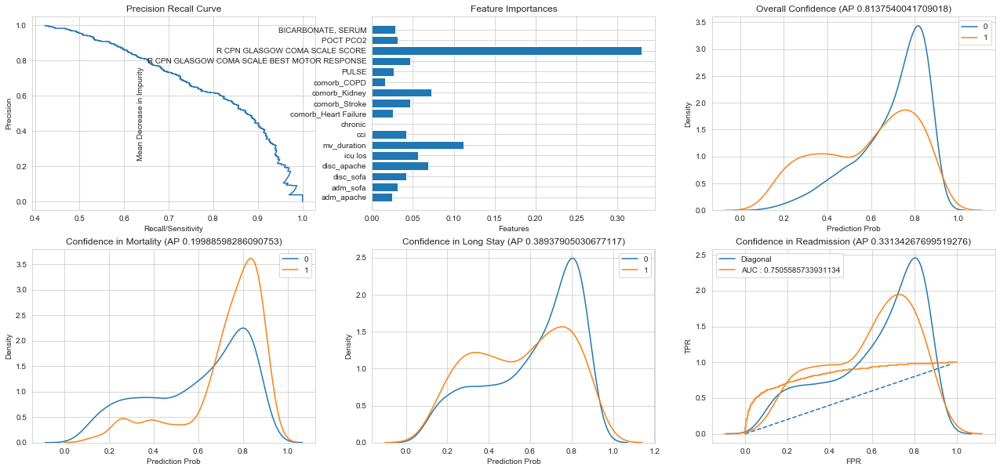

In [81]:
met_extra = plot_eval(model_xg_extra, X_train2, y_train2)

[[252  51]
 [ 88 118]]
defaultdict(<class 'list'>, {'tpr': 0.5728155339805825, 'fpr': 0.16831683168316833, 'fnr': 0.42718446601941745, 'tnr': 0.8316831683168316, 'acc': 0.7269155206286837, 'precision': 0.6982248520710059, 'AP': 0.7105248354189592, 'f1': 0.6293333333333333, 'cohenkappa': 0.4164721601359209, 'auroc': 0.702249351148707})


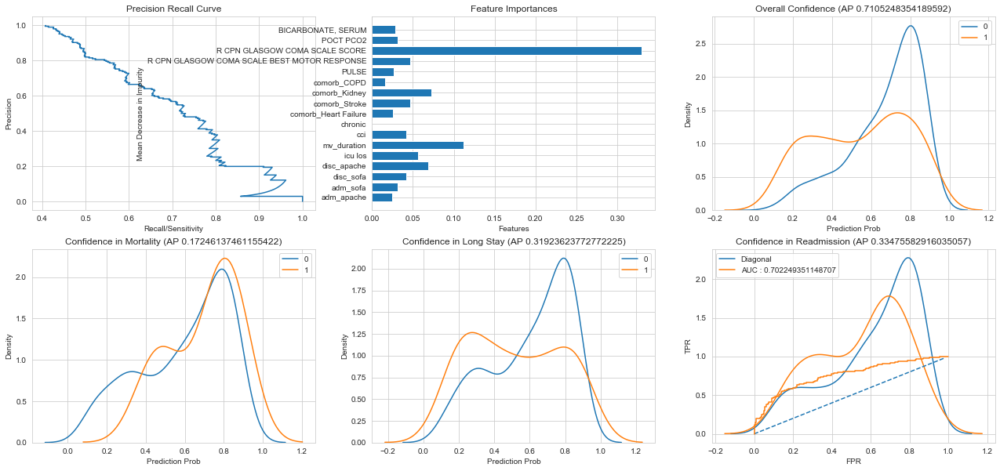

In [82]:
met_extra = plot_eval(model_xg_extra, X_test2, y_test2)

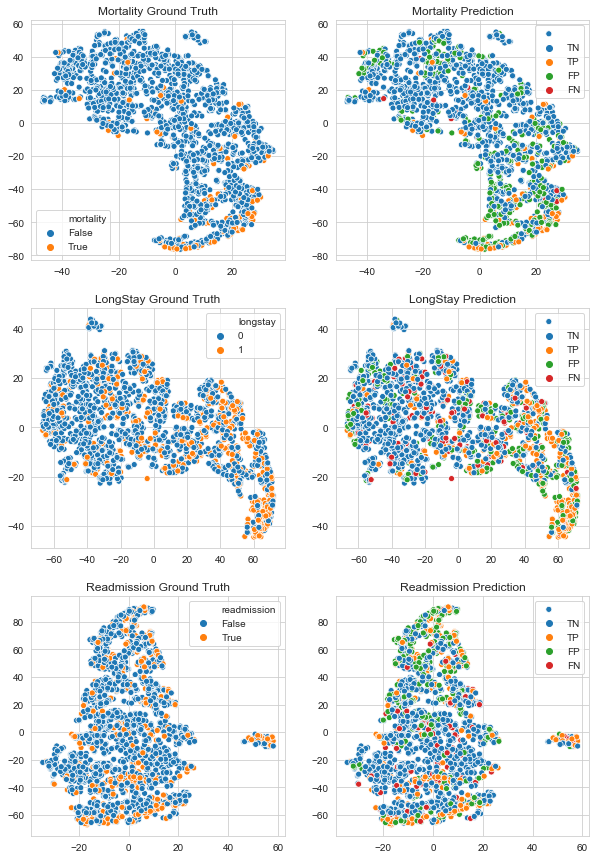

In [61]:
plot_model_scatter(model_xg_extra,data2.fillna(0),features2)

### CV Scoring setting

Training based on F1 gives us overfitted (compared to scoring "accuracy" ) model (kappa score higher in training data), but slightly higher in sensitivity.

In [83]:
#CV based on accuracy

%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
# model_xg = xgbc(100,1,1,0)
model_xg = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg,param_distributions=xg_param_grid, scoring='f1' ,cv=8 ,n_iter=50)

CV_rfc.fit(X_train2.values, y_train2.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg = CV_rfc.best_estimator_

Wall time: 0 ns


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


{'subsample': 0.6, 'reg_lambda': 25.6, 'reg_alpha': 2, 'pos_weight_scale': 1.5999999999999996, 'n_estimators': 10, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 1.0}


[[947 232]
 [320 533]]
defaultdict(<class 'list'>, {'tpr': 0.6248534583821805, 'fpr': 0.1967769296013571, 'fnr': 0.37514654161781946, 'tnr': 0.8032230703986429, 'acc': 0.7283464566929134, 'precision': 0.6967320261437908, 'AP': 0.7325981152606964, 'f1': 0.6588380716934487, 'cohenkappa': 0.43427047954138986, 'auroc': 0.7140382643904117})


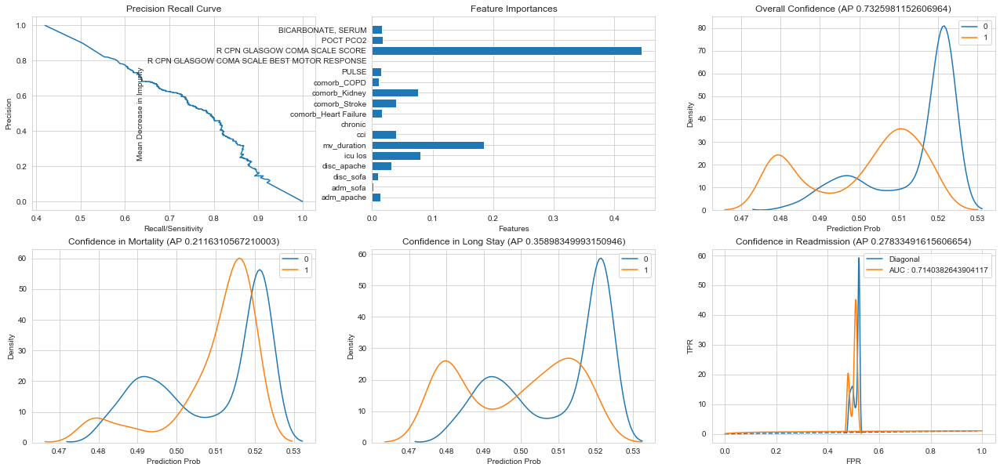

In [84]:
met_extra_f1 = plot_eval(model_xg, X_train2, y_train2)

[[236  67]
 [ 82 124]]
defaultdict(<class 'list'>, {'tpr': 0.6019417475728155, 'fpr': 0.22112211221122113, 'fnr': 0.39805825242718446, 'tnr': 0.7788778877887789, 'acc': 0.7072691552062869, 'precision': 0.6492146596858639, 'AP': 0.6519180796194832, 'f1': 0.6246851385390428, 'cohenkappa': 0.3853105421418209, 'auroc': 0.6904098176807972})


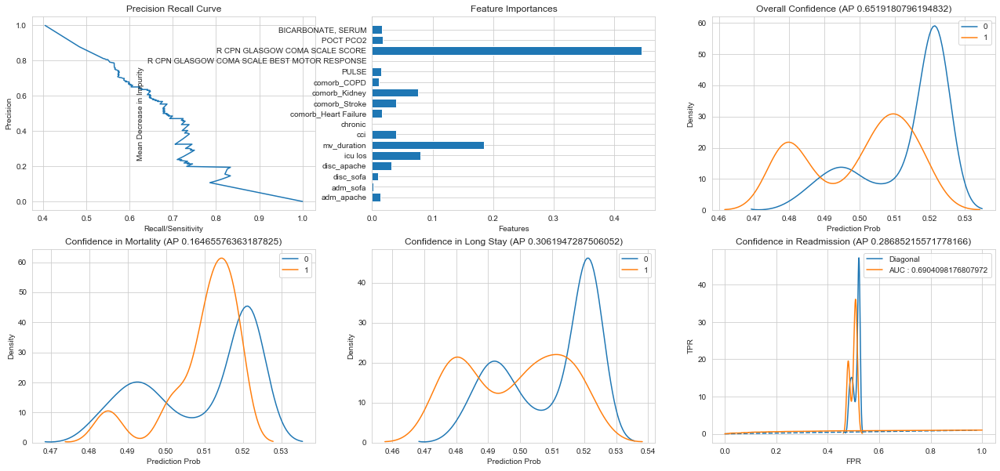

In [85]:
met_extra_f1 = plot_eval(model_xg, X_test2, y_test2)

ExtraDims is prone to overfitting since there are more variables, performing best only at training set, so we regularize the hyperparameters so the model can be kept simple.

Standard uses 120 trees and 15 depths, compare to ExtraDims only use 10 trees, 3 depths

,StandardXGB,ControlDims,EBM,Logits,MLP,XGBExtraDims
tpr,0.577670,0.597087,0.558252,0.407767,0.276699,0.572816
fpr,0.221122,0.247525,0.217822,0.158416,0.082508,0.168317
fnr,0.422330,0.402913,0.441748,0.592233,0.723301,0.427184
tnr,0.778878,0.752475,0.782178,0.841584,0.917492,0.831683
acc,0.697446,0.689587,0.691552,0.666012,0.658153,0.726916
precision,0.639785,0.621212,0.635359,0.636364,0.695122,0.698225
AP,0.679499,0.640883,0.674800,0.591901,0.606987,0.710525
f1,0.607143,0.608911,0.594315,0.497041,0.395833,0.629333
cohenkappa,0.362176,0.351749,0.347175,0.264563,0.214896,0.416472
auroc,0.678274,0.674781,0.670215,0.624676,0.597095,0.702249


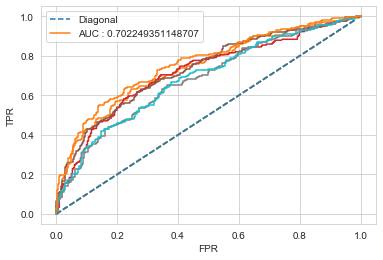

In [51]:
pd.concat([pd.Series(met_xg.rate()).rename('StandardXGB'),pd.Series(met_xg_control.rate()).rename('ControlDims'),pd.Series(met_ebm.rate()).rename('EBM'),pd.Series(met_logit.rate()).rename('Logits'), pd.Series(met_nn.rate()).rename('MLP'),pd.Series(met_extra.rate()).rename('XGBExtraDims')],1)
# plt.legend.remove()

## 4. Go ALL

In [3]:

stats['resp_secretion_6_pos'] = stats['resp_secretion_6_Large'].fillna(0) + stats['resp_secretion_6_Moderate'].fillna(0)
stats['resp_secretion_6_pos'] = stats['resp_secretion_6_pos'] > 0
stats['gender_male'] = stats['gender'] == 'Male'

all_features  = ['chronic',
 'comorb_Heart Failure',
 'comorb_Stroke',
 'comorb_Kidney',
 'comorb_COPD',
 'PULSE',
 'R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE',
 'R CPN GLASGOW COMA SCALE SCORE',
 'POCT PCO2',
 'BICARBONATE, SERUM',
 'disc_sofa',
 'resp_secretion_6_pos',
 'comorb_Others: TB/ ILD/ Chest wall deformity/OSA/ Bronchiectasis',
 'PULSE OXIMETRY',
 'RESPIRATIONS',
 'gender_male',
 'comorb_Pneumonia',
 'R BMI',
 'POCT PO2',
 'PO2/FIO2',
 'adm_apache',
 'vasopresser',
 'FIO2, ABG',
 'input/output',
 'comorb_Cirrhosis',
 'comorb_Immuno',
 'age',
 'cci',
 'mv_duration',
 'icu los',
 'POCT PH',
 'adm_sofa',
]
### disch apache??

data_all = stats[all_features].fillna(0)

X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(data_all, stats['target'], test_size=0.2, random_state=10)


In [5]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
#                  'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
model_xg_all = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg_all,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_rfc.fit(X_train_all.values, y_train_all.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_all = CV_rfc.best_estimator_

{'subsample': 0.6, 'reg_lambda': 0.5, 'reg_alpha': 1, 'n_estimators': 120, 'min_child_weight': 10, 'max_depth': 6, 'learning_rate': 0.03, 'gamma': 1, 'colsample_bytree': 1.0}
CPU times: total: 11min 9s
Wall time: 1min 29s


[[1069  110]
 [ 263  590]]
defaultdict(<class 'list'>, {'tpr': 0.6916764361078547, 'fpr': 0.09329940627650551, 'fnr': 0.3083235638921454, 'tnr': 0.9067005937234945, 'acc': 0.8164370078740157, 'precision': 0.8428571428571429, 'AP': 0.8784422512062071, 'f1': 0.7598197037990986, 'cohenkappa': 0.6135928903245278, 'auroc': 0.7991885149156746})


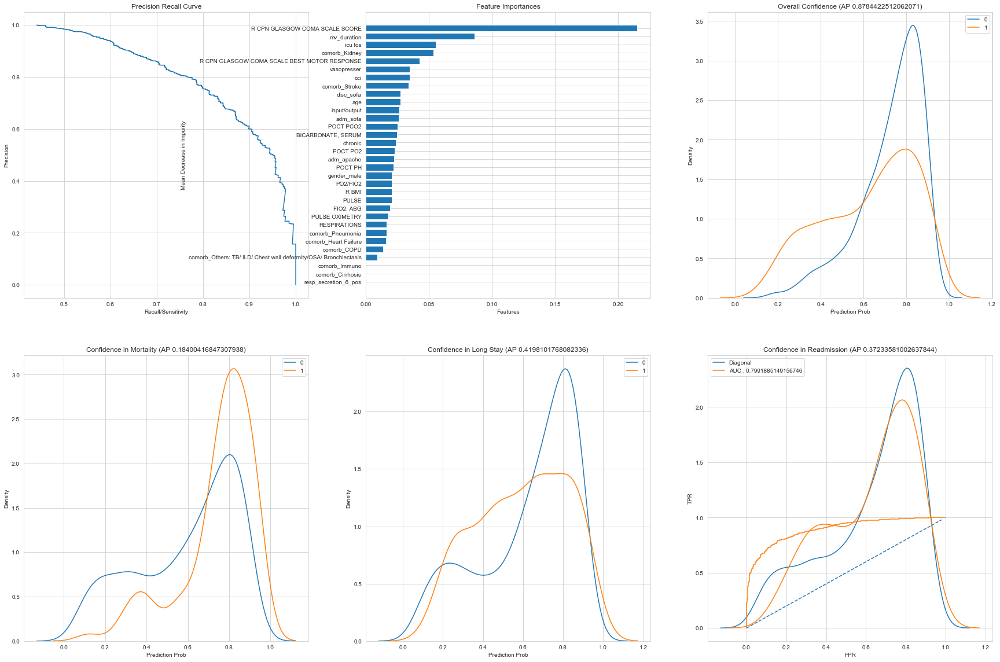

In [161]:
met_all = plot_eval(model_xg_all, X_train_all, y_train_all)

[[252  51]
 [ 88 118]]
defaultdict(<class 'list'>, {'tpr': 0.5728155339805825, 'fpr': 0.16831683168316833, 'fnr': 0.42718446601941745, 'tnr': 0.8316831683168316, 'acc': 0.7269155206286837, 'precision': 0.6982248520710059, 'AP': 0.6976458180491654, 'f1': 0.6293333333333333, 'cohenkappa': 0.4164721601359209, 'auroc': 0.702249351148707})


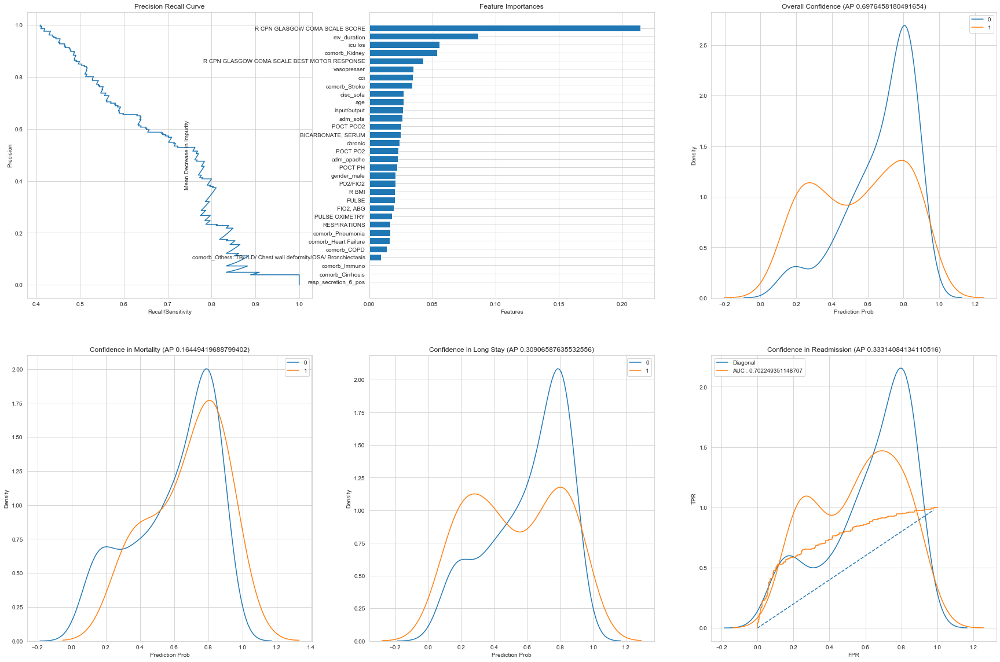

In [162]:
met_all = plot_eval(model_xg_all, X_test_all, y_test_all)

In [48]:
print('These variables are the additional from Model 3, but the performance did not improve')
print(set(all_features) - set(features2))

These variables are the additional from Model 3, but the performance did not improve
{'gender_male', 'comorb_Others: TB/ ILD/ Chest wall deformity/OSA/ Bronchiectasis', 'input/output', 'R BMI', 'POCT PH', 'PO2/FIO2', 'age', 'RESPIRATIONS', 'vasopresser', 'resp_secretion_6_pos', 'POCT PO2', 'comorb_Immuno', 'comorb_Pneumonia', 'FIO2, ABG', 'comorb_Cirrhosis', 'PULSE OXIMETRY'}


### 5. Dimensions that are siginificant from multivariate analysis 

Check email thread RE  univariate analysis (p 0 2 and  0 05).msg

For univariate p<0.2
- Age, GCS (RCPNGLASGOWCOMASCALESCORE), CCI, ICU LOS, discharge SOFA and gender came out to be significant (p-value<0.05)

For univariate p<0.05
- Age, GCS (RCPNGLASGOWCOMASCALESCORE), CCI, POCTPH, ICU LOS, discharge SOFA and gender came out to be significant (p-value<0.05)

In [188]:

# mul_sig_var = ['age','R CPN GLASGOW COMA SCALE SCORE', 'cci','POCT PH','icu los','disc_sofa','gender_male'] 
mul_sig_var = ['age','R CPN GLASGOW COMA SCALE SCORE', 'cci','icu los','disc_sofa','gender_male']


data_mul = stats[mul_sig_var].fillna(0)

X_train_mul, X_test_mul, y_train_mul, y_test_mul = train_test_split(data_mul, stats['target'], test_size=0.2, random_state=10)


In [189]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,4,5,6,7,8,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'pos_weight_scale' : np.arange(0.5,4,0.1),
                }
model_xg_mul = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_xg_mul,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_rfc.fit(X_train_mul.values, y_train_mul.values)
print(CV_rfc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_mul = CV_rfc.best_estimator_

D:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'subsample': 1.0, 'reg_lambda': 102.4, 'reg_alpha': 1, 'pos_weight_scale': 2.3999999999999995, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 50, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 1.0}
Wall time: 37.7 s


[[1009  170]
 [ 366  487]]
defaultdict(<class 'list'>, {'tpr': 0.570926143024619, 'fpr': 0.1441899915182358, 'fnr': 0.42907385697538103, 'tnr': 0.8558100084817643, 'acc': 0.7362204724409449, 'precision': 0.741248097412481, 'AP': 0.7480748741682333, 'f1': 0.6450331125827814, 'cohenkappa': 0.4407371995986604, 'auroc': 0.7133680757531915})


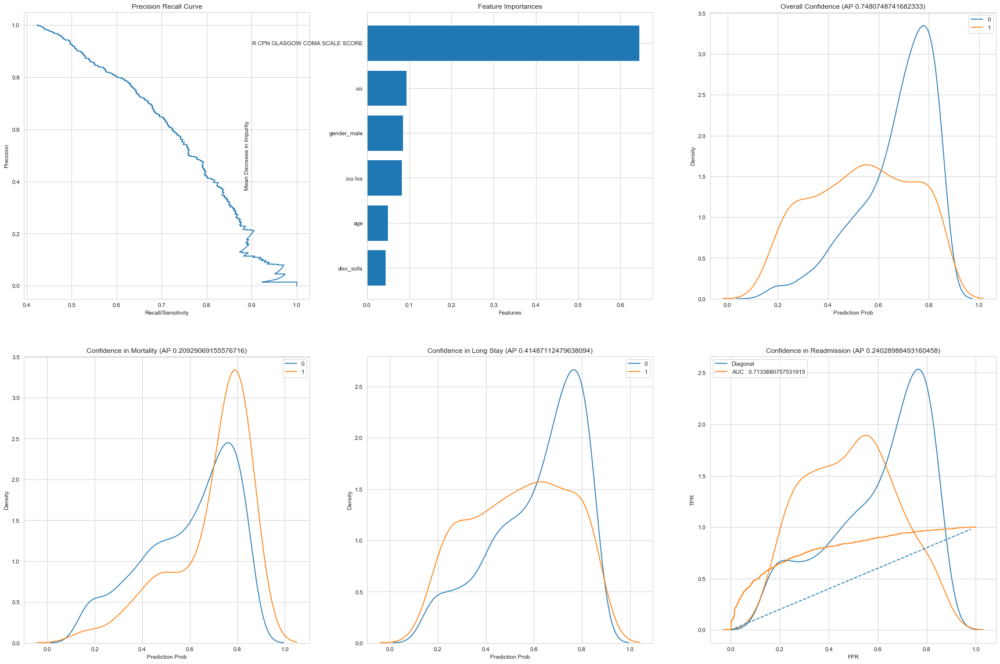

In [190]:
met_mul = plot_eval(model_xg_mul, X_train_mul, y_train_mul)

[[242  61]
 [105 101]]
defaultdict(<class 'list'>, {'tpr': 0.49029126213592233, 'fpr': 0.20132013201320131, 'fnr': 0.5097087378640777, 'tnr': 0.7986798679867987, 'acc': 0.6738703339882122, 'precision': 0.6234567901234568, 'AP': 0.6455445404301325, 'f1': 0.5489130434782608, 'cohenkappa': 0.29920045119766436, 'auroc': 0.6444855650613606})


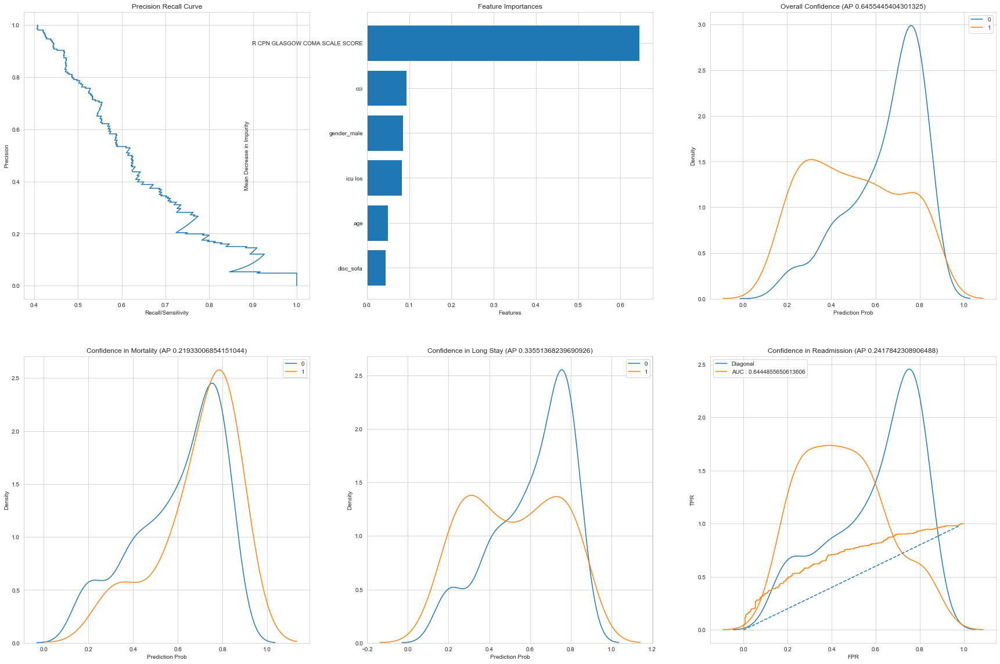

In [191]:
met_mul = plot_eval(model_xg_mul, X_test_mul, y_test_mul)

Logistic regression on the variables from multivariate analysis

In [192]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss


logit = LogisticRegression(random_state=0)
logit.fit(X_train_mul.values,y_train_mul)

# main_llk = log_loss(prediction,prediction_prob[:,1])


D:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

[[265  38]
 [129  77]]
defaultdict(<class 'list'>, {'tpr': 0.3737864077669903, 'fpr': 0.1254125412541254, 'fnr': 0.6262135922330098, 'tnr': 0.8745874587458746, 'acc': 0.6719056974459725, 'precision': 0.6695652173913044, 'AP': 0.6318064294436647, 'f1': 0.47975077881619943, 'cohenkappa': 0.2672723667991276, 'auroc': 0.6241869332564325})


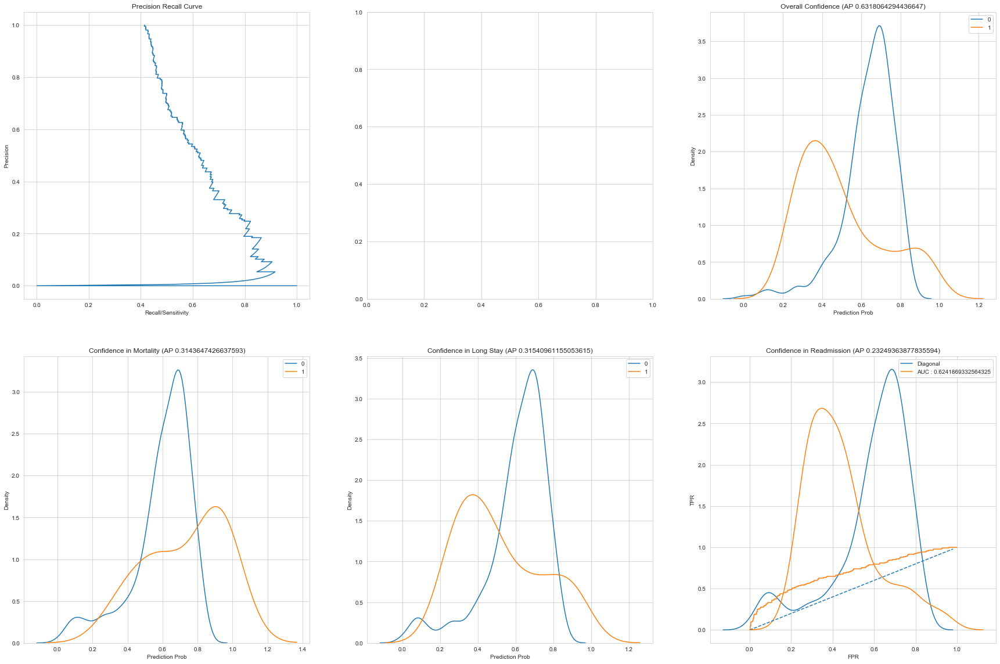

In [193]:
met_logit_mul = plot_eval(logit, X_test_mul, y_test_mul, mul_sig_var)

### 6. Final
Remove features that have less than 10% of values according to CH ML 13OCT2022.xlsx

In [4]:
len(all_features)

32

In [4]:
features_final = list(set(all_features) -set(['comorb_COPD','resp_secretion_6_pos',
 'comorb_Heart Failure','chronic',
 'comorb_Others: TB/ ILD/ Chest wall deformity/OSA/ Bronchiectasis',
'comorb_Cirrhosis',
 'comorb_Immuno',
'comorb_Kidney']))

### TODO Use back FIO2, PaO2

Just explain carefully CSM using univariate one, and ML using 24

In [5]:


data_final = stats[features_final].fillna(0)

data_final = data_final.drop(['POCT PO2','FIO2, ABG'],1) ## Dan suggested to drop as the values are faulty

X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(data_final, stats['target'], test_size=0.2, random_state=10)
X_train_final['comorb_Pneumonia'] = X_train_final['comorb_Pneumonia'].astype(int)
X_train_final['comorb_Stroke'] = X_train_final['comorb_Stroke'].astype(int)
X_test_final['comorb_Pneumonia'] = X_test_final['comorb_Pneumonia'].astype(int)
X_test_final['comorb_Stroke'] = X_test_final['comorb_Stroke'].astype(int)


C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_23208\3684259333.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  data_final = data_final.drop(['POCT PO2','FIO2, ABG'],1) ## Dan suggested to drop as the values are faulty


In [6]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {#'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'n_estimators':[110,120,140,150,170,200,220,240,280,300,320],
#                  'n_estimators':[170,200,220,240,280,300,320,340,360],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.7,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,5,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
#                  'reg_alpha' : [0.01,0.05,0.1,0.2,0.4,0.5,0.8,1.0],
#                  'reg_lambda' : [0.01,0.05,0.1,0.2,0.4],
                 'scale_pos_weight' : np.arange(0.5,4,0.1),
                }
model_xg_final = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_xgc = RandomizedSearchCV(estimator=model_xg_final,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_xgc.fit(X_train_final.values, y_train_final.values)
print(CV_xgc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_final = CV_xgc.best_estimator_



#{'subsample': 1.0, 'scale_pos_weight': 1.6999999999999997, 'reg_lambda': 102.4, 'reg_alpha': 12.8, 'n_estimators': 240, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.8}

{'subsample': 0.7, 'scale_pos_weight': 1.1999999999999997, 'reg_lambda': 6.4, 'reg_alpha': 12.8, 'n_estimators': 280, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.1, 'gamma': 1.5, 'colsample_bytree': 0.6}
CPU times: total: 18min 50s
Wall time: 2min 52s


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[966 169]
 [241 518]]
defaultdict(<class 'list'>, {'tpr': 0.6824769433465085, 'fpr': 0.14889867841409693, 'fnr': 0.31752305665349145, 'tnr': 0.8511013215859031, 'acc': 0.7835269271383316, 'precision': 0.7540029112081513, 'AP': 0.815996306177999, 'f1': 0.7164591977869986, 'cohenkappa': 0.5420960953098668, 'auroc': 0.7667891324662058})


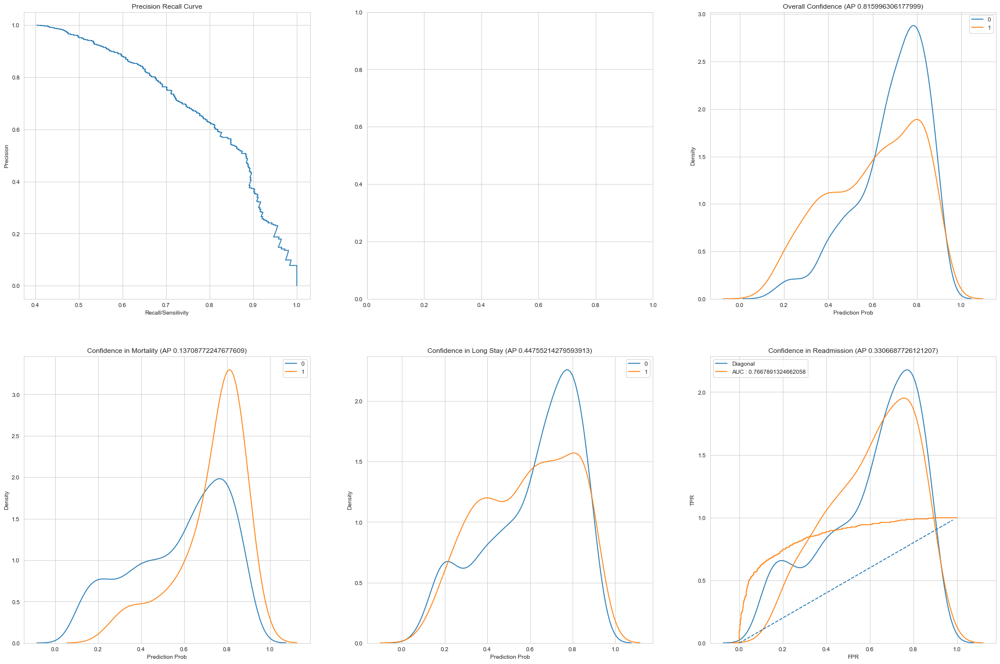

In [7]:
met_final = plot_eval(model_xg_final, X_train_final, y_train_final)

Text(0.5, 0, 'Features')

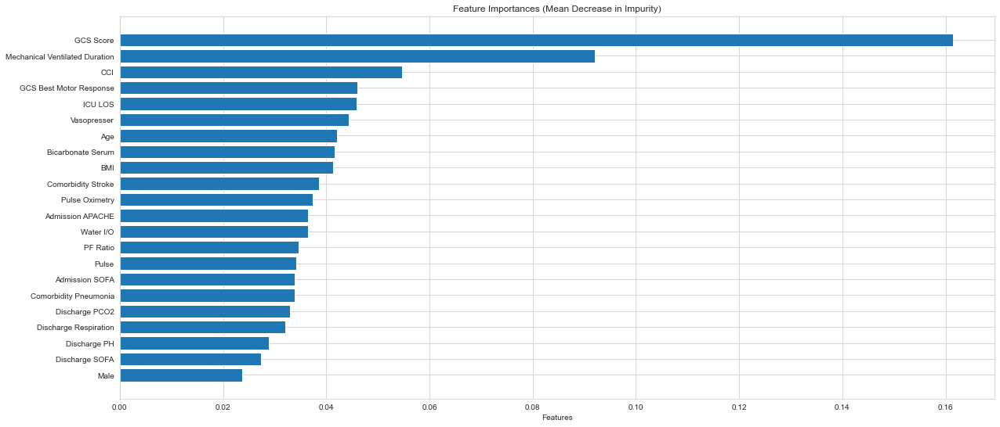

In [17]:
# model = model_xg_final.best_estimator_
_, ax = plt.subplots(figsize=(20,9))
features_temp = X_test_final.columns
imp = sorted(zip(features_temp, model_xg_final.feature_importances_), key= lambda pair: pair[1], reverse=False  )


feat = ['GCS Score',
        
        'Mechanical Ventilated Duration', 
        'CCI',
        'GCS Best Motor Response',
        'ICU LOS',
        'Vasopresser',
        'Age',
        
        
        'Bicarbonate Serum',
        'BMI',
        'Comorbidity Stroke',
        'Pulse Oximetry',
        'Admission APACHE',
        'Water I/O',
        'PF Ratio',
        'Pulse',
         
        
        'Admission SOFA',
        'Comorbidity Pneumonia',
        'Discharge PCO2',
        
        
        
        'Discharge Respiration',
        'Discharge PH',
        'Discharge SOFA',
        'Male',
        
        
        

        ][::-1]
# feat = [x for x,_ in imp]
imp = [x for _,x in imp]
ax.barh(feat,imp)
ax.set_title('Feature Importances (Mean Decrease in Impurity)')
ax.set_ylabel('')
ax.set_xlabel('Features')

In [194]:
#auroc test
(0.693-0.667)/(0.0086/np.sqrt(5))

6.760205513371434

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[223  57]
 [ 80 114]]
defaultdict(<class 'list'>, {'tpr': 0.5876288659793815, 'fpr': 0.20357142857142857, 'fnr': 0.41237113402061853, 'tnr': 0.7964285714285714, 'acc': 0.7109704641350211, 'precision': 0.6666666666666666, 'AP': 0.6959784892749955, 'f1': 0.6246575342465753, 'cohenkappa': 0.3911796141081173, 'auroc': 0.6920287187039765})


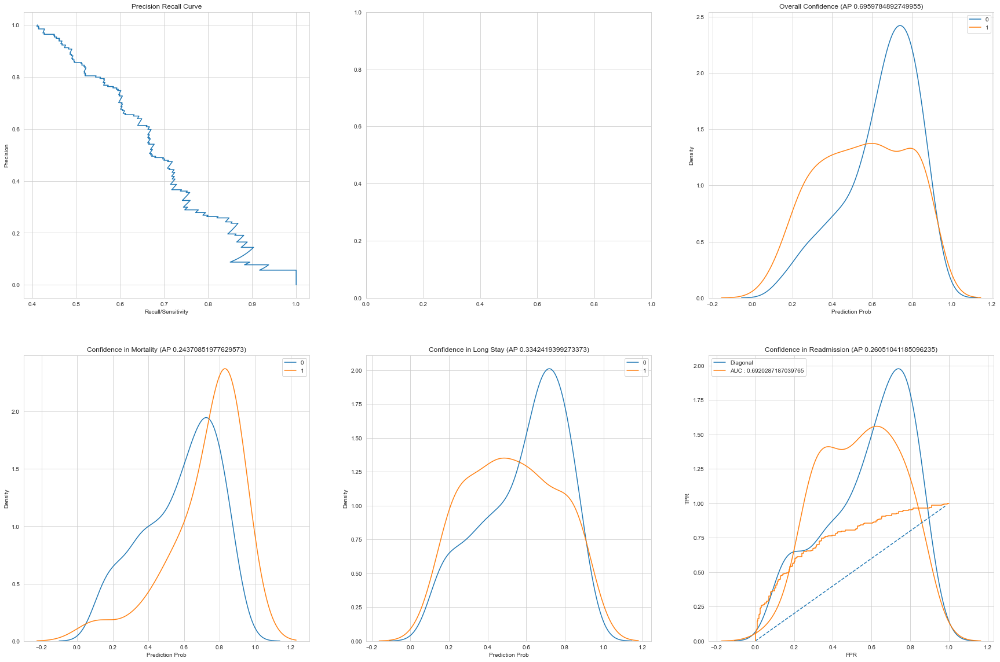

In [8]:
met_final = plot_eval(model_xg_final, X_test_final, y_test_final)

In [217]:
(14.9 - 20.625 /2)

4.5875

{'subsample': 0.7, 'scale_pos_weight': 1.1999999999999997, 'reg_lambda': 6.4, 'reg_alpha': 12.8, 'n_estimators': 280, 'min_child_weight': 5, 'max_depth': 9, 'learning_rate': 0.1, 'gamma': 1.5, 'colsample_bytree': 0.6}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[223  57]
 [ 80 114]]
defaultdict(<class 'list'>, {'tpr': 0.5876288659793815, 'fpr': 0.20357142857142857, 'fnr': 0.41237113402061853, 'tnr': 0.7964285714285714, 'acc': 0.7109704641350211, 'precision': 0.6666666666666666, 'AP': 0.6959784892749955, 'f1': 0.6246575342465753, 'cohenkappa': 0.3911796141081173, 'auroc': 0.6920287187039765})
{'subsample': 0.8, 'scale_pos_weight': 1.1999999999999997, 'reg_lambda': 0.2, 'reg_alpha': 0.1, 'n_estimators': 170, 'min_child_weight': 10, 'max_depth': 25, 'learning_rate': 0.03, 'gamma': 6.4, 'colsample_bytree': 0.8}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[229  51]
 [ 83 111]]
defaultdict(<class 'list'>, {'tpr': 0.5721649484536082, 'fpr': 0.18214285714285713, 'fnr': 0.42783505154639173, 'tnr': 0.8178571428571428, 'acc': 0.7172995780590717, 'precision': 0.6851851851851852, 'AP': 0.7045289224295899, 'f1': 0.6235955056179775, 'cohenkappa': 0.4001586582048957, 'auroc': 0.6950110456553755})
{'subsample': 0.7, 'scale_pos_weight': 1.2999999999999998, 'reg_lambda': 5, 'reg_alpha': 6.4, 'n_estimators': 170, 'min_child_weight': 10, 'max_depth': 10, 'learning_rate': 0.06, 'gamma': 0.5, 'colsample_bytree': 0.8}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[222  58]
 [ 79 115]]
defaultdict(<class 'list'>, {'tpr': 0.5927835051546392, 'fpr': 0.20714285714285716, 'fnr': 0.4072164948453608, 'tnr': 0.7928571428571428, 'acc': 0.7109704641350211, 'precision': 0.6647398843930635, 'AP': 0.6901864205927173, 'f1': 0.6267029972752044, 'cohenkappa': 0.3921597993148249, 'auroc': 0.692820324005891})
{'subsample': 0.8, 'scale_pos_weight': 1.6999999999999997, 'reg_lambda': 0.1, 'reg_alpha': 1, 'n_estimators': 110, 'min_child_weight': 10, 'max_depth': 30, 'learning_rate': 0.01, 'gamma': 5, 'colsample_bytree': 1.0}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[205  75]
 [ 70 124]]
defaultdict(<class 'list'>, {'tpr': 0.6391752577319587, 'fpr': 0.26785714285714285, 'fnr': 0.36082474226804123, 'tnr': 0.7321428571428571, 'acc': 0.6940928270042194, 'precision': 0.6231155778894473, 'AP': 0.6869308571278243, 'f1': 0.6310432569974554, 'cohenkappa': 0.369854222059228, 'auroc': 0.6856590574374081})
{'subsample': 0.8, 'scale_pos_weight': 1.7999999999999998, 'reg_lambda': 12.8, 'reg_alpha': 2, 'n_estimators': 220, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.06, 'gamma': 6.4, 'colsample_bytree': 0.6}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[192  88]
 [ 56 138]]
defaultdict(<class 'list'>, {'tpr': 0.711340206185567, 'fpr': 0.3142857142857143, 'fnr': 0.28865979381443296, 'tnr': 0.6857142857142857, 'acc': 0.6962025316455697, 'precision': 0.6106194690265486, 'AP': 0.7014409563957664, 'f1': 0.6571428571428571, 'cohenkappa': 0.3872450445274347, 'auroc': 0.6985272459499264})


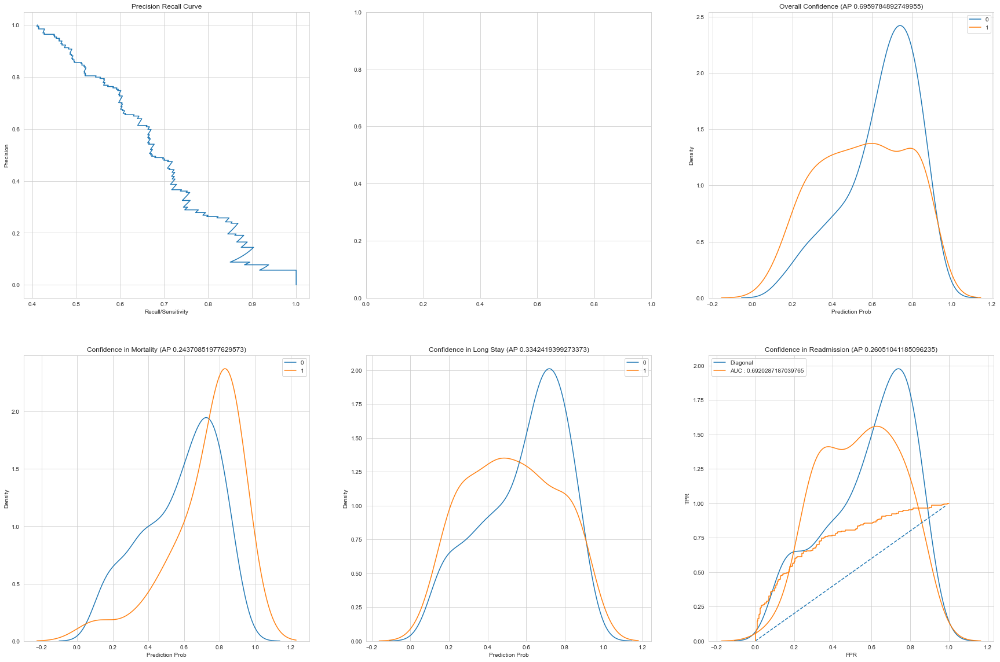

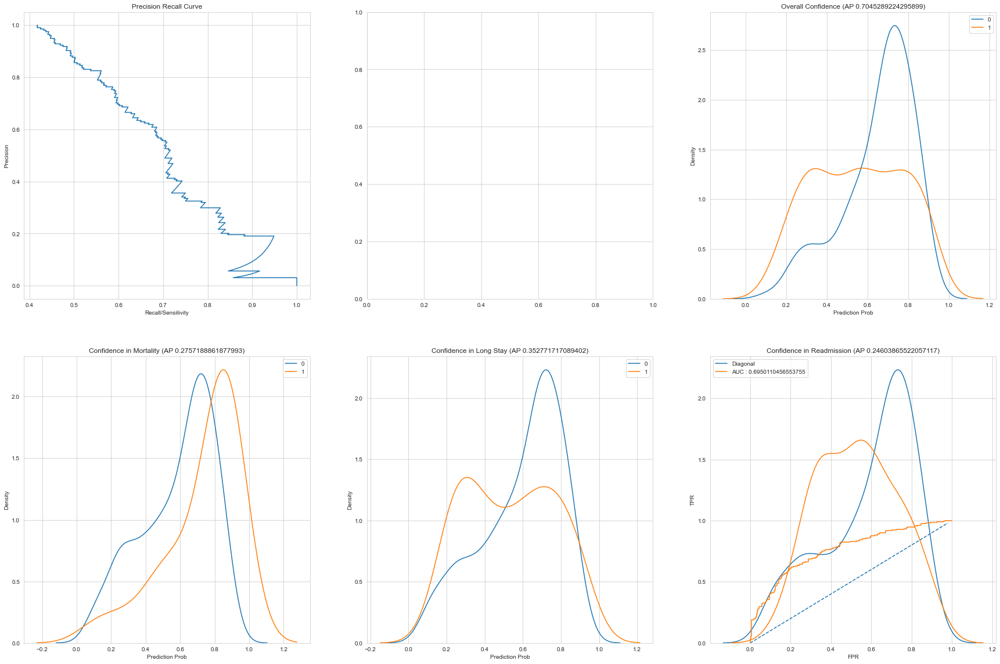

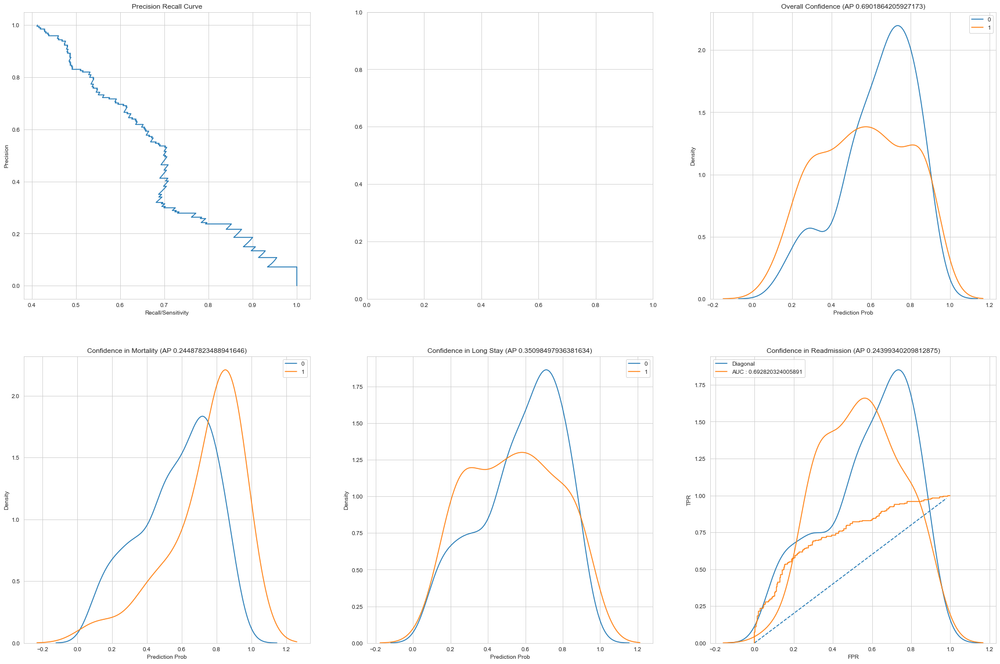

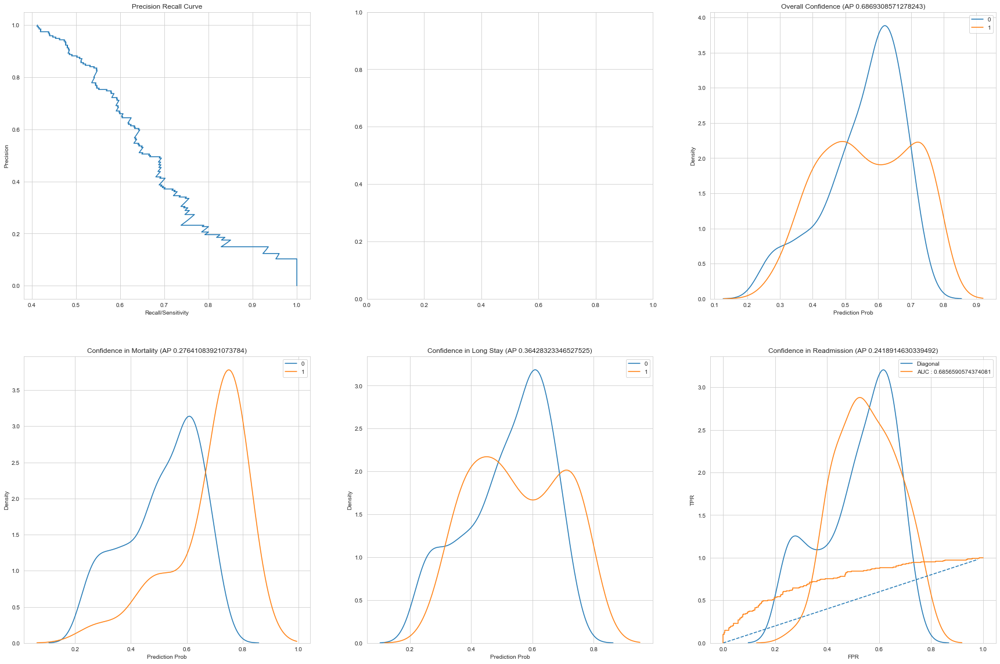

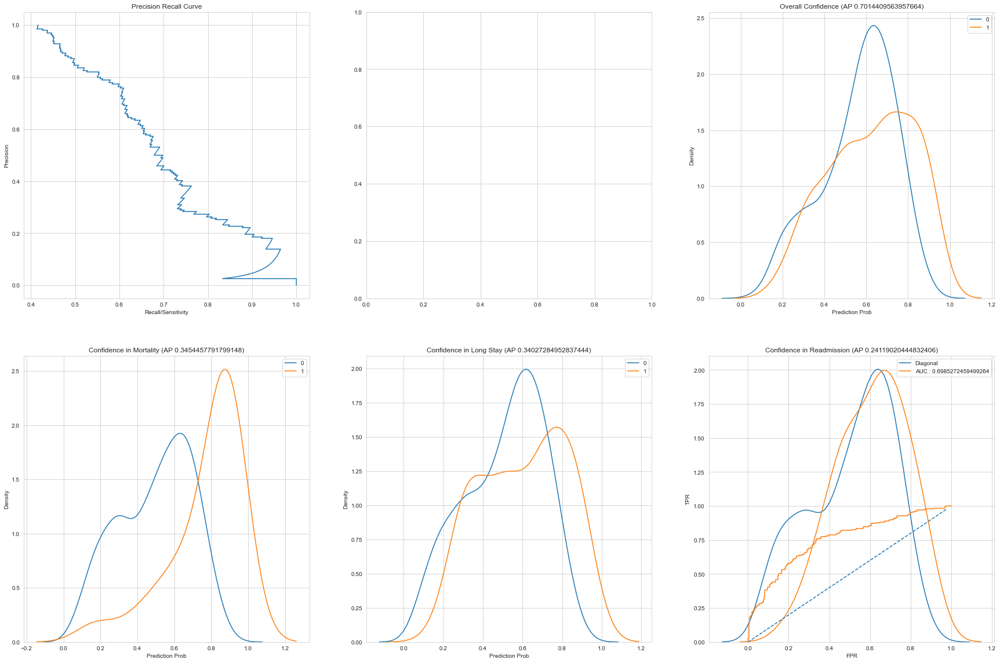

In [10]:
## count std dev


for i in [0, 10, 100, 1000, 10000]:
#     %%time
    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
    xg_param_grid = {#'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'n_estimators':[110,120,140,150,170,200,220,240,280,300,320],
#                  'n_estimators':[170,200,220,240,280,300,320,340,360],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.7,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,5,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'scale_pos_weight' : np.arange(0.5,4,0.1),
                }
    model_xg_final = xgbc()


    # CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
    CV_xgc = RandomizedSearchCV(estimator=model_xg_final,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=15,n_iter=50,random_state=i)

    CV_xgc.fit(X_train_final.values, y_train_final.values)
    print(CV_xgc.best_params_)

    ### use best fit
    # model_xg = xgbc(**CV_rfc.best_params_)
    model_xg_final = CV_xgc.best_estimator_
    
    met_final = plot_eval(model_xg_final, X_test_final, y_test_final)
    
    


In [25]:
import logging
logging.disable()

In [14]:
np.mean([0.6962025316455697,0.6940928270042194 , 0.7109704641350211,  0.7172995780590717, 0.7109704641350211 ])

0.7059071729957807

## 18 Factors

In [186]:
fea_18 = ['age','cci','adm_sofa','comorb_Heart Failure','mv_duration','icu los','comorb_COPD','chronic','comorb_Stroke','comorb_Kidney',
 'PULSE','R CPN GLASGOW COMA SCALE SCORE','R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE','disc_sofa','PULSE OXIMETRY','POCT PH',
'POCT PCO2','BICARBONATE, SERUM']
len(fea_18)

18

In [203]:
len(data_final.columns)

22

In [188]:


data_18 = stats[fea_18].fillna(0)

# data_18 = data_18.drop(['POCT PO2','FIO2, ABG'],1) ## Dan suggested to drop as the values are faulty

X_train_final, X_test_final, y_train_final, y_test_final = train_test_split(data_18, stats['target'], test_size=0.2, random_state=10)
# X_train_final['comorb_Pneumonia'] = X_train_final['comorb_Pneumonia'].astype(int)
X_train_final['comorb_Stroke'] = X_train_final['comorb_Stroke'].astype(int)
# X_test_final['comorb_Pneumonia'] = X_test_final['comorb_Pneumonia'].astype(int)
X_test_final['comorb_Stroke'] = X_test_final['comorb_Stroke'].astype(int)


In [189]:
%%time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
xg_param_grid = {#'n_estimators':[5,10,20,50,100,110,120,140,150,170,200],
                 'n_estimators':[110,120,140,150,170,200,220,240,280,300,320],
#                  'n_estimators':[170,200,220,240,280,300,320,340,360],
                 'min_child_weight':[1,5,10], 
                 'gamma':[0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                 'subsample':[0.6,0.7,0.8,1.0],
                 'colsample_bytree':[0.6,0.8,1.0], 
                 'max_depth':[3,5,9,10,11,12,15,18,20,25,30,50],
                 'learning_rate': [0.01,0.03,0.06,0.1,0.15,0.2,0.3],
                 'reg_alpha' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
                'reg_lambda' : [0.1,0.2,0.5,.8,1, 1.5, 2 ,5, 6.4,12.8,25.6,102.4],
#                  'reg_alpha' : [0.01,0.05,0.1,0.2,0.4,0.5,0.8,1.0],
#                  'reg_lambda' : [0.01,0.05,0.1,0.2,0.4],
                 'scale_pos_weight' : np.arange(0.5,4,0.1),
                }
model_xg_final = xgbc()


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_xgc = RandomizedSearchCV(estimator=model_xg_final,param_distributions=xg_param_grid, scoring='balanced_accuracy' ,cv=15,n_iter=50,random_state=10)

CV_xgc.fit(X_train_final.values, y_train_final.values)
print(CV_xgc.best_params_)

### use best fit
# model_xg = xgbc(**CV_rfc.best_params_)
model_xg_final = CV_xgc.best_estimator_



#{'subsample': 1.0, 'scale_pos_weight': 1.6999999999999997, 'reg_lambda': 102.4, 'reg_alpha': 12.8, 'n_estimators': 240, 'min_child_weight': 5, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.8}

{'subsample': 0.7, 'scale_pos_weight': 1.6999999999999997, 'reg_lambda': 25.6, 'reg_alpha': 0.5, 'n_estimators': 300, 'min_child_weight': 5, 'max_depth': 50, 'learning_rate': 0.2, 'gamma': 6.4, 'colsample_bytree': 0.8}
CPU times: total: 37min 8s
Wall time: 5min 36s


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[848 287]
 [191 568]]
defaultdict(<class 'list'>, {'tpr': 0.7483530961791831, 'fpr': 0.252863436123348, 'fnr': 0.2516469038208169, 'tnr': 0.747136563876652, 'acc': 0.747624076029567, 'precision': 0.664327485380117, 'AP': 0.7686745016908907, 'f1': 0.7038413878562577, 'cohenkappa': 0.48532199069257653, 'auroc': 0.7477448300279176})


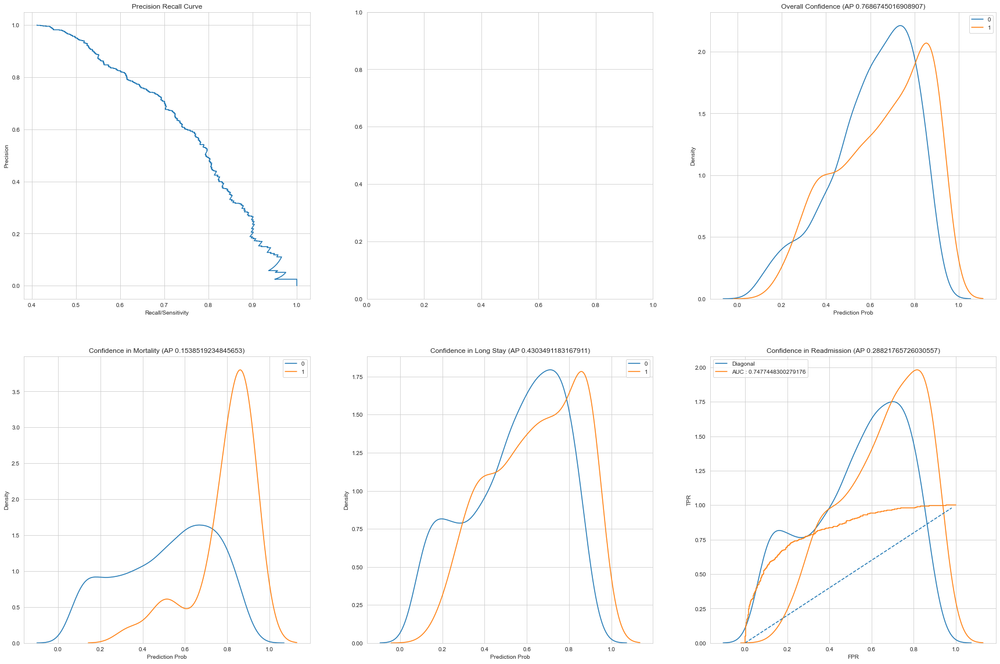

In [190]:
met_final = plot_eval(model_xg_final, X_train_final, y_train_final)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[197  83]
 [ 65 129]]
defaultdict(<class 'list'>, {'tpr': 0.6649484536082474, 'fpr': 0.29642857142857143, 'fnr': 0.33505154639175255, 'tnr': 0.7035714285714286, 'acc': 0.6877637130801688, 'precision': 0.6084905660377359, 'AP': 0.6875922739196092, 'f1': 0.6354679802955665, 'cohenkappa': 0.3633426507423676, 'auroc': 0.6842599410898379})


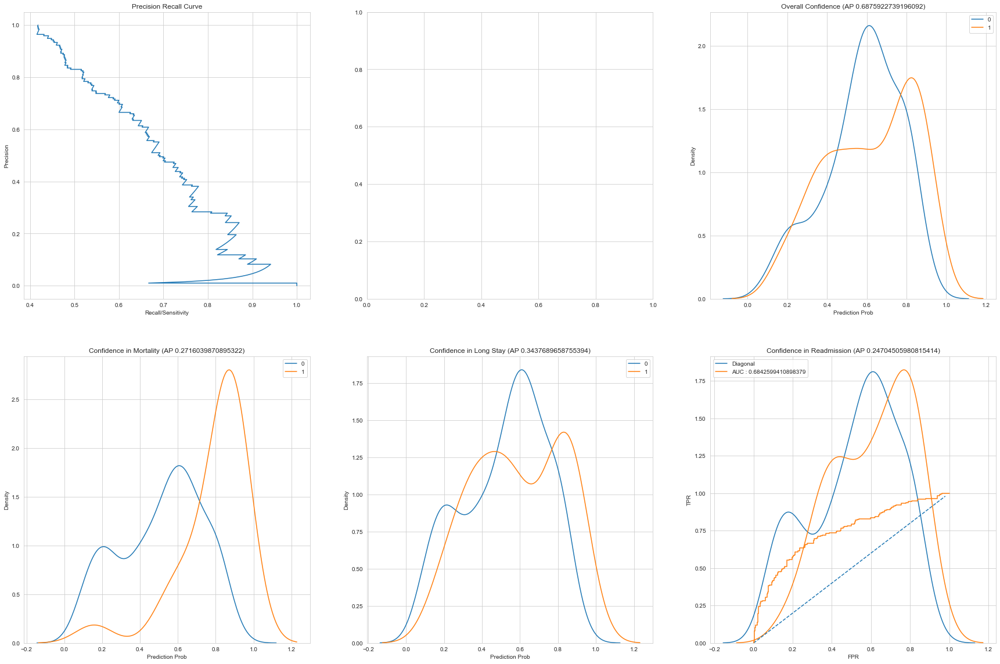

In [193]:
met_final = plot_eval(model_xg_final, X_test_final, y_test_final)

### Eval
Must run, improvised the plotting 

In [28]:

def plot_eval2(model, X_test, y_test, features=None):
    assert 'stats' in globals()  , 'Must declare main dataset as stats'
    assert (isinstance(X_test, pd.core.frame.DataFrame) &  isinstance(y_test, pd.core.series.Series))
    
    if features is None: features = X_test.columns
    
    if isinstance(model,torch.nn.Module):
        model.predict_proba = model.forward
        model.eval()
        assert model.training == False
        
        
    prediction_prob = model.predict_proba(X_test.values)
    met = Evaluation(y_test.values, prediction_prob[:,1])
    pr = met.prec_recall
    _ , ax = plt.subplots(figsize=(15,8))
    imp = sorted(zip(features, model.feature_importances_), key= lambda pair: pair[1], reverse=False  )
#     feat = ['GCS Score','MV duration','ICU LOS','CCI','Vasopresser','Gender (Male)','Comorbidity Stroke','Discharge FIO2',
#             'Comorbidity Pneumonia','Bicarbonate serum','Water I/O','Age','Admission SOFA','Discharge PCO2','Pulse','GCS Best Motor Response',
#            'Admission Apache','Discharge PaO2','PF ratio','BMI','Discharge PH','Respiration','Pulse Oximetry','Discharge SOFA']
    feat = ['GCS Score','MV duration','ICU LOS','CCI','Vasopresser','Gender (Male)','Comorbidity Stroke','Discharge FIO2',
            'Comorbidity Pneumonia','Bicarbonate serum','Water I/O','Age','Admission SOFA','Discharge PCO2','Pulse','GCS Best Motor Response',
           'Admission Apache','PF ratio','BMI','Discharge PH','Respiratory Rate','Pulse Oximetry','Discharge SOFA']

    feat = feat[::-1]
#     assert len(feat) == len(imp)
#     feat = [x for x,_ in imp]
    imp = [x for _,x in imp]
    ax.barh(feat,imp)
    ax.set_title('Feature Importances (Mean Decrease in Impurity)')
#     ax.set_ylabel('Mean Decrease in Impurity')
    ax.set_xlabel('Features')
            
    

    

def plot_eval(model, X_test, y_test, features=None):
    assert 'stats' in globals()  , 'Must declare main dataset as stats'
    assert (isinstance(X_test, pd.core.frame.DataFrame) &  isinstance(y_test, pd.core.series.Series))
    
    if features is None: features = X_test.columns
    
#     if isinstance(model,torch.nn.Module):
#         model.predict_proba = model.forward
#         model.eval()
#         assert model.training == False
        
        
    prediction_prob = model.predict_proba(X_test.values)
    met = Evaluation(y_test.values, prediction_prob[:,1])
    pr = met.prec_recall

    _ ,ax = plt.subplots(2,3, figsize=(20,10))
    ax[0,0].plot(pr[0],pr[1])
    ax[0,0].set_ylabel('Precision')
    ax[0,0].set_xlabel('Recall/Sensitivity')
    ax[0,0].set_title('Precision Recall Curve')

    
    if hasattr(model, 'feature_importances_') :
        if hasattr(model,'estimators_'):
            std = np.std([tree.feature_importances_ for tree in model.estimators_])
        else:
            std = 0
#         if isinstance(model, EBC):
#             ax[0,1].barh(ebm_feature_inter,model_ebm.feature_importances_)
#         else:

            imp = sorted(zip(features, model.feature_importances_), key= lambda pair: pair[1], reverse=False  )
            feat = [x for x,_ in imp]
            imp = [x for _,x in imp]
            ax[0,1].barh(feat,imp)
            ax[0,1].set_title('Feature Importances')
            ax[0,1].set_ylabel('Mean Decrease in Impurity')
            ax[0,1].set_xlabel('Features')

    else: pass

    plot_calib(y_test, prediction_prob, ax[0,2])

    ax[0,2].set_xlabel('Prediction Probability')
    ax[0,2].set_ylabel('Density')
    ax[0,2].set_title('Overall Confidence')



    plot_calib(stats.loc[y_test.index]['mortality'].astype(int).values, prediction_prob, ax[1,0])
    ax[1,0].set_xlabel('Prediction Probability')
    ax[1,0].set_ylabel('Density')
    ax[1,0].set_title('Confidence in Mortality' + ax[1,0].title._text)

    plot_calib(stats.loc[y_test.index]['longstay'].astype(int).values, prediction_prob, ax[1,1])
    ax[1,1].set_xlabel('Prediction Probability')
    ax[1,1].set_ylabel('Density')
    ax[1,1].set_title('Confidence in Long Stay' + ax[1,1].title._text)

    plot_calib(stats.loc[y_test.index]['readmission'].astype(int).values, prediction_prob, ax[1,2])
    ax[1,2].set_xlabel('Prediction Probability')
    ax[1,2].set_ylabel('Density')
    ax[1,2].set_title('Confidence in Readmission' + ax[1,2].title._text)

    print(met.confusion_matrix)
    print(met.rate())
    return met
    

In [15]:
import scipy

scipy.__version__


'1.7.3'

[[247  56]
 [ 85 121]]
defaultdict(<class 'list'>, {'tpr': 0.587378640776699, 'fpr': 0.1848184818481848, 'fnr': 0.41262135922330095, 'tnr': 0.8151815181518152, 'acc': 0.7229862475442044, 'precision': 0.6836158192090396, 'AP': 0.6961362202755033, 'f1': 0.6318537859007833, 'cohenkappa': 0.411840390746007, 'auroc': 0.7012800794642571})


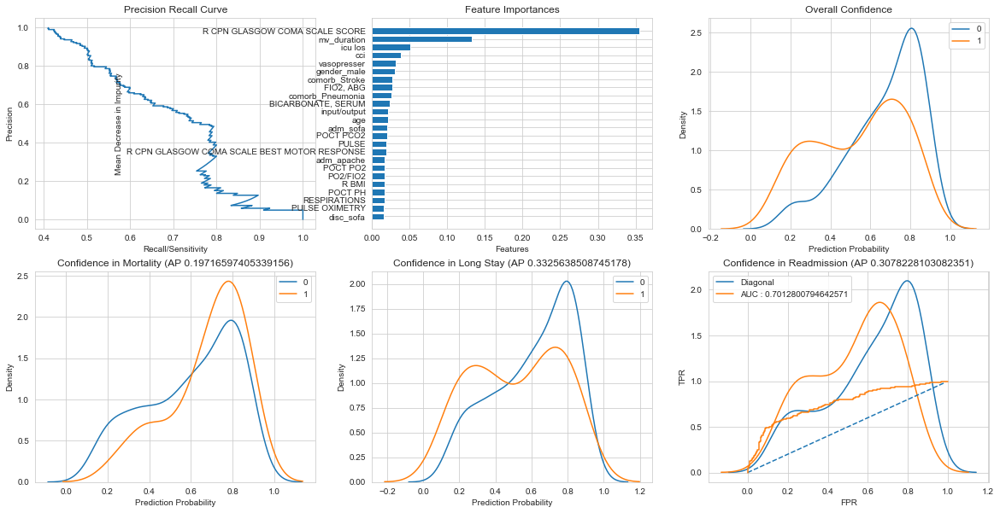

In [63]:
met_final = plot_eval(model_xg_final, X_test_final, y_test_final)

[[242  61]
 [ 95 111]]
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.20132013201320131, 'fnr': 0.46116504854368934, 'tnr': 0.7986798679867987, 'acc': 0.693516699410609, 'precision': 0.6453488372093024, 'AP': 0.6678787963601978, 'f1': 0.5873015873015873, 'cohenkappa': 0.3466734683802597, 'auroc': 0.6687574097215546})


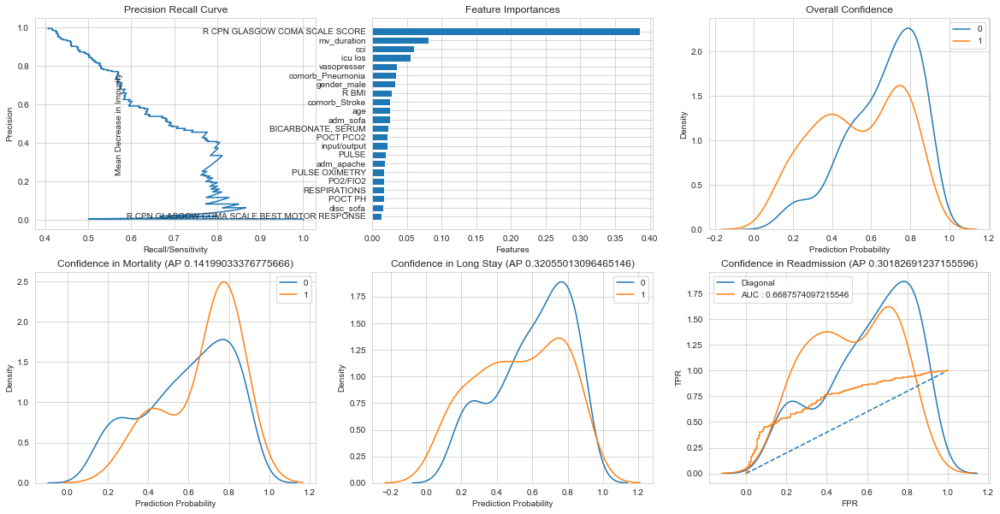

In [158]:
met_final = plot_eval(model_xg_final, X_test_final, y_test_final)

In [26]:
model_xg_final.save_model('ckpt/models/final.xgb')

EBM

In [19]:

model_ebm = EBC(random_state=100)

param_dict = {
    
    'max_bins': [10,20,50,70,90,120,150,170,200,256,270,295,320,350],
    'max_interaction_bins' :[5,8,10,12,15,18,20,25,27,50,70,90],
    'binning':["uniform", "quantile", "quantile_humanized"],
    'outer_bags' : [2,4,6,8,10,12,15,17],
    'inner_bags' : [2,4,6,8,10,12,15,17],
    'learning_rate' : [1e-5,5e-5,1e-4,5e-4,1e-3,5e-3,1e-2,3e-2,5e-2,0.1,0.2,0.4],
    'min_samples_leaf' : [1,2,3,4,5,6,7,8,9],
    'max_leaves' : [2,3,4,5,6,7,8,9]
}


CV_ebm = RandomizedSearchCV(estimator=model_ebm,param_distributions=param_dict, scoring='accuracy' ,cv=5)

# CV_ebm.
CV_ebm.fit(X_train_final.values.astype(float), y_train_final.values.astype(float))
print(CV_ebm.best_params_)

### use best fit
model_ebm = CV_ebm.best_estimator_
model_ebm.fit(X_train_final.values.astype(float), y_train_final.values.astype(float))

ebm_map = dict(zip(model_ebm.feature_names[:len(features_final)], features_final))
ebm_feature_inter = []
for s in model_ebm.feature_names:
    l = s.split(' ')
    text = ''
    for t in l:
        if t in ebm_map:
            text += ebm_map[t]
            text += ' '
    ebm_feature_inter += [text]   
    
    
plt.bar(ebm_feature_inter,model_ebm.feature_importances_)
plt.xticks(rotation='vertical')
plt.title('Feature Importance')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:217: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  score = y_true == y_pred
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:217: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  score = y_true == y_pred
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:217: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  score = y_true == y_pred
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:217: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  score = y_true == y_pred
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metri

{'outer_bags': 15, 'min_samples_leaf': 6, 'max_leaves': 6, 'max_interaction_bins': 90, 'max_bins': 20, 'learning_rate': 0.2, 'inner_bags': 8, 'binning': 'quantile'}


TypeError: 'NoneType' object is not subscriptable

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[247  56]
 [ 95 111]]
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.1848184818481848, 'fnr': 0.46116504854368934, 'tnr': 0.8151815181518152, 'acc': 0.7033398821218074, 'precision': 0.6646706586826348, 'AP': 0.6727991250724856, 'f1': 0.5951742627345845, 'cohenkappa': 0.36507975845290896, 'auroc': 0.6770082348040629})


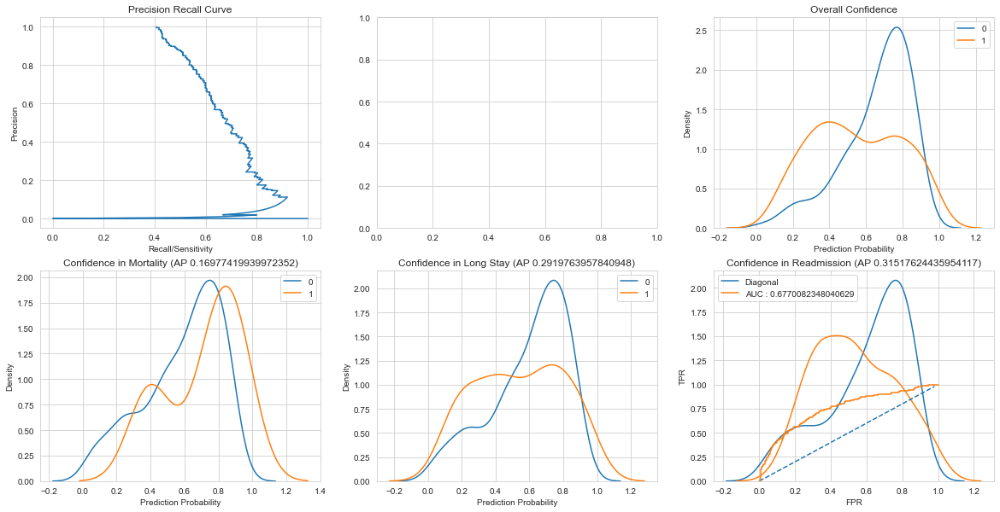

In [153]:
model_ebm.__dict__.keys()
met_ebm = plot_eval(model_ebm,X_test_final,y_test_final, features)

[[245  58]
 [ 97 109]]
defaultdict(<class 'list'>, {'tpr': 0.529126213592233, 'fpr': 0.19141914191419143, 'fnr': 0.470873786407767, 'tnr': 0.8085808580858086, 'acc': 0.6954813359528488, 'precision': 0.6526946107784432, 'AP': 0.6710453616084419, 'f1': 0.5844504021447721, 'cohenkappa': 0.3482606792066285, 'auroc': 0.6688535358390209})


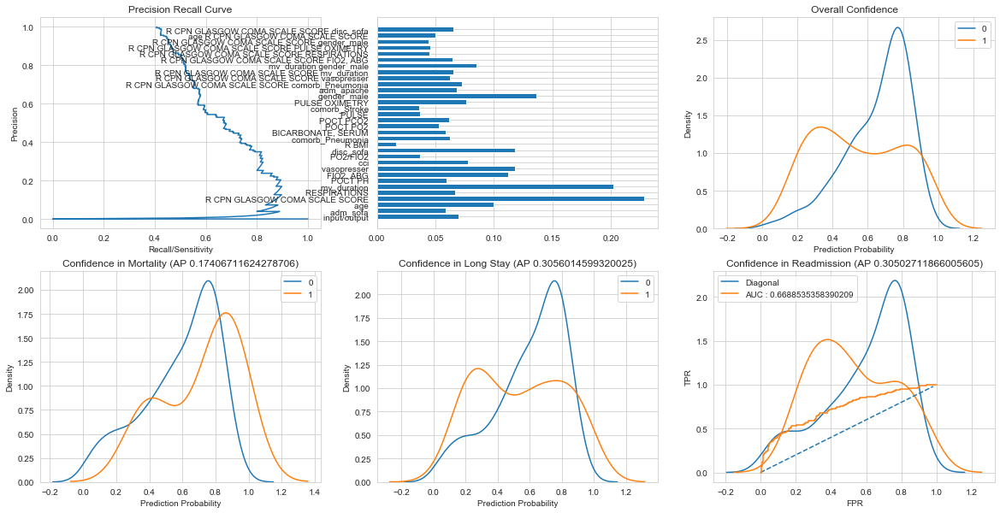

In [200]:
met_ebm = plot_eval(model_ebm,X_test_final,y_test_final, features)

{'outer_bags': 12, 'min_samples_leaf': 9, 'max_leaves': 9, 'max_interaction_bins': 25, 'max_bins': 270, 'learning_rate': 0.03, 'inner_bags': 12, 'binning': 'quantile'}
[[250  53]
 [100 106]]
defaultdict(<class 'list'>, {'tpr': 0.5145631067961165, 'fpr': 0.17491749174917492, 'fnr': 0.4854368932038835, 'tnr': 0.8250825082508251, 'acc': 0.6994106090373281, 'precision': 0.6666666666666666, 'AP': 0.669550773361385, 'f1': 0.5808219178082191, 'cohenkappa': 0.3525196005886412, 'auroc': 0.6698228075234708})
{'outer_bags': 6, 'min_samples_leaf': 3, 'max_leaves': 5, 'max_interaction_bins': 20, 'max_bins': 50, 'learning_rate': 0.005, 'inner_bags': 6, 'binning': 'quantile_humanized'}
[[249  54]
 [ 95 111]]
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.1782178217821782, 'fnr': 0.46116504854368934, 'tnr': 0.8217821782178217, 'acc': 0.7072691552062869, 'precision': 0.6727272727272727, 'AP': 0.6729731444580165, 'f1': 0.5983827493261454, 'cohenkappa': 0.372483637958282, 'auroc': 0.680

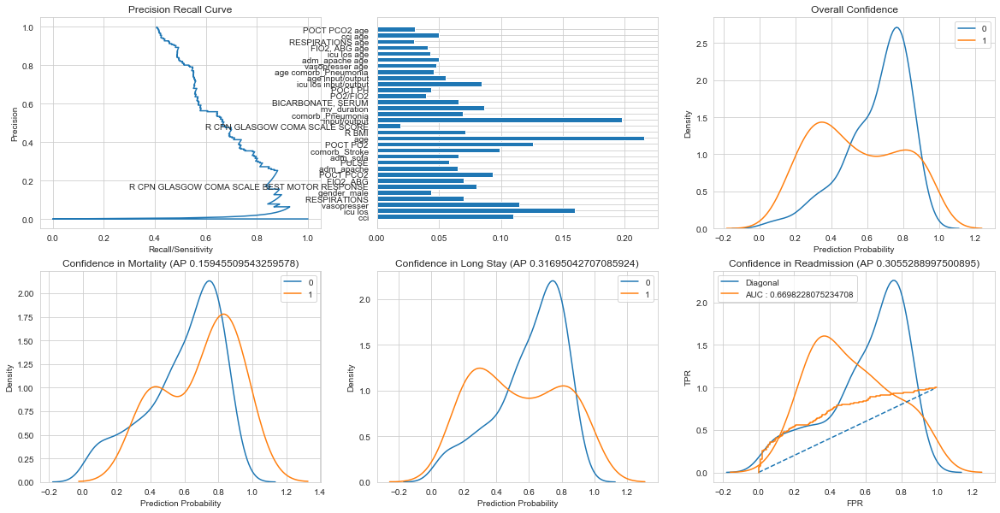

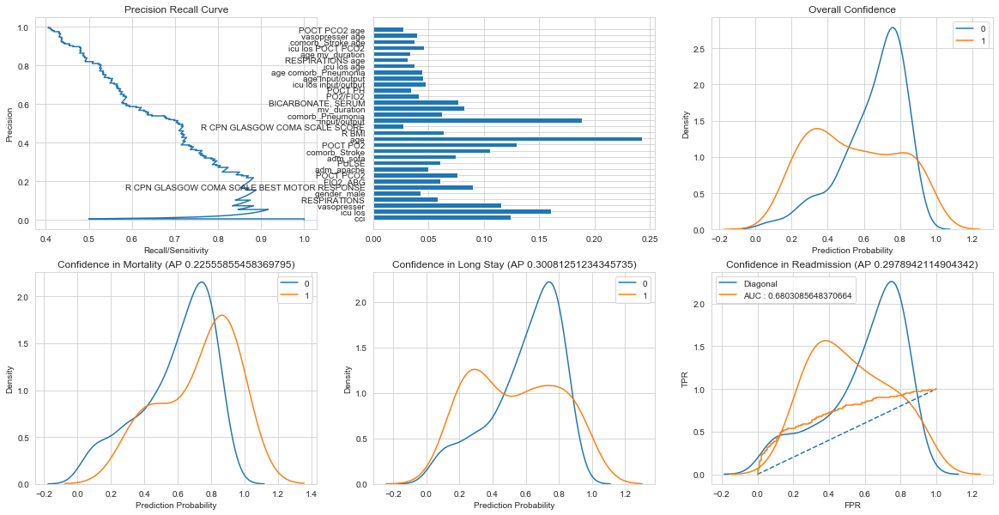

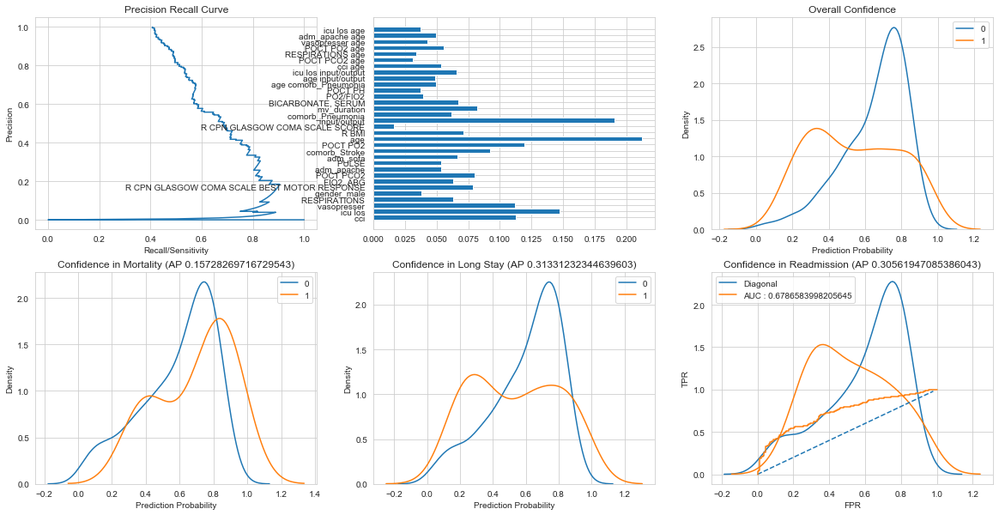

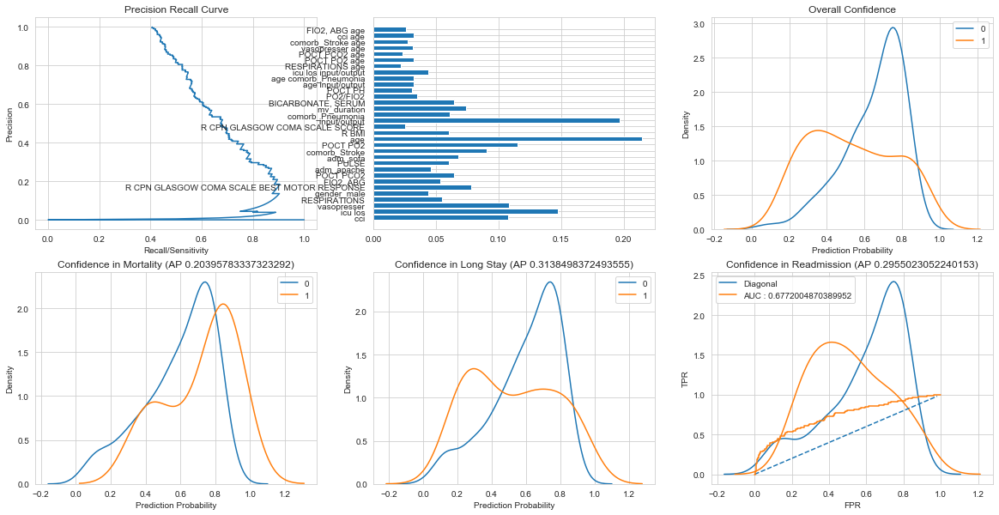

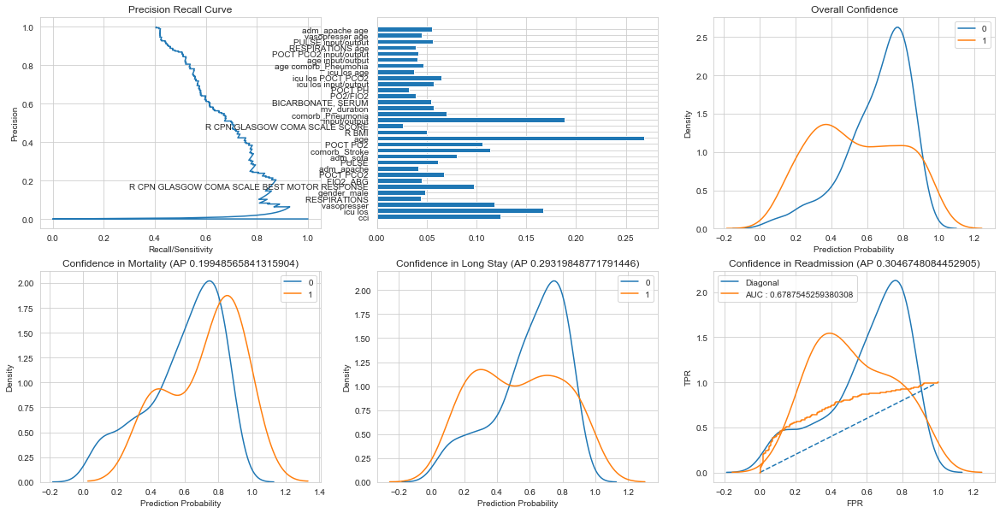

In [11]:
for i in (0,10,100,1000,10000):
    
    model_ebm = EBC(random_state=i)
 
    param_dict = {

        'max_bins': [10,20,50,70,90,120,150,170,200,256,270,295,320,350],
        'max_interaction_bins' :[5,8,10,12,15,18,20,25,27,50,70,90],
        'binning':["uniform", "quantile", "quantile_humanized"],
        'outer_bags' : [2,4,6,8,10,12,15,17],
        'inner_bags' : [2,4,6,8,10,12,15,17],
        'learning_rate' : [1e-5,5e-5,1e-4,5e-4,1e-3,5e-3,1e-2,3e-2,5e-2,0.1,0.2,0.4],
        'min_samples_leaf' : [1,2,3,4,5,6,7,8,9],
        'max_leaves' : [2,3,4,5,6,7,8,9]
    }


    CV_ebm = RandomizedSearchCV(estimator=model_ebm,param_distributions=param_dict, scoring='accuracy' ,cv=5)

    # CV_ebm.
    CV_ebm.fit(X_train_final.values.astype(float), y_train_final.values.astype(float))
    print(CV_ebm.best_params_)

    ### use best fit
    model_ebm = CV_ebm.best_estimator_
    
    ebm_map = dict(zip(model_ebm.feature_names[:len(features_final)], features_final))
    ebm_feature_inter = []
    for s in model_ebm.feature_names:
        l = s.split(' ')
        text = ''
        for t in l:
            if t in ebm_map:
                text += ebm_map[t]
                text += ' '
        ebm_feature_inter += [text]   


    met_ebm = plot_eval(model_ebm,X_test_final,y_test_final, features)


In [63]:
np.mean([0.6994106090373281,0.7072691552062869,0.7053045186640472 ,0.7072691552062869,0.7072691552062869])

0.7053045186640473

In [58]:
from scipy import stats
stats.t.ppf(0.975, 4)

2.7764451051977987

Statistical test on AUROC

In [61]:
(0.679 - 0.667) / (0.0076 / np.sqrt(5))

3.5306336486838816

MLP

Remember to run Shallow Neural Network cell first , under Model Training above

In [24]:
X_train_final_mlp = X_train_final.apply(lambda x:x.astype(float))
xnorm = (X_train_final_mlp - X_train_final_mlp.mean())/ X_train_final_mlp.std()
xnorm = torch.tensor(xnorm.values).to(torch.float)



X_test_final_mlp = X_test_final.apply(lambda x:x.astype(float))
xtestnorm = (X_test_final_mlp - X_test_final_mlp.mean())/ X_test_final_mlp.std()
xtestnorm = torch.tensor(xtestnorm.values).to(torch.float)
ytestt = torch.tensor(y_test.values)

acc_fn = lambda out,y : ((out > 0.5).view(-1).to(torch.float).numpy()  == y.view(-1).numpy()).mean()

torch.manual_seed(0)


np.random.seed(0)
val_loss = []
val_acc = []
for run in range(5):
    model_mlp = mlp(len(X_train_final_mlp.columns),512, 4)
    criterion = torch.nn.BCELoss()
    optimizer = torch.optim.SGD(model_mlp.parameters(), lr=0.001)
    batchsize = 16

    epoch_loss = []
    seq = np.arange(xnorm.shape[0])
    np.random.shuffle(seq)
    split = int(len(seq) * 0.9)
    batch_val_x = torch.tensor(xnorm[seq[split:],:])
    batch_val_y = torch.tensor(y_train_final.values[seq[split:]])
    batch_train = xnorm[seq[:split],:]
    batch_y = y_train_final.values[seq[:split]]
    
    for e in range(20):
        model_mlp.train()
        acc = []
        loader1 = loader(batch_train, batch_y,batchsize)
        bar = tqdm(loader1,total=batchsize, position=0, leave=True)
        batch_loss = []
        for (x,y) in bar:
            y = y[:,None].to(torch.float)
            out = model_mlp(x)
            out = torch.sigmoid(out)
            loss = criterion(out,y )
            loss.backward()
            batch_loss += [loss.detach().item()]
            optimizer.step()
            optimizer.zero_grad()
            acc += [acc_fn(out,y)]
#             bar.update()
        epoch_loss += [np.mean(batch_loss)]
        print(f'Epoch {e} Loss {np.mean(batch_loss)} , Train Accuracy {np.mean(acc)}')
    model_mlp.eval()
    pred = torch.sigmoid(model_mlp(batch_val_x))
    val_loss += [criterion(pred.flatten(),batch_val_y.to(torch.float)).detach().item()]
    print(f'Val accuracy {acc_fn(pred,batch_val_y)}')
    val_acc += [acc_fn(pred,batch_val_y)]

C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_23208\3280528640.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])
  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_23208\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
106it [00:00, 142.28it/s]                                                                                              


Epoch 0 Loss 0.6854863560424661 , Train Accuracy 0.5318396226415094


106it [00:00, 138.02it/s]                                                                                              


Epoch 1 Loss 0.6478204496626584 , Train Accuracy 0.6226415094339622


106it [00:00, 145.20it/s]                                                                                              


Epoch 2 Loss 0.6353489638499494 , Train Accuracy 0.6403301886792453


106it [00:00, 148.88it/s]                                                                                              


Epoch 3 Loss 0.6262603733899459 , Train Accuracy 0.6426886792452831


106it [00:00, 149.57it/s]                                                                                              


Epoch 4 Loss 0.6202462329617087 , Train Accuracy 0.6615566037735849


106it [00:00, 150.51it/s]                                                                                              


Epoch 5 Loss 0.6172292429321217 , Train Accuracy 0.6574292452830188


106it [00:00, 150.57it/s]                                                                                              


Epoch 6 Loss 0.614226112950523 , Train Accuracy 0.6704009433962265


106it [00:00, 150.74it/s]                                                                                              


Epoch 7 Loss 0.608095573647967 , Train Accuracy 0.6880896226415094


106it [00:00, 150.14it/s]                                                                                              


Epoch 8 Loss 0.6057912007255374 , Train Accuracy 0.6727594339622641


106it [00:00, 147.82it/s]                                                                                              


Epoch 9 Loss 0.6052340356246481 , Train Accuracy 0.6698113207547169


106it [00:00, 148.04it/s]                                                                                              


Epoch 10 Loss 0.6065677820511584 , Train Accuracy 0.6709905660377359


106it [00:00, 148.95it/s]                                                                                              


Epoch 11 Loss 0.6104841232299805 , Train Accuracy 0.6645047169811321


106it [00:00, 148.46it/s]                                                                                              


Epoch 12 Loss 0.601481390449236 , Train Accuracy 0.6827830188679245


106it [00:00, 147.43it/s]                                                                                              


Epoch 13 Loss 0.5914128602675672 , Train Accuracy 0.6880896226415094


106it [00:00, 150.29it/s]                                                                                              


Epoch 14 Loss 0.5901191754723495 , Train Accuracy 0.6816037735849056


106it [00:00, 150.62it/s]                                                                                              


Epoch 15 Loss 0.5914492185385722 , Train Accuracy 0.6774764150943396


106it [00:00, 149.46it/s]                                                                                              


Epoch 16 Loss 0.5875520233838063 , Train Accuracy 0.6892688679245284


106it [00:00, 151.21it/s]                                                                                              


Epoch 17 Loss 0.6012294801338663 , Train Accuracy 0.6798349056603774


106it [00:00, 151.86it/s]                                                                                              


Epoch 18 Loss 0.5940813450318463 , Train Accuracy 0.6933962264150944


106it [00:00, 150.89it/s]                                                                                              


Epoch 19 Loss 0.5879420151688018 , Train Accuracy 0.6939858490566038
Val accuracy 0.6789473684210526


106it [00:00, 152.74it/s]                                                                                              


Epoch 0 Loss 0.6794869607349612 , Train Accuracy 0.5689858490566038


106it [00:00, 150.80it/s]                                                                                              


Epoch 1 Loss 0.6430643032181937 , Train Accuracy 0.6308962264150944


106it [00:00, 152.19it/s]                                                                                              


Epoch 2 Loss 0.6311692918808955 , Train Accuracy 0.6474056603773585


106it [00:00, 150.24it/s]                                                                                              


Epoch 3 Loss 0.6165841452355655 , Train Accuracy 0.6509433962264151


106it [00:00, 150.35it/s]                                                                                              


Epoch 4 Loss 0.6115157351178943 , Train Accuracy 0.6715801886792453


106it [00:00, 152.30it/s]                                                                                              


Epoch 5 Loss 0.6154520306384789 , Train Accuracy 0.6704009433962265


106it [00:00, 149.29it/s]                                                                                              


Epoch 6 Loss 0.6058518875320003 , Train Accuracy 0.6668632075471698


106it [00:00, 152.65it/s]                                                                                              


Epoch 7 Loss 0.6105731731315829 , Train Accuracy 0.6715801886792453


106it [00:00, 152.95it/s]                                                                                              


Epoch 8 Loss 0.6070715987457419 , Train Accuracy 0.6739386792452831


106it [00:00, 151.76it/s]                                                                                              


Epoch 9 Loss 0.6002854449006746 , Train Accuracy 0.6851415094339622


106it [00:00, 151.64it/s]                                                                                              


Epoch 10 Loss 0.6032535177919099 , Train Accuracy 0.6751179245283019


106it [00:00, 150.74it/s]                                                                                              


Epoch 11 Loss 0.5962214514894305 , Train Accuracy 0.6939858490566038


106it [00:00, 149.42it/s]                                                                                              


Epoch 12 Loss 0.5983414380055554 , Train Accuracy 0.6704009433962265


106it [00:00, 149.75it/s]                                                                                              


Epoch 13 Loss 0.5946220733084768 , Train Accuracy 0.6839622641509434


106it [00:00, 149.97it/s]                                                                                              


Epoch 14 Loss 0.5880974784212293 , Train Accuracy 0.7028301886792453


106it [00:00, 150.29it/s]                                                                                              


Epoch 15 Loss 0.5865299746675311 , Train Accuracy 0.6898584905660378


106it [00:00, 150.78it/s]                                                                                              


Epoch 16 Loss 0.583981953983037 , Train Accuracy 0.6910377358490566


106it [00:00, 149.97it/s]                                                                                              


Epoch 17 Loss 0.5893456145839872 , Train Accuracy 0.6939858490566038


106it [00:00, 150.11it/s]                                                                                              


Epoch 18 Loss 0.5848790443730805 , Train Accuracy 0.6998820754716981


106it [00:00, 151.99it/s]                                                                                              


Epoch 19 Loss 0.585601880865277 , Train Accuracy 0.7075471698113207
Val accuracy 0.6526315789473685


106it [00:00, 150.36it/s]                                                                                              


Epoch 0 Loss 0.668777272948679 , Train Accuracy 0.5819575471698113


106it [00:00, 151.53it/s]                                                                                              


Epoch 1 Loss 0.6439455809458247 , Train Accuracy 0.6261792452830188


106it [00:00, 152.30it/s]                                                                                              


Epoch 2 Loss 0.6299613958822107 , Train Accuracy 0.6503537735849056


106it [00:00, 148.71it/s]                                                                                              


Epoch 3 Loss 0.6206227082688853 , Train Accuracy 0.6527122641509434


106it [00:00, 143.40it/s]                                                                                              


Epoch 4 Loss 0.6219461177879909 , Train Accuracy 0.6509433962264151


106it [00:00, 151.44it/s]                                                                                              


Epoch 5 Loss 0.6139872658927485 , Train Accuracy 0.6674528301886793


106it [00:00, 151.16it/s]                                                                                              


Epoch 6 Loss 0.6124756960374005 , Train Accuracy 0.6692216981132075


106it [00:00, 150.65it/s]                                                                                              


Epoch 7 Loss 0.6129274849059447 , Train Accuracy 0.6792452830188679


106it [00:00, 150.89it/s]                                                                                              


Epoch 8 Loss 0.5945016778302643 , Train Accuracy 0.6933962264150944


106it [00:00, 151.43it/s]                                                                                              


Epoch 9 Loss 0.599625548664129 , Train Accuracy 0.683372641509434


106it [00:00, 150.49it/s]                                                                                              


Epoch 10 Loss 0.602241152300025 , Train Accuracy 0.6827830188679245


106it [00:00, 152.08it/s]                                                                                              


Epoch 11 Loss 0.5942875509554485 , Train Accuracy 0.6933962264150944


106it [00:00, 151.21it/s]                                                                                              


Epoch 12 Loss 0.587980569252428 , Train Accuracy 0.6981132075471698


106it [00:00, 141.90it/s]                                                                                              


Epoch 13 Loss 0.5912944564841828 , Train Accuracy 0.6945754716981132


106it [00:00, 152.98it/s]                                                                                              


Epoch 14 Loss 0.5936121038108502 , Train Accuracy 0.6810141509433962


106it [00:00, 148.21it/s]                                                                                              


Epoch 15 Loss 0.5895263847877394 , Train Accuracy 0.6886792452830188


106it [00:00, 151.77it/s]                                                                                              


Epoch 16 Loss 0.6035103134389194 , Train Accuracy 0.6875


106it [00:00, 150.74it/s]                                                                                              


Epoch 17 Loss 0.5924452228366204 , Train Accuracy 0.6892688679245284


106it [00:00, 149.51it/s]                                                                                              


Epoch 18 Loss 0.5804918734532483 , Train Accuracy 0.6898584905660378


106it [00:00, 149.30it/s]                                                                                              


Epoch 19 Loss 0.5920268527741702 , Train Accuracy 0.6969339622641509
Val accuracy 0.6842105263157895


106it [00:00, 147.02it/s]                                                                                              


Epoch 0 Loss 0.6692655879371571 , Train Accuracy 0.5854952830188679


106it [00:00, 149.43it/s]                                                                                              


Epoch 1 Loss 0.6408260071052695 , Train Accuracy 0.6320754716981132


106it [00:00, 149.51it/s]                                                                                              


Epoch 2 Loss 0.6258391192499196 , Train Accuracy 0.6556603773584906


106it [00:00, 149.76it/s]                                                                                              


Epoch 3 Loss 0.6167961941012796 , Train Accuracy 0.6550707547169812


106it [00:00, 146.13it/s]                                                                                              


Epoch 4 Loss 0.6185963224127607 , Train Accuracy 0.6509433962264151


106it [00:00, 149.30it/s]                                                                                              


Epoch 5 Loss 0.621038759373269 , Train Accuracy 0.6597877358490566


106it [00:00, 147.87it/s]                                                                                              


Epoch 6 Loss 0.6145955293246035 , Train Accuracy 0.6544811320754716


106it [00:00, 147.94it/s]                                                                                              


Epoch 7 Loss 0.6161240685098576 , Train Accuracy 0.660377358490566


106it [00:00, 149.04it/s]                                                                                              


Epoch 8 Loss 0.5988794697343178 , Train Accuracy 0.6751179245283019


106it [00:00, 149.51it/s]                                                                                              


Epoch 9 Loss 0.6000762829240763 , Train Accuracy 0.6869103773584906


106it [00:00, 148.88it/s]                                                                                              


Epoch 10 Loss 0.6040358042941903 , Train Accuracy 0.6733490566037735


106it [00:00, 146.41it/s]                                                                                              


Epoch 11 Loss 0.6028420137909224 , Train Accuracy 0.6774764150943396


106it [00:00, 149.36it/s]                                                                                              


Epoch 12 Loss 0.6016336148077587 , Train Accuracy 0.6768867924528302


106it [00:00, 148.40it/s]                                                                                              


Epoch 13 Loss 0.6002905096085567 , Train Accuracy 0.6810141509433962


106it [00:00, 147.40it/s]                                                                                              


Epoch 14 Loss 0.5890651325572211 , Train Accuracy 0.6928066037735849


106it [00:00, 148.60it/s]                                                                                              


Epoch 15 Loss 0.6004773656714637 , Train Accuracy 0.6839622641509434


106it [00:00, 148.24it/s]                                                                                              


Epoch 16 Loss 0.5995117364064703 , Train Accuracy 0.6892688679245284


106it [00:00, 148.46it/s]                                                                                              


Epoch 17 Loss 0.592748519103482 , Train Accuracy 0.6910377358490566


106it [00:00, 148.38it/s]                                                                                              


Epoch 18 Loss 0.5934308174083818 , Train Accuracy 0.6780660377358491


106it [00:00, 148.46it/s]                                                                                              


Epoch 19 Loss 0.5930949365192989 , Train Accuracy 0.683372641509434
Val accuracy 0.7210526315789474


106it [00:00, 148.79it/s]                                                                                              


Epoch 0 Loss 0.6757671298845759 , Train Accuracy 0.589622641509434


106it [00:00, 147.22it/s]                                                                                              


Epoch 1 Loss 0.6480229317017321 , Train Accuracy 0.6232311320754716


106it [00:00, 148.23it/s]                                                                                              


Epoch 2 Loss 0.6363199170467988 , Train Accuracy 0.6403301886792453


106it [00:00, 149.30it/s]                                                                                              


Epoch 3 Loss 0.6291059272469215 , Train Accuracy 0.6509433962264151


106it [00:00, 148.88it/s]                                                                                              


Epoch 4 Loss 0.6119013468049607 , Train Accuracy 0.6762971698113207


106it [00:00, 146.81it/s]                                                                                              


Epoch 5 Loss 0.6135896194093632 , Train Accuracy 0.6580188679245284


106it [00:00, 152.66it/s]                                                                                              


Epoch 6 Loss 0.6145439038299164 , Train Accuracy 0.6650943396226415


106it [00:00, 151.60it/s]                                                                                              


Epoch 7 Loss 0.6120005775735063 , Train Accuracy 0.6580188679245284


106it [00:00, 151.12it/s]                                                                                              


Epoch 8 Loss 0.6101021069400715 , Train Accuracy 0.6762971698113207


106it [00:00, 152.35it/s]                                                                                              


Epoch 9 Loss 0.6096362502507444 , Train Accuracy 0.6762971698113207


106it [00:00, 151.81it/s]                                                                                              


Epoch 10 Loss 0.6107103498476856 , Train Accuracy 0.6798349056603774


106it [00:00, 151.52it/s]                                                                                              


Epoch 11 Loss 0.6005432563570311 , Train Accuracy 0.6751179245283019


106it [00:00, 149.51it/s]                                                                                              


Epoch 12 Loss 0.5930985375395361 , Train Accuracy 0.6951650943396226


106it [00:00, 150.57it/s]                                                                                              


Epoch 13 Loss 0.5978890823305778 , Train Accuracy 0.6904481132075472


106it [00:00, 150.78it/s]                                                                                              


Epoch 14 Loss 0.5867603972273053 , Train Accuracy 0.6922169811320755


106it [00:00, 149.51it/s]                                                                                              


Epoch 15 Loss 0.597031573360821 , Train Accuracy 0.6821933962264151


106it [00:00, 150.35it/s]                                                                                              


Epoch 16 Loss 0.5938175019790541 , Train Accuracy 0.683372641509434


106it [00:00, 151.19it/s]                                                                                              


Epoch 17 Loss 0.5853415249653582 , Train Accuracy 0.6969339622641509


106it [00:00, 152.34it/s]                                                                                              


Epoch 18 Loss 0.5797453030662717 , Train Accuracy 0.7004716981132075


106it [00:00, 151.43it/s]                                                                                              

Epoch 19 Loss 0.5829106816705668 , Train Accuracy 0.6922169811320755
Val accuracy 0.7210526315789474


In [193]:
print(np.mean(val_acc), '+-' , np.std(val_acc))

0.6715686274509803 +- 0.03720326659021622


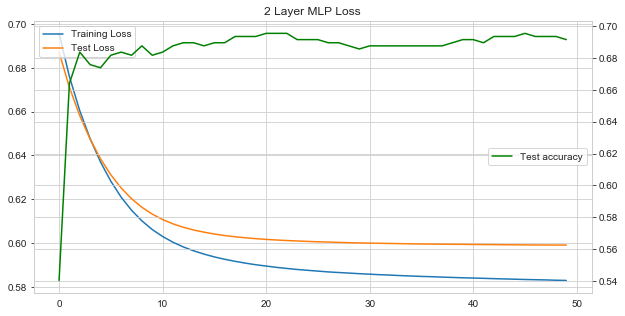

In [26]:
_, ax = plt.subplots(figsize=(10,5))
ax.plot(epoch_loss)
ax.plot(test_loss)
ax.set_title('2 Layer MLP Loss')
ax.legend(['Training Loss','Test Loss'],loc='upper left')

ax1 = ax.twinx()
ax1.plot(test_acc, color='green')
ax1.legend(['Test accuracy'],loc='center right')


Val accuracy 0.6640471512770137
Average Precision 0.631490639116385


defaultdict(list,
            {'tpr': 0.5097087378640777,
             'fpr': 0.23102310231023102,
             'fnr': 0.49029126213592233,
             'tnr': 0.768976897689769,
             'acc': 0.6640471512770137,
             'precision': 0.6,
             'AP': 0.631490639116385,
             'f1': 0.5511811023622046,
             'cohenkappa': 0.28556419243365694,
             'auroc': 0.6393428177769234})

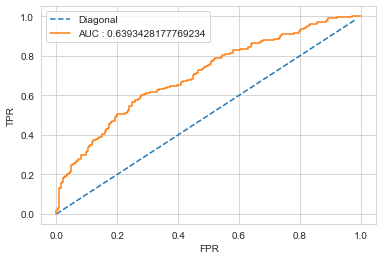

In [155]:


model_mlp.eval()
pred = torch.sigmoid(model_mlp(xtestnorm))
# test_loss += [criterion(pred,ytestt.to(torch.float)).detach().item()]
print(f'Val accuracy {acc_fn(pred,ytestt)}')
# test_acc += [acc_fn(pred,ytestt)]
        
        
met_nn = Evaluation(y_test_final.values,pred.detach().numpy())
print('Average Precision',sk_metrics.average_precision_score(y_test_final.values,pred.detach().numpy()))
met_nn.rate()

Val accuracy 0.6836935166994106
Average Precision 0.6497797604576151


defaultdict(list,
            {'tpr': 0.49514563106796117,
             'fpr': 0.18811881188118812,
             'fnr': 0.5048543689320388,
             'tnr': 0.8118811881188119,
             'acc': 0.6836935166994106,
             'precision': 0.6415094339622641,
             'AP': 0.6497797604576151,
             'f1': 0.558904109589041,
             'cohenkappa': 0.3186644163056943,
             'auroc': 0.6535134095933866})

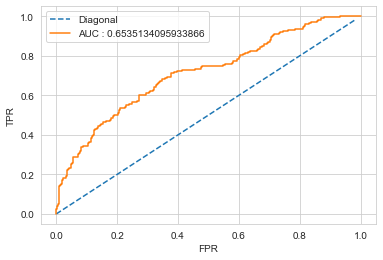

In [194]:


model_mlp.eval()
pred = torch.sigmoid(model_mlp(xtestnorm))
# test_loss += [criterion(pred,ytestt.to(torch.float)).detach().item()]
print(f'Val accuracy {acc_fn(pred,ytestt)}')
# test_acc += [acc_fn(pred,ytestt)]
        
        
met_nn = Evaluation(y_test_final.values,pred.detach().numpy())
print('Average Precision',sk_metrics.average_precision_score(y_test_final.values,pred.detach().numpy()))
met_nn.rate()

C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\3266941590.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])
  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
114it [00:01, 109.52it/s]                                                                                              


Epoch 0 Loss 0.6775852091479719 , Train Accuracy 0.5657894736842105


114it [00:01, 111.89it/s]                                                                                              


Epoch 1 Loss 0.64411179355362 , Train Accuracy 0.618421052631579


114it [00:01, 111.33it/s]                                                                                              


Epoch 2 Loss 0.6304116983685577 , Train Accuracy 0.6518640350877193


114it [00:01, 110.98it/s]                                                                                              


Epoch 3 Loss 0.6258772588089893 , Train Accuracy 0.6524122807017544


114it [00:01, 110.76it/s]                                                                                              


Epoch 4 Loss 0.6194365821909487 , Train Accuracy 0.6441885964912281


114it [00:01, 105.63it/s]                                                                                              


Epoch 5 Loss 0.6118624189443755 , Train Accuracy 0.6644736842105263


114it [00:01, 108.22it/s]                                                                                              


Epoch 6 Loss 0.6077024479184234 , Train Accuracy 0.6650219298245614


114it [00:01, 112.08it/s]                                                                                              


Epoch 7 Loss 0.6094942202693537 , Train Accuracy 0.6666666666666666


114it [00:00, 124.37it/s]                                                                                              


Epoch 8 Loss 0.6041520007869654 , Train Accuracy 0.6650219298245614


114it [00:00, 125.54it/s]                                                                                              


Epoch 9 Loss 0.611595742273749 , Train Accuracy 0.6716008771929824


114it [00:00, 121.33it/s]                                                                                              


Epoch 10 Loss 0.5953763725987652 , Train Accuracy 0.6836622807017544


114it [00:00, 121.75it/s]                                                                                              


Epoch 11 Loss 0.6044842545923433 , Train Accuracy 0.6694078947368421


114it [00:01, 86.16it/s]                                                                                               


Epoch 12 Loss 0.5948259796489749 , Train Accuracy 0.6875


114it [00:00, 123.86it/s]                                                                                              


Epoch 13 Loss 0.6004131310864499 , Train Accuracy 0.6672149122807017


114it [00:00, 123.01it/s]                                                                                              


Epoch 14 Loss 0.5960816542307535 , Train Accuracy 0.6896929824561403


114it [00:00, 125.66it/s]                                                                                              


Epoch 15 Loss 0.5989461998667633 , Train Accuracy 0.6798245614035088


114it [00:00, 124.86it/s]                                                                                              


Epoch 16 Loss 0.5988765711847105 , Train Accuracy 0.6842105263157895


114it [00:00, 121.83it/s]                                                                                              


Epoch 17 Loss 0.6000660006937227 , Train Accuracy 0.674890350877193


114it [00:01, 91.34it/s]                                                                                               


Epoch 18 Loss 0.5871097620641976 , Train Accuracy 0.6896929824561403


114it [00:01, 84.15it/s]                                                                                               
C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\3266941590.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])


Epoch 19 Loss 0.5933687318312494 , Train Accuracy 0.6803728070175439
defaultdict(<class 'list'>, {'tpr': 0.5242718446601942, 'fpr': 0.26732673267326734, 'fnr': 0.47572815533980584, 'tnr': 0.7326732673267327, 'acc': 0.6483300589390962, 'precision': 0.5714285714285714, 'AP': 0.6201355101500081, 'f1': 0.5468354430379747, 'cohenkappa': 0.26038461850682304, 'auroc': 0.6284725559934634})


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
114it [00:00, 122.59it/s]                                                                                              


Epoch 0 Loss 0.6719276837089605 , Train Accuracy 0.5893640350877193


114it [00:00, 127.49it/s]                                                                                              


Epoch 1 Loss 0.6440217191712898 , Train Accuracy 0.6392543859649122


114it [00:00, 118.88it/s]                                                                                              


Epoch 2 Loss 0.6305939557782391 , Train Accuracy 0.637609649122807


114it [00:00, 120.46it/s]                                                                                              


Epoch 3 Loss 0.6163292082778195 , Train Accuracy 0.6535087719298246


114it [00:00, 121.59it/s]                                                                                              


Epoch 4 Loss 0.6081324211860958 , Train Accuracy 0.662828947368421


114it [00:01, 81.26it/s]                                                                                               


Epoch 5 Loss 0.6204185530281904 , Train Accuracy 0.6546052631578947


114it [00:01, 98.08it/s]                                                                                               


Epoch 6 Loss 0.6103976039510024 , Train Accuracy 0.6737938596491229


114it [00:00, 121.82it/s]                                                                                              


Epoch 7 Loss 0.6103089972023379 , Train Accuracy 0.680921052631579


114it [00:00, 122.72it/s]                                                                                              


Epoch 8 Loss 0.608000833214375 , Train Accuracy 0.6754385964912281


114it [00:00, 124.55it/s]                                                                                              


Epoch 9 Loss 0.5948656128163923 , Train Accuracy 0.6929824561403509


114it [00:00, 122.64it/s]                                                                                              


Epoch 10 Loss 0.6001769278133124 , Train Accuracy 0.6836622807017544


114it [00:00, 116.15it/s]                                                                                              


Epoch 11 Loss 0.6007062492140552 , Train Accuracy 0.6787280701754386


114it [00:01, 79.99it/s]                                                                                               


Epoch 12 Loss 0.6013658974777188 , Train Accuracy 0.6896929824561403


114it [00:01, 105.54it/s]                                                                                              


Epoch 13 Loss 0.6018526551493427 , Train Accuracy 0.6847587719298246


114it [00:00, 127.07it/s]                                                                                              


Epoch 14 Loss 0.5944893872528746 , Train Accuracy 0.6957236842105263


114it [00:00, 124.71it/s]                                                                                              


Epoch 15 Loss 0.6068456235684847 , Train Accuracy 0.6787280701754386


114it [00:00, 119.77it/s]                                                                                              


Epoch 16 Loss 0.5915451358284867 , Train Accuracy 0.6968201754385965


114it [00:00, 120.55it/s]                                                                                              


Epoch 17 Loss 0.5953498558517087 , Train Accuracy 0.6798245614035088


114it [00:01, 104.03it/s]                                                                                              


Epoch 18 Loss 0.5957940411672258 , Train Accuracy 0.6699561403508771


114it [00:01, 103.46it/s]                                                                                              
C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\3266941590.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])


Epoch 19 Loss 0.586787738036691 , Train Accuracy 0.6891447368421053
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.22442244224422442, 'fnr': 0.46116504854368934, 'tnr': 0.7755775577557755, 'acc': 0.6797642436149313, 'precision': 0.6201117318435754, 'AP': 0.6570064417806478, 'f1': 0.5766233766233766, 'cohenkappa': 0.3211500855036533, 'auroc': 0.6572062546060431})


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
114it [00:00, 121.40it/s]                                                                                              


Epoch 0 Loss 0.6838796034193876 , Train Accuracy 0.5493421052631579


114it [00:00, 118.70it/s]                                                                                              


Epoch 1 Loss 0.6481445212113229 , Train Accuracy 0.6288377192982456


114it [00:00, 122.28it/s]                                                                                              


Epoch 2 Loss 0.6382215020426533 , Train Accuracy 0.6217105263157895


114it [00:00, 121.88it/s]                                                                                              


Epoch 3 Loss 0.6309120673359486 , Train Accuracy 0.6480263157894737


114it [00:01, 102.72it/s]                                                                                              


Epoch 4 Loss 0.6268947009454694 , Train Accuracy 0.6606359649122807


114it [00:01, 74.04it/s]                                                                                               


Epoch 5 Loss 0.6204617483574048 , Train Accuracy 0.6639254385964912


114it [00:00, 118.89it/s]                                                                                              


Epoch 6 Loss 0.6240400917697371 , Train Accuracy 0.6677631578947368


114it [00:00, 127.03it/s]                                                                                              


Epoch 7 Loss 0.6043886774987505 , Train Accuracy 0.668859649122807


114it [00:00, 120.47it/s]                                                                                              


Epoch 8 Loss 0.6065661156909508 , Train Accuracy 0.6721491228070176


114it [00:00, 120.52it/s]                                                                                              


Epoch 9 Loss 0.6086122709930989 , Train Accuracy 0.6694078947368421


114it [00:00, 119.75it/s]                                                                                              


Epoch 10 Loss 0.6091051428464421 , Train Accuracy 0.6743421052631579


114it [00:01, 77.48it/s]                                                                                               


Epoch 11 Loss 0.601447634791073 , Train Accuracy 0.6798245614035088


114it [00:01, 86.56it/s]                                                                                               


Epoch 12 Loss 0.5936949399479649 , Train Accuracy 0.694078947368421


114it [00:00, 118.23it/s]                                                                                              


Epoch 13 Loss 0.6024877065629289 , Train Accuracy 0.6842105263157895


114it [00:00, 115.38it/s]                                                                                              


Epoch 14 Loss 0.6009666153736282 , Train Accuracy 0.6759868421052632


114it [00:00, 120.47it/s]                                                                                              


Epoch 15 Loss 0.5945185807190443 , Train Accuracy 0.6896929824561403


114it [00:01, 100.42it/s]                                                                                              


Epoch 16 Loss 0.6033036745431131 , Train Accuracy 0.6787280701754386


114it [00:01, 70.88it/s]                                                                                               


Epoch 17 Loss 0.606859910644983 , Train Accuracy 0.6814692982456141


114it [00:01, 86.89it/s]                                                                                               


Epoch 18 Loss 0.5983230798390874 , Train Accuracy 0.6836622807017544


114it [00:00, 122.92it/s]                                                                                              
C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\3266941590.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])


Epoch 19 Loss 0.5945025865446057 , Train Accuracy 0.6831140350877193
defaultdict(<class 'list'>, {'tpr': 0.558252427184466, 'fpr': 0.2607260726072607, 'fnr': 0.441747572815534, 'tnr': 0.7392739273927392, 'acc': 0.6660117878192534, 'precision': 0.5927835051546392, 'AP': 0.651965621162578, 'f1': 0.575, 'cohenkappa': 0.30032667054790096, 'auroc': 0.6487631772886027})


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
114it [00:00, 127.15it/s]                                                                                              


Epoch 0 Loss 0.6816021564759707 , Train Accuracy 0.5756578947368421


114it [00:00, 125.81it/s]                                                                                              


Epoch 1 Loss 0.6384840950108411 , Train Accuracy 0.6441885964912281


114it [00:00, 121.97it/s]                                                                                              


Epoch 2 Loss 0.629457488656044 , Train Accuracy 0.6387061403508771


114it [00:00, 124.60it/s]                                                                                              


Epoch 3 Loss 0.6150240398812712 , Train Accuracy 0.6677631578947368


114it [00:01, 84.60it/s]                                                                                               


Epoch 4 Loss 0.6109661514821806 , Train Accuracy 0.6611842105263158


114it [00:01, 99.85it/s]                                                                                               


Epoch 5 Loss 0.6169174462556839 , Train Accuracy 0.6584429824561403


114it [00:00, 128.22it/s]                                                                                              


Epoch 6 Loss 0.6176808515661641 , Train Accuracy 0.6633771929824561


114it [00:00, 130.05it/s]                                                                                              


Epoch 7 Loss 0.6010846519156506 , Train Accuracy 0.6836622807017544


114it [00:00, 129.89it/s]                                                                                              


Epoch 8 Loss 0.6004157871530768 , Train Accuracy 0.6754385964912281


114it [00:00, 131.01it/s]                                                                                              


Epoch 9 Loss 0.6076845105802804 , Train Accuracy 0.6743421052631579


114it [00:00, 127.81it/s]                                                                                              


Epoch 10 Loss 0.6065395393392496 , Train Accuracy 0.6622807017543859


114it [00:00, 129.73it/s]                                                                                              


Epoch 11 Loss 0.5998856373000563 , Train Accuracy 0.6814692982456141


114it [00:00, 130.37it/s]                                                                                              


Epoch 12 Loss 0.59690651010003 , Train Accuracy 0.6726973684210527


114it [00:00, 129.97it/s]                                                                                              


Epoch 13 Loss 0.6045811513536855 , Train Accuracy 0.6710526315789473


114it [00:00, 128.93it/s]                                                                                              


Epoch 14 Loss 0.5896799684616557 , Train Accuracy 0.6880482456140351


114it [00:00, 132.08it/s]                                                                                              


Epoch 15 Loss 0.5946675227922306 , Train Accuracy 0.6891447368421053


114it [00:00, 129.79it/s]                                                                                              


Epoch 16 Loss 0.5867523527459094 , Train Accuracy 0.6891447368421053


114it [00:00, 127.91it/s]                                                                                              


Epoch 17 Loss 0.588055773262392 , Train Accuracy 0.694078947368421


114it [00:00, 130.24it/s]                                                                                              


Epoch 18 Loss 0.5919846641389948 , Train Accuracy 0.6842105263157895


114it [00:00, 128.91it/s]                                                                                              
C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\3266941590.py:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  batch_val_x = torch.tensor(xnorm[seq[split:],:])


Epoch 19 Loss 0.5862357297487426 , Train Accuracy 0.6825657894736842
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.23432343234323433, 'fnr': 0.46116504854368934, 'tnr': 0.7656765676567657, 'acc': 0.6738703339882122, 'precision': 0.6098901098901099, 'AP': 0.6477272377103721, 'f1': 0.5721649484536082, 'cohenkappa': 0.3102981029810298, 'auroc': 0.6522557595565381})


  0%|                                                                                           | 0/16 [00:00<?, ?it/s]C:\Users\chunhunghow\AppData\Local\Temp\ipykernel_1200\2724875936.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yield (torch.tensor(X[batchind]),torch.tensor(y[batchind]))
114it [00:00, 127.47it/s]                                                                                              


Epoch 0 Loss 0.6729708340084344 , Train Accuracy 0.581140350877193


114it [00:00, 126.89it/s]                                                                                              


Epoch 1 Loss 0.6361437560173503 , Train Accuracy 0.6447368421052632


114it [00:00, 129.19it/s]                                                                                              


Epoch 2 Loss 0.6202113952553063 , Train Accuracy 0.643640350877193


114it [00:00, 128.46it/s]                                                                                              


Epoch 3 Loss 0.629119060802878 , Train Accuracy 0.6469298245614035


114it [00:00, 128.02it/s]                                                                                              


Epoch 4 Loss 0.6161232015542817 , Train Accuracy 0.6578947368421053


114it [00:00, 128.86it/s]                                                                                              


Epoch 5 Loss 0.6041665976507622 , Train Accuracy 0.6716008771929824


114it [00:00, 129.02it/s]                                                                                              


Epoch 6 Loss 0.6054163041867708 , Train Accuracy 0.674890350877193


114it [00:00, 126.97it/s]                                                                                              


Epoch 7 Loss 0.6069569140672684 , Train Accuracy 0.6726973684210527


114it [00:00, 129.79it/s]                                                                                              


Epoch 8 Loss 0.6100250827638727 , Train Accuracy 0.65625


114it [00:00, 127.79it/s]                                                                                              


Epoch 9 Loss 0.6019107417056435 , Train Accuracy 0.6798245614035088


114it [00:00, 121.89it/s]                                                                                              


Epoch 10 Loss 0.6092001202336529 , Train Accuracy 0.6655701754385965


114it [00:00, 120.24it/s]                                                                                              


Epoch 11 Loss 0.6008838172021665 , Train Accuracy 0.6770833333333334


114it [00:00, 117.34it/s]                                                                                              


Epoch 12 Loss 0.5973623687760872 , Train Accuracy 0.6853070175438597


114it [00:01, 98.63it/s]                                                                                               


Epoch 13 Loss 0.5973096963083535 , Train Accuracy 0.6803728070175439


114it [00:01, 85.54it/s]                                                                                               


Epoch 14 Loss 0.592711268286956 , Train Accuracy 0.6918859649122807


114it [00:01, 90.58it/s]                                                                                               


Epoch 15 Loss 0.5979747246754797 , Train Accuracy 0.6759868421052632


114it [00:00, 115.80it/s]                                                                                              


Epoch 16 Loss 0.5915546338809164 , Train Accuracy 0.6814692982456141


114it [00:00, 115.74it/s]                                                                                              


Epoch 17 Loss 0.5916451516381481 , Train Accuracy 0.680921052631579


114it [00:00, 117.54it/s]                                                                                              


Epoch 18 Loss 0.5941102758311388 , Train Accuracy 0.680921052631579


114it [00:01, 105.27it/s]                                                                                              


Epoch 19 Loss 0.5851335996075681 , Train Accuracy 0.7066885964912281
defaultdict(<class 'list'>, {'tpr': 0.5048543689320388, 'fpr': 0.21122112211221122, 'fnr': 0.49514563106796117, 'tnr': 0.7887788778877888, 'acc': 0.6738703339882122, 'precision': 0.6190476190476191, 'AP': 0.6527866416973241, 'f1': 0.5561497326203209, 'cohenkappa': 0.3025670656211309, 'auroc': 0.6468166234099139})


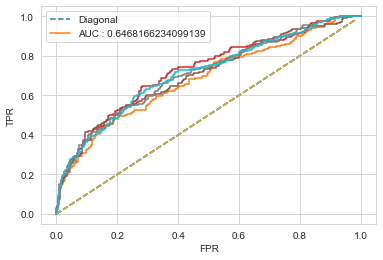

In [169]:
for i in [0,10,100,1000,10000]:
    X_train_final_mlp = X_train_final.apply(lambda x:x.astype(float))
    xnorm = (X_train_final_mlp - X_train_final_mlp.mean())/ X_train_final_mlp.std()
    xnorm = torch.tensor(xnorm.values).to(torch.float)



    X_test_final_mlp = X_test_final.apply(lambda x:x.astype(float))
    xtestnorm = (X_test_final_mlp - X_test_final_mlp.mean())/ X_test_final_mlp.std()
    xtestnorm = torch.tensor(xtestnorm.values).to(torch.float)
    ytestt = torch.tensor(y_test.values)

    acc_fn = lambda out,y : ((out > 0.5).view(-1).to(torch.float).numpy()  == y.view(-1).numpy()).mean()

    torch.manual_seed(i)


    np.random.seed(i)
    val_loss = []
    val_acc = []
#     for run in range(5):
    model_mlp = mlp(len(X_train_final_mlp.columns),512, 4)
    criterion = torch.nn.BCELoss()
    optimizer = torch.optim.SGD(model_mlp.parameters(), lr=0.001)
    batchsize = 16

    epoch_loss = []
    seq = np.arange(xnorm.shape[0])
    np.random.shuffle(seq)
    split = int(len(seq) * 0.9)
    batch_val_x = torch.tensor(xnorm[seq[split:],:])
    batch_val_y = torch.tensor(y_train_final.values[seq[split:]])
    batch_train = xnorm[seq[:split],:]
    batch_y = y_train_final.values[seq[:split]]

    for e in range(20):
        model_mlp.train()
        acc = []
        loader1 = loader(batch_train, batch_y,batchsize)
        bar = tqdm(loader1,total=batchsize, position=0, leave=True)
        batch_loss = []
        for (x,y) in bar:
            y = y[:,None].to(torch.float)
            out = model_mlp(x)
            out = torch.sigmoid(out)
            loss = criterion(out,y )
            loss.backward()
            batch_loss += [loss.detach().item()]
            optimizer.step()
            optimizer.zero_grad()
            acc += [acc_fn(out,y)]
#             bar.update()
        epoch_loss += [np.mean(batch_loss)]
        print(f'Epoch {e} Loss {np.mean(batch_loss)} , Train Accuracy {np.mean(acc)}')
    model_mlp.eval()
    pred = torch.sigmoid(model_mlp(batch_val_x))
    val_loss += [criterion(pred.flatten(),batch_val_y.to(torch.float)).detach().item()]
#         print(f'Val accuracy {acc_fn(pred,batch_val_y)}')
    val_acc += [acc_fn(pred,batch_val_y)]
    
    model_mlp.eval()
    pred = torch.sigmoid(model_mlp(xtestnorm))
    # test_loss += [criterion(pred,ytestt.to(torch.float)).detach().item()]
#     print(f'Val accuracy {acc_fn(pred,ytestt)}')
    # test_acc += [acc_fn(pred,ytestt)]


    met_nn = Evaluation(y_test_final.values,pred.detach().numpy())
#     print('Average Precision',sk_metrics.average_precision_score(y_test_final.values,pred.detach().numpy()))
    print(met_nn.rate())

In [170]:
acc = [0.6483300589390962,0.6797642436149313,0.6660117878192534,  0.6738703339882122, 0.6738703339882122]
auroc = [0.6468166234099139,0.6522557595565381,0.6487631772886027,0.6572062546060431,0.6284725559934634 ]
print(np.mean(acc), np.mean(auroc), np.std(auroc))


0.668369351669941 0.6467028741709122 0.009775048085284765


In [171]:
(0.6467028741709122 - 0.667) / (0.009775048085284765 / np.sqrt(5))

-4.643020955572617

Random Forest

{'n_estimators': 465, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 4, 'min_samples_leaf': 16, 'max_depth': 75, 'criterion': 'gini'}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[240  40]
 [101  93]]
defaultdict(<class 'list'>, {'tpr': 0.4793814432989691, 'fpr': 0.14285714285714285, 'fnr': 0.520618556701031, 'tnr': 0.8571428571428571, 'acc': 0.7025316455696202, 'precision': 0.6992481203007519, 'AP': 0.7052180509158139, 'f1': 0.5688073394495412, 'cohenkappa': 0.35359885486585296, 'auroc': 0.6682621502209132})
CPU times: total: 2min 23s
Wall time: 2min 23s


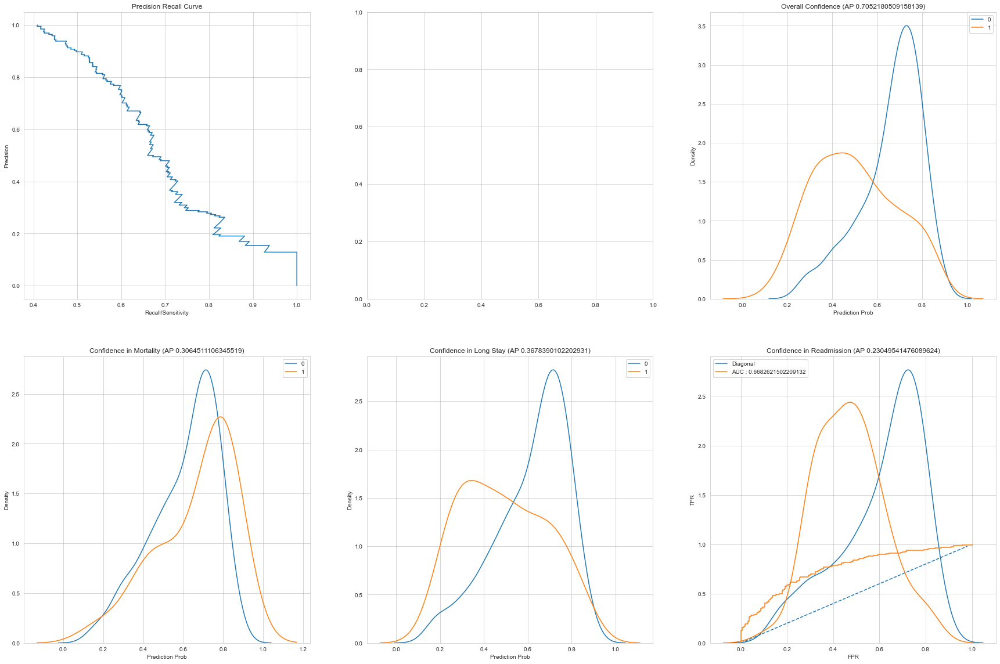

In [22]:

%%time
model_rf = RandomForestClassifier()
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

rf_param_grid = {'n_estimators':np.arange(5,500,20), 
                 'criterion':['gini','entropy'], 
                 'max_depth':np.arange(5,100,10), 
                 'min_samples_split':[2,4,8,10], 
                 'min_samples_leaf':np.arange(1,20),
                 'min_weight_fraction_leaf' : np.arange(0,0.5,0.02),
                
                }


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_rfc = RandomizedSearchCV(estimator=model_rf,param_distributions=rf_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)

CV_rfc.fit(X_train_final.values, y_train_final.values)
print(CV_rfc.best_params_)


met_rf = plot_eval(CV_rfc, X_test_final, y_test_final)

[[253  50]
 [ 98 108]]
defaultdict(<class 'list'>, {'tpr': 0.5242718446601942, 'fpr': 0.16501650165016502, 'fnr': 0.47572815533980584, 'tnr': 0.834983498349835, 'acc': 0.7092337917485265, 'precision': 0.6835443037974683, 'AP': 0.6813141050347893, 'f1': 0.5934065934065935, 'cohenkappa': 0.37317357297387244, 'auroc': 0.6796276715050146})


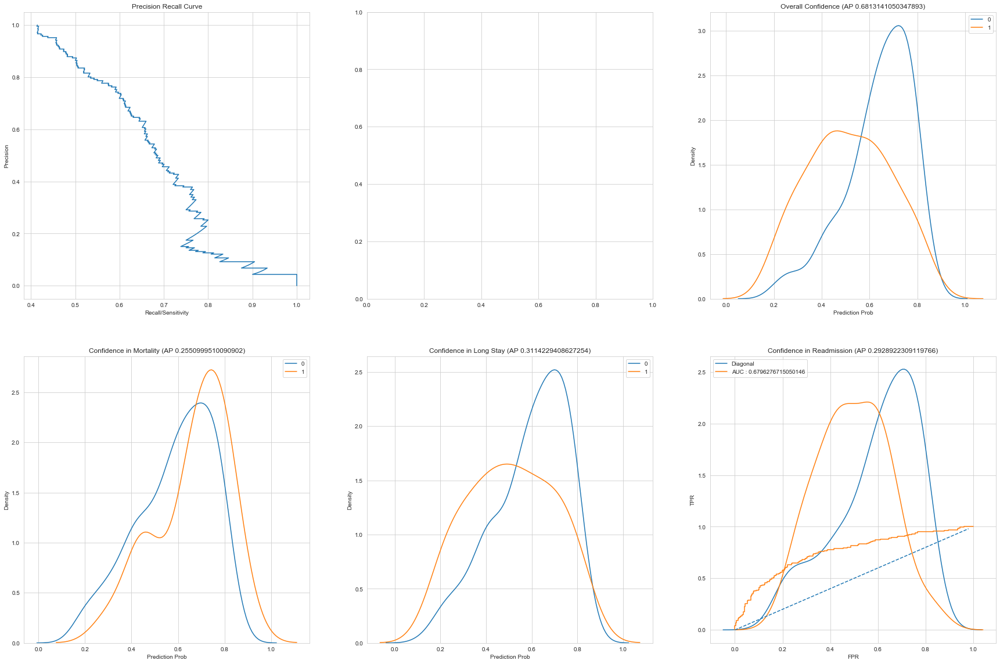

In [214]:
met_rf = plot_eval(CV_rfc, X_test_final, y_test_final)

In [209]:
CV_rfc.best_estimator_.feature_importances_

array([0.0474198 , 0.0201454 , 0.046506  , 0.14699539, 0.01856649,
       0.14998583, 0.03490647, 0.07966037, 0.03819428, 0.03196744,
       0.01279413, 0.04575504, 0.0025111 , 0.02524581, 0.03358448,
       0.02657479, 0.0215538 , 0.0186276 , 0.00547912, 0.033264  ,
       0.11062703, 0.04963564])

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[251  52]
 [ 96 110]]
defaultdict(<class 'list'>, {'tpr': 0.5339805825242718, 'fpr': 0.1716171617161716, 'fnr': 0.46601941747572817, 'tnr': 0.8283828382838284, 'acc': 0.7092337917485265, 'precision': 0.6790123456790124, 'AP': 0.6737376303032473, 'f1': 0.5978260869565217, 'cohenkappa': 0.37519076371839954, 'auroc': 0.6811817104040501})


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[253  50]
 [ 97 109]]
defaultdict(<class 'list'>, {'tpr': 0.529126213592233, 'fpr': 0.16501650165016502, 'fnr': 0.470873786407767, 'tnr': 0.834983498349835, 'acc': 0.7111984282907662, 'precision': 0.6855345911949685, 'AP': 0.6662006176031448, 'f1': 0.5972602739726026, 'cohenkappa': 0.3779109888008514, 'auroc': 0.682054855971034})


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[255  48]
 [ 99 107]]
defaultdict(<class 'list'>, {'tpr': 0.5194174757281553, 'fpr': 0.15841584158415842, 'fnr': 0.48058252427184467, 'tnr': 0.8415841584158416, 'acc': 0.7111984282907662, 'precision': 0.6903225806451613, 'AP': 0.6775549998156848, 'f1': 0.592797783933518, 'cohenkappa': 0.37589770537747413, 'auroc': 0.6805008170719985})


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[255  48]
 [106 100]]
defaultdict(<class 'list'>, {'tpr': 0.4854368932038835, 'fpr': 0.15841584158415842, 'fnr': 0.5145631067961165, 'tnr': 0.8415841584158416, 'acc': 0.6974459724950884, 'precision': 0.6756756756756757, 'AP': 0.6654503451227358, 'f1': 0.5649717514124294, 'cohenkappa': 0.34245449207281276, 'auroc': 0.6635105258098625})


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[252  51]
 [ 95 111]]
defaultdict(<class 'list'>, {'tpr': 0.5388349514563107, 'fpr': 0.16831683168316833, 'fnr': 0.46116504854368934, 'tnr': 0.8316831683168316, 'acc': 0.7131630648330058, 'precision': 0.6851851851851852, 'AP': 0.6796105203309877, 'f1': 0.6032608695652174, 'cohenkappa': 0.38363413177625905, 'auroc': 0.6852590598865712})


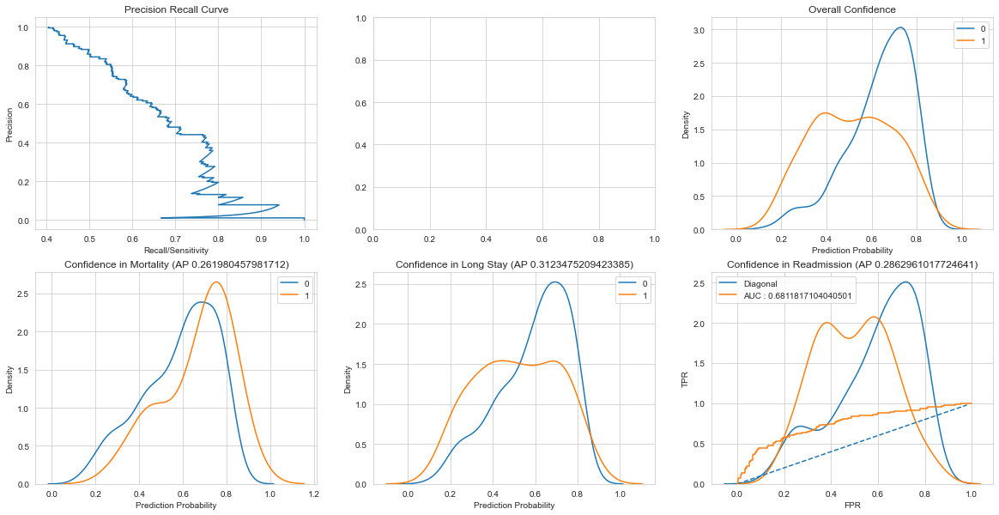

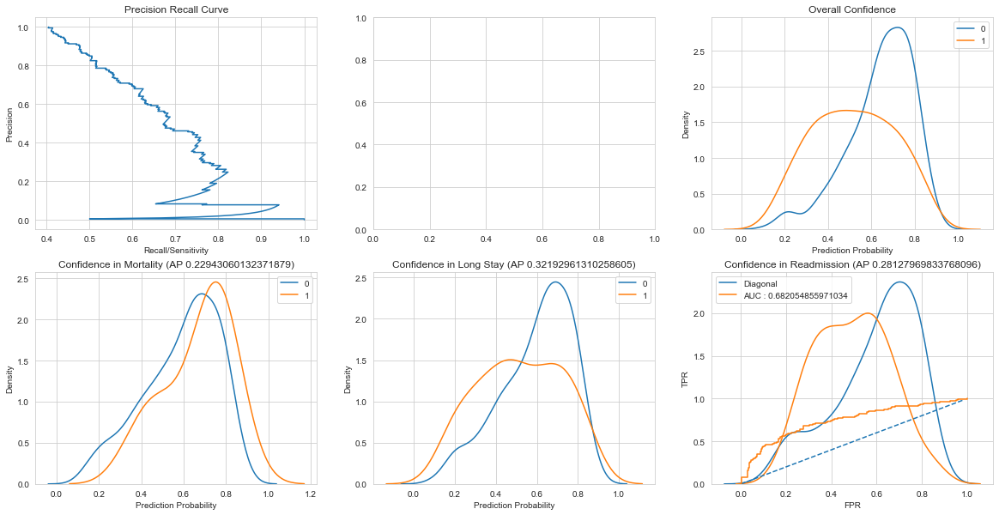

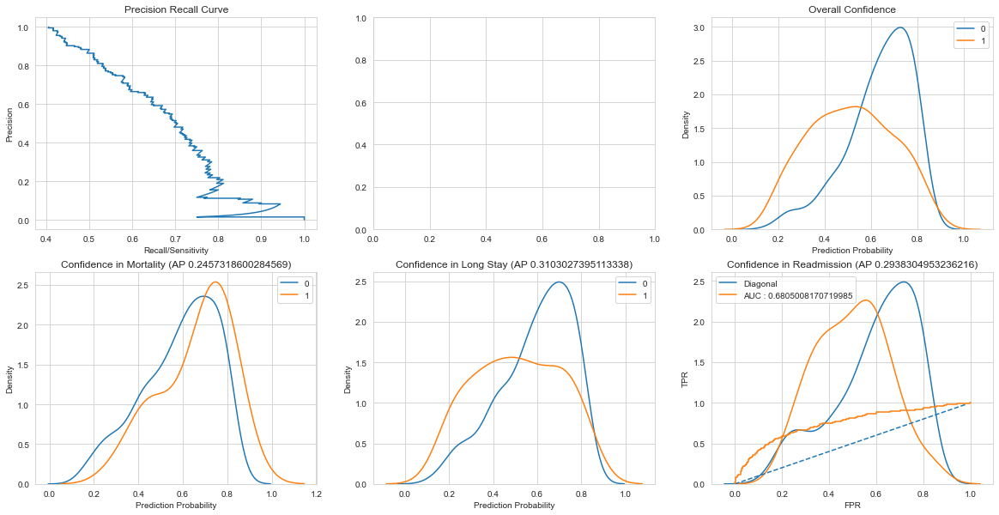

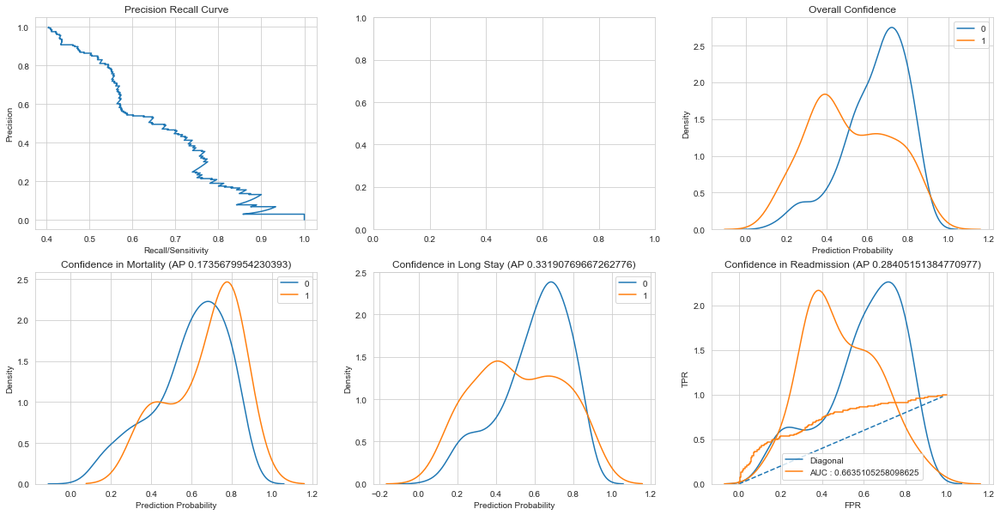

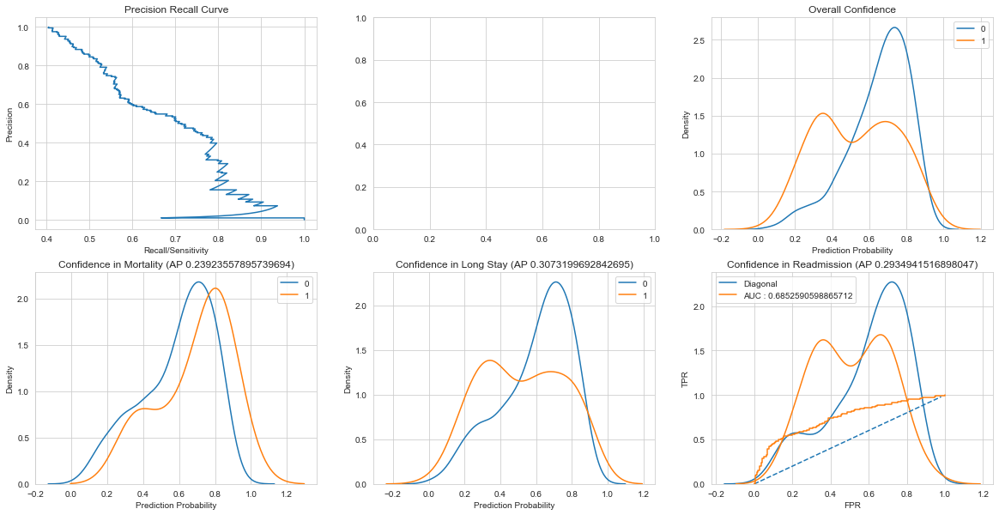

In [19]:
for i in [0,10,100,1000,10000]:
    model_rf = RandomForestClassifier()
    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

    rf_param_grid = {'n_estimators':np.arange(5,500,20), 
                     'criterion':['gini','entropy'], 
                     'max_depth':np.arange(5,100,10), 
                     'min_samples_split':[2,4,8,10], 
                     'min_samples_leaf':np.arange(1,20),
                     'min_weight_fraction_leaf' : np.arange(0,0.5,0.02),

                    }


    # CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
    CV_rfc = RandomizedSearchCV(estimator=model_rf,param_distributions=rf_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=i)

    CV_rfc.fit(X_train_final.values, y_train_final.values)
#     print(CV_rfc.best_params_)


    met_rf = plot_eval(CV_rfc, X_test_final, y_test_final)

Logistic Regression

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did no

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the co

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was re

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 0.1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[239  41]
 [107  87]]
defaultdict(<class 'list'>, {'tpr': 0.4484536082474227, 'fpr': 0.14642857142857144, 'fnr': 0.5515463917525774, 'tnr': 0.8535714285714285, 'acc': 0.6877637130801688, 'precision': 0.6796875, 'AP': 0.7023345818388523, 'f1': 0.5403726708074534, 'cohenkappa': 0.3186744881706226, 'auroc': 0.6510125184094255})


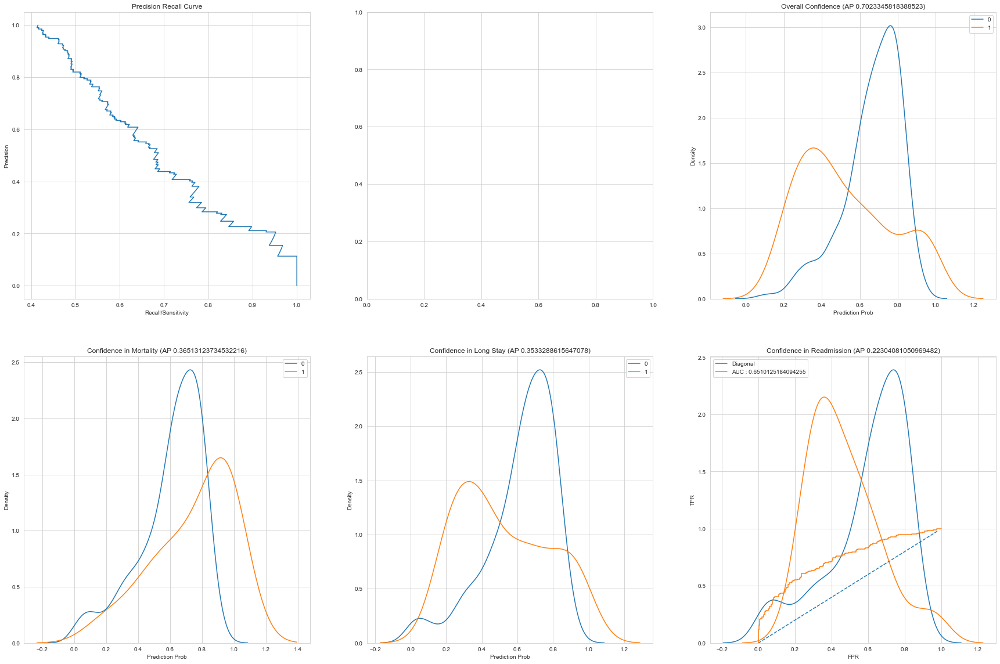

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

logit = LogisticRegression(random_state=0)
log_param_grid = {'C':[0.001, 0.01,0.1, 1,10,100,1000], 
                 'penalty':['l2'], 
                 'solver': ['newton-cg','lbfgs','liblinear','sag','saga']
                
                }


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_logc = RandomizedSearchCV(estimator=logit,param_distributions=log_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)
CV_logc.fit(X_train_final.values, y_train_final.values)
print(CV_logc.best_params_)
plot_eval(CV_logc, X_test_final, y_test_final)
# main_llk = log_loss(prediction,prediction_prob[:,1])


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did no

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:210: ConvergenceWarning: newton-cg failed to converge. Increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_op

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 10}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.648001056466596, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


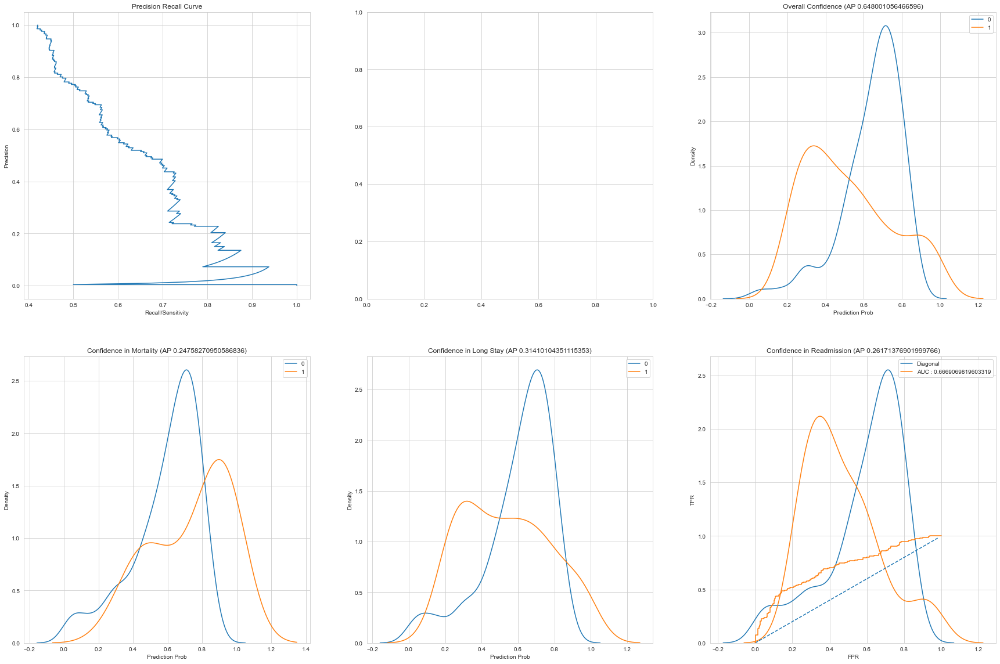

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

logit = LogisticRegression(random_state=0)
log_param_grid = {'C':[0.001, 0.01,0.1, 1,10,100,1000], 
                 'penalty':['l2'], 
                 'solver': ['newton-cg','lbfgs','liblinear','sag','saga']
                
                }


# CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
CV_logc = RandomizedSearchCV(estimator=logit,param_distributions=log_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=0)
CV_logc.fit(X_train_final.values, y_train_final.values)
print(CV_logc.best_params_)
plot_eval(CV_logc, X_test_final, y_test_final)
# main_llk = log_loss(prediction,prediction_prob[:,1])


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramD

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramD

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\s

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramD

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 35 is smaller than n_iter=50. Running 35 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. o

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\s

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packag

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:437: LineSearchWarning: Rounding errors prevent the line search from converging
  warn(msg, LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\optimize.py

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

{'solver': 'newton-cg', 'penalty': 'l2', 'C': 1}


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


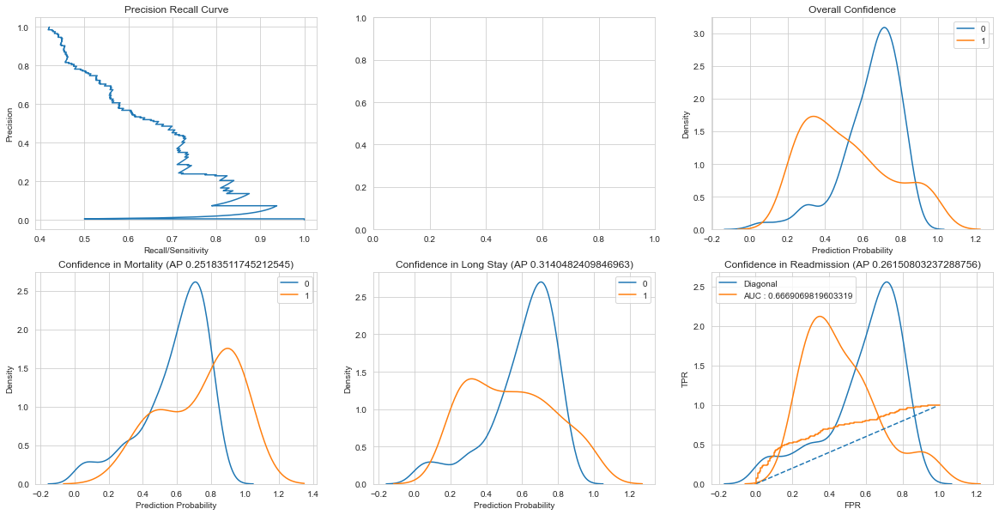

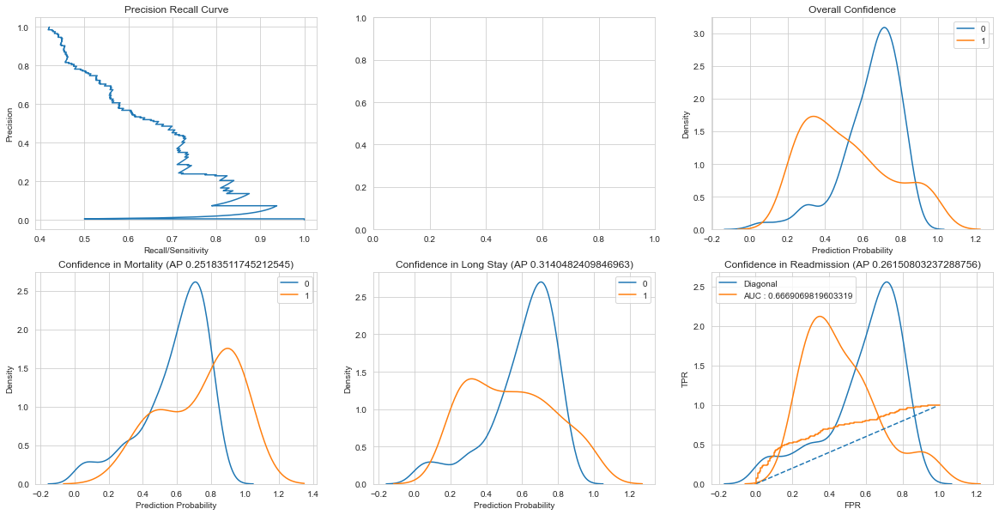

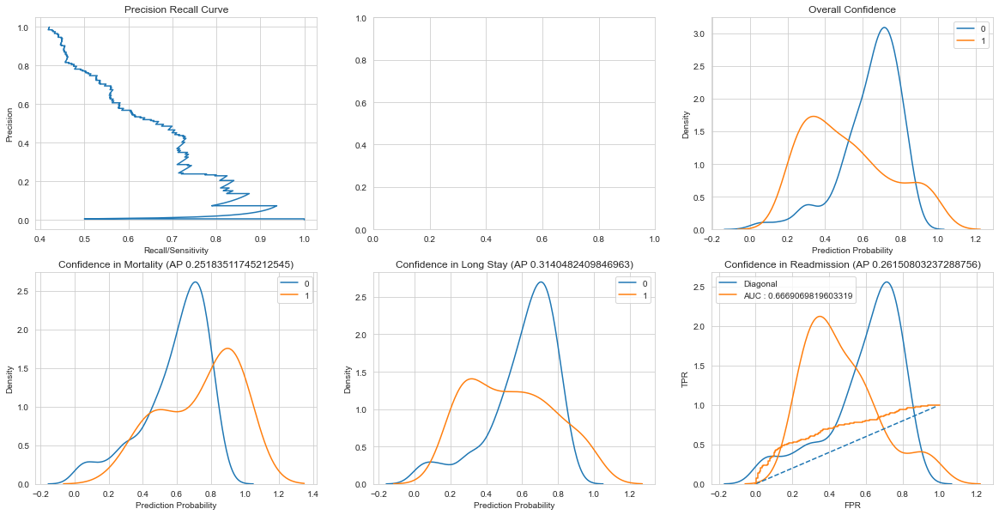

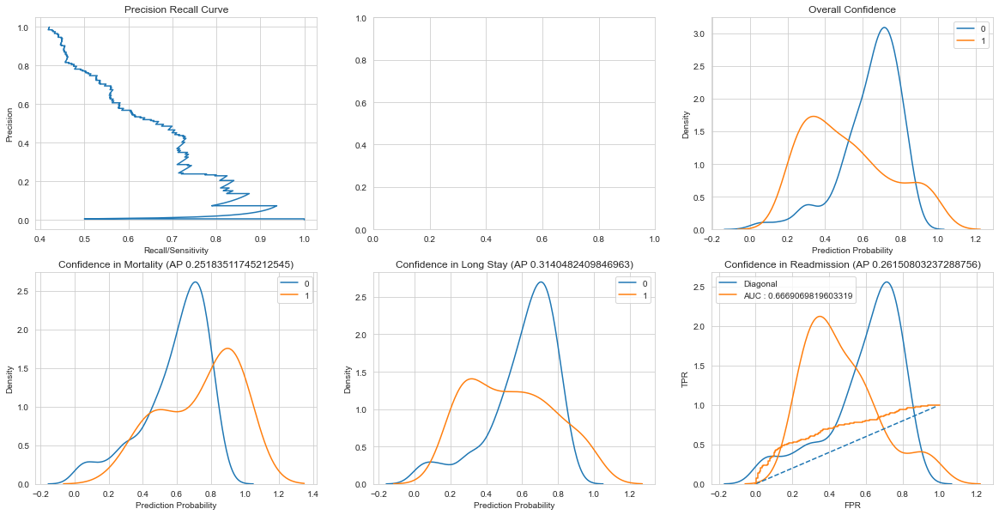

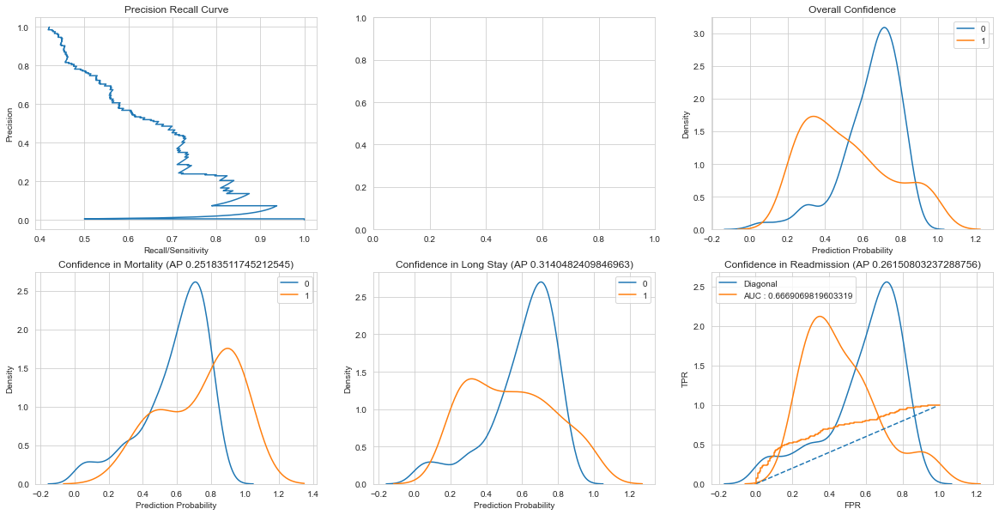

In [32]:
for i in [0,10,100,1000,10000]:
    from sklearn.linear_model import LogisticRegression
    from sklearn.metrics import log_loss

    from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

    logit = LogisticRegression(random_state=i)
    log_param_grid = {'C':[0.001, 0.01,0.1, 1,10,100,1000], 
                     'penalty':['l2'], 
                     'solver': ['newton-cg','lbfgs','liblinear','sag','saga']

                    }


    # CV_rfc = GridSearchCV(estimator=model_xg,param_grid=xg_param_grid, scoring='accuracy' ,cv=5)
    CV_logc = RandomizedSearchCV(estimator=logit,param_distributions=log_param_grid, scoring='balanced_accuracy' ,cv=8,n_iter=50,random_state=i)
    CV_logc.fit(X_train_final.values, y_train_final.values)
    print(CV_logc.best_params_)
    plot_eval(CV_logc, X_test_final, y_test_final)
    # main_llk = log_loss(prediction,prediction_prob[:,1])


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdep

[[260  43]
 [108  98]]
defaultdict(<class 'list'>, {'tpr': 0.47572815533980584, 'fpr': 0.1419141914191419, 'fnr': 0.5242718446601942, 'tnr': 0.858085808580858, 'acc': 0.7033398821218074, 'precision': 0.6950354609929078, 'AP': 0.6483126580707076, 'f1': 0.5648414985590777, 'cohenkappa': 0.35157047523432683, 'auroc': 0.6669069819603319})


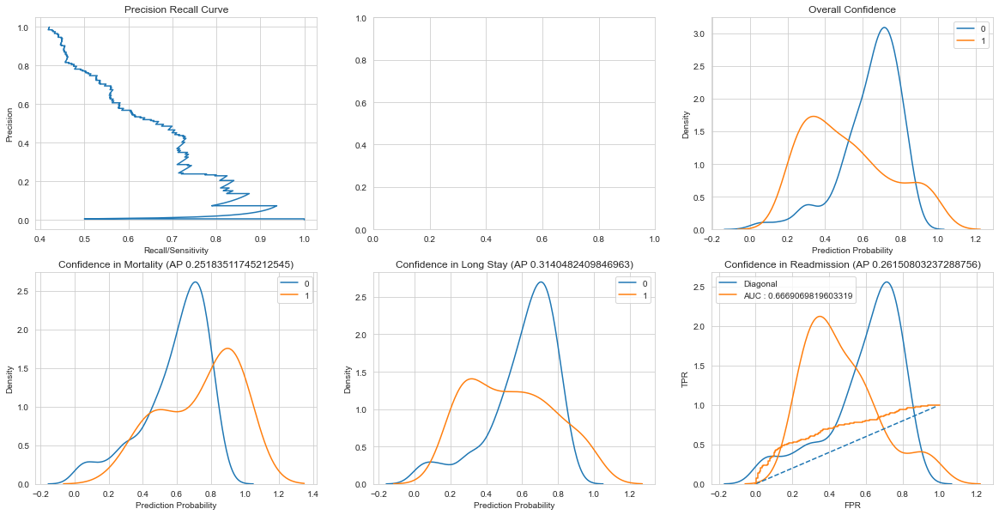

In [80]:
met_logit = plot_eval(CV_logc, X_test_final, y_test_final)

In [150]:
(((1 / (1 + np.exp(-(X_test_final.values @ CV_logc.best_estimator_.coef_[0].T + CV_logc.best_estimator_.intercept_).astype(float)))) >= 0.5) == y_test_final).mean()

0.6974459724950884

In [153]:
 CV_logc.best_estimator_.coef_

array([[ 3.46116810e-06,  4.67167550e-02,  1.71315916e-02,
        -4.20343505e-01,  4.02444963e-03, -8.25941834e-04,
         3.54630163e-01,  4.82530534e-03,  1.52752111e-01,
        -8.33503878e-07,  8.46060935e-02, -2.76246313e-02,
        -1.91581245e-01,  1.24968258e-06, -4.22017594e-03,
         4.30320686e-03,  7.60975054e-01,  1.08789255e-02,
         2.60274488e-01, -3.62075062e-02,  9.80145039e-04,
         4.26808186e-01]])

In [155]:
pd.DataFrame(zip(X_test_final.columns,CV_logc.estimator.coef_[0]))
# .to_clipboard(excel=True)

,0,1
0,input/output,2.277063e-06
1,adm_sofa,1.294395e-04
2,age,3.606532e-03
3,R CPN GLASGOW COMA SCALE SCORE,-2.448684e-03
4,RESPIRATIONS,-8.265570e-04
5,mv_duration,4.589802e-03
6,POCT PH,-3.786433e-04
7,vasopresser,4.745195e-03
8,cci,1.005338e-03
9,PO2/FIO2,-7.099611e-07


In [201]:
pd.DataFrame(list(zip(list(X_train_final.columns),CV_logc.estimator.fit(X_train_final.values, y_train_final.values).coef_[0] ))).rename(columns={0:'Variable',1:'Coef'}).set_index('Variable').to_clipboard(excel=True)

D:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
D:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [251]:
## From DAN, MV duration 0 replaced to median

stats['mv_duration'] = stats['mv_duration'].apply(lambda x: stats['mv_duration'].median() if x == 0 else x)

In [254]:
pd.concat([X_train_final, y_train_final],1).to_clipboard(excel=True)

In [213]:
X_test_final.to_clipboard(excel=True)

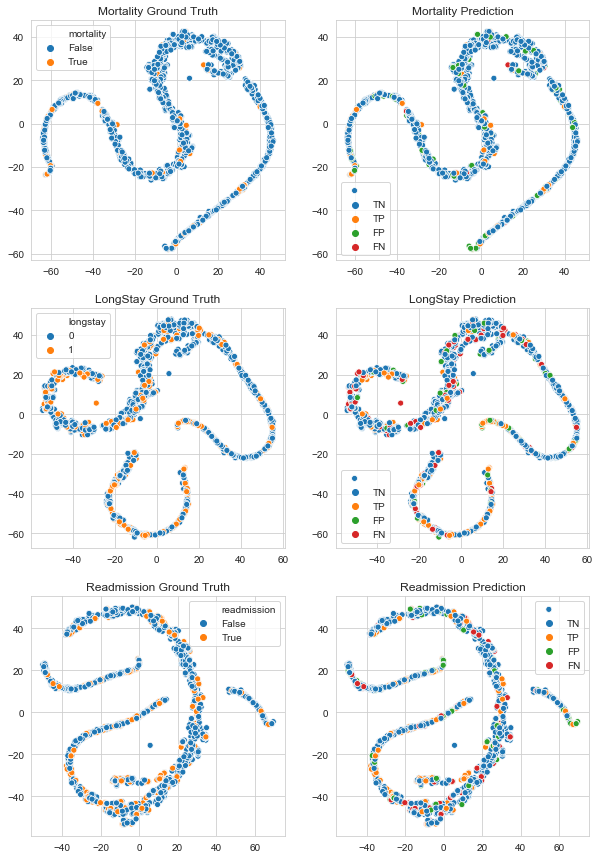

In [99]:
plot_model_scatter(CV_rfc, stats.fillna(0),features_final )

ExtraDims is prone to overfitting since there are more variables, performing best only at training set, so we regularize the hyperparameters so the model can be kept simple.

Standard uses 120 trees and 15 depths, compare to ExtraDims only use 10 trees, 3 depths

,StandardXGB,ControlDims,Logits,MLP,XGBExtraDims,XGBMultivariateSig,Logistic_Multivariate,XGB_ALL,XGBFinal
tpr,0.577670,0.597087,0.407767,0.281553,0.572816,0.490291,0.373786,0.572816,0.587379
fpr,0.221122,0.247525,0.158416,0.085809,0.168317,0.201320,0.125413,0.168317,0.184818
fnr,0.422330,0.402913,0.592233,0.718447,0.427184,0.509709,0.626214,0.427184,0.412621
tnr,0.778878,0.752475,0.841584,0.914191,0.831683,0.798680,0.874587,0.831683,0.815182
acc,0.697446,0.689587,0.666012,0.658153,0.726916,0.673870,0.671906,0.726916,0.722986
precision,0.639785,0.621212,0.636364,0.690476,0.698225,0.623457,0.669565,0.698225,0.683616
AP,0.679499,0.640883,0.591901,0.606913,0.710525,0.645545,0.631806,0.697646,0.696248
f1,0.607143,0.608911,0.497041,0.400000,0.629333,0.548913,0.479751,0.629333,0.631854
cohenkappa,0.362176,0.351749,0.264563,0.216244,0.416472,0.299200,0.267272,0.416472,0.411840
auroc,0.678274,0.674781,0.624676,0.597872,0.702249,0.644486,0.624187,0.702249,0.701280


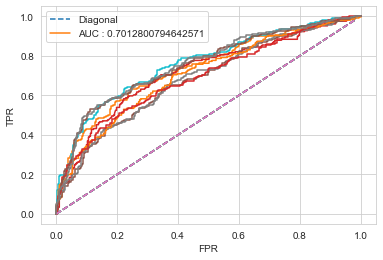

In [194]:
pd.concat([pd.Series(met_xg.rate()).rename('StandardXGB'),
           pd.Series(met_xg_control.rate()).rename('ControlDims'),
           pd.Series(met_logit.rate()).rename('Logits'), 
           pd.Series(met_nn.rate()).rename('MLP'),
           pd.Series(met_extra.rate()).rename('XGBExtraDims'),
        pd.Series(met_mul.rate()).rename('XGBMultivariateSig'),
           pd.Series(met_logit_mul.rate()).rename('Logistic_Multivariate'),
           pd.Series(met_all.rate()).rename('XGB_ALL'),
           pd.Series(met_final.rate()).rename('XGBFinal'),
          
          
          ],1)
# plt.legend.remove()

Show all AUC comparison

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


Text(0, 0.5, 'TPR')

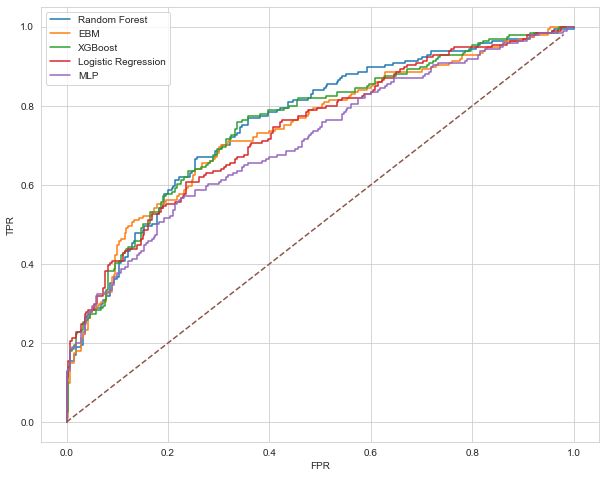

In [27]:

all_auc = {}
all_auc['Random Forest'] = sk_metrics.roc_curve(y_test_final.values, CV_rfc.predict_proba(X_test_final)[:,1], pos_label=1 )
all_auc['EBM'] = sk_metrics.roc_curve(y_test_final.values, model_ebm.predict_proba(X_test_final)[:,1], pos_label=1 )
all_auc['XGBoost'] = sk_metrics.roc_curve(y_test_final.values, model_xg_final.predict_proba(X_test_final)[:,1], pos_label=1 )
all_auc['Logistic Regression'] = sk_metrics.roc_curve(y_test_final.values, CV_logc.predict_proba(X_test_final)[:,1], pos_label=1 )
all_auc['MLP'] = sk_metrics.roc_curve(y_test_final.values, torch.sigmoid(model_mlp(xtestnorm)).detach().numpy(), pos_label=1 )


_,  ax = plt.subplots(figsize=(10,8))
for k in all_auc.keys():
    x,y,_ = all_auc[k]
    ax.plot(x,y)
ax.plot(np.arange(0,1,0.02),np.arange(0,1,0.02), linestyle='--')

ax.legend(all_auc.keys())
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')

In [15]:
list(zip(*sk_metrics.roc_curve(y_test_final.values, model_xg_final.predict_proba(X_test_final)[:,1], pos_label=1 )))

[(0.0, 0.0, 1.9395542),
 (0.0, 0.005154639175257732, 0.9395542),
 (0.0, 0.02577319587628866, 0.9307937),
 (0.0035714285714285713, 0.02577319587628866, 0.9192964),
 (0.0035714285714285713, 0.13917525773195877, 0.86905813),
 (0.007142857142857143, 0.13917525773195877, 0.8637141),
 (0.007142857142857143, 0.18041237113402062, 0.83688617),
 (0.010714285714285714, 0.18041237113402062, 0.8337313),
 (0.010714285714285714, 0.18556701030927836, 0.8313941),
 (0.014285714285714285, 0.18556701030927836, 0.82945734),
 (0.014285714285714285, 0.1958762886597938, 0.8266662),
 (0.017857142857142856, 0.1958762886597938, 0.82584333),
 (0.017857142857142856, 0.22164948453608246, 0.8235512),
 (0.02142857142857143, 0.22164948453608246, 0.8226099),
 (0.02142857142857143, 0.2268041237113402, 0.8216748),
 (0.02857142857142857, 0.2268041237113402, 0.81559575),
 (0.02857142857142857, 0.23195876288659795, 0.81512177),
 (0.03214285714285714, 0.23195876288659795, 0.8100084),
 (0.03214285714285714, 0.2525773195876288

In [203]:
x,y, _ = all_auc['Logistic Regression']
list(zip(x,y))

[(0.0, 0.0),
 (0.0, 0.0048543689320388345),
 (0.0033003300330033004, 0.0048543689320388345),
 (0.0033003300330033004, 0.07281553398058252),
 (0.013201320132013201, 0.07281553398058252),
 (0.013201320132013201, 0.13592233009708737),
 (0.019801980198019802, 0.13592233009708737),
 (0.019801980198019802, 0.15048543689320387),
 (0.0231023102310231, 0.15048543689320387),
 (0.0231023102310231, 0.1650485436893204),
 (0.026402640264026403, 0.1650485436893204),
 (0.026402640264026403, 0.20388349514563106),
 (0.033003300330033, 0.20388349514563106),
 (0.033003300330033, 0.22815533980582525),
 (0.039603960396039604, 0.22815533980582525),
 (0.039603960396039604, 0.23300970873786409),
 (0.0462046204620462, 0.23300970873786409),
 (0.0462046204620462, 0.23786407766990292),
 (0.0627062706270627, 0.23786407766990292),
 (0.0627062706270627, 0.24271844660194175),
 (0.066006600660066, 0.24271844660194175),
 (0.066006600660066, 0.2815533980582524),
 (0.06930693069306931, 0.2815533980582524),
 (0.06930693069

In [25]:
x,y, _ = all_auc['Random Forest']
list(zip(x,y))

[(0.0, 0.0),
 (0.0, 0.0048543689320388345),
 (0.0, 0.03398058252427184),
 (0.0033003300330033004, 0.03398058252427184),
 (0.0033003300330033004, 0.07766990291262135),
 (0.009900990099009901, 0.07766990291262135),
 (0.009900990099009901, 0.11165048543689321),
 (0.0165016501650165, 0.11165048543689321),
 (0.0165016501650165, 0.12135922330097088),
 (0.0231023102310231, 0.12135922330097088),
 (0.0231023102310231, 0.13106796116504854),
 (0.026402640264026403, 0.13106796116504854),
 (0.026402640264026403, 0.16019417475728157),
 (0.0297029702970297, 0.16019417475728157),
 (0.0297029702970297, 0.2087378640776699),
 (0.036303630363036306, 0.2087378640776699),
 (0.036303630363036306, 0.21844660194174756),
 (0.0429042904290429, 0.21844660194174756),
 (0.0429042904290429, 0.22330097087378642),
 (0.0462046204620462, 0.22330097087378642),
 (0.0462046204620462, 0.23300970873786409),
 (0.04950495049504951, 0.23300970873786409),
 (0.04950495049504951, 0.2621359223300971),
 (0.052805280528052806, 0.2621

In [26]:
x,y, _ = all_auc['EBM']
list(zip(x,y))

[(0.0, 0.0),
 (0.0, 0.0048543689320388345),
 (0.0, 0.019417475728155338),
 (0.006600660066006601, 0.019417475728155338),
 (0.006600660066006601, 0.12135922330097088),
 (0.009900990099009901, 0.12135922330097088),
 (0.009900990099009901, 0.1553398058252427),
 (0.013201320132013201, 0.1553398058252427),
 (0.013201320132013201, 0.17475728155339806),
 (0.0165016501650165, 0.17475728155339806),
 (0.0165016501650165, 0.1796116504854369),
 (0.019801980198019802, 0.1796116504854369),
 (0.019801980198019802, 0.20388349514563106),
 (0.033003300330033, 0.20388349514563106),
 (0.033003300330033, 0.2087378640776699),
 (0.036303630363036306, 0.2087378640776699),
 (0.036303630363036306, 0.22815533980582525),
 (0.039603960396039604, 0.22815533980582525),
 (0.039603960396039604, 0.23300970873786409),
 (0.0429042904290429, 0.23300970873786409),
 (0.0429042904290429, 0.2524271844660194),
 (0.04950495049504951, 0.2524271844660194),
 (0.04950495049504951, 0.2621359223300971),
 (0.052805280528052806, 0.2621

In [27]:

x,y, _ = all_auc['XGBoost']
list(zip(x,y))

[(0.0, 0.0),
 (0.0, 0.0048543689320388345),
 (0.0, 0.014563106796116505),
 (0.0033003300330033004, 0.014563106796116505),
 (0.0033003300330033004, 0.08737864077669903),
 (0.009900990099009901, 0.08737864077669903),
 (0.009900990099009901, 0.09223300970873786),
 (0.0165016501650165, 0.09223300970873786),
 (0.0165016501650165, 0.12135922330097088),
 (0.019801980198019802, 0.12135922330097088),
 (0.019801980198019802, 0.13106796116504854),
 (0.0231023102310231, 0.13106796116504854),
 (0.0231023102310231, 0.16990291262135923),
 (0.0297029702970297, 0.16990291262135923),
 (0.0297029702970297, 0.1796116504854369),
 (0.033003300330033, 0.1796116504854369),
 (0.033003300330033, 0.18932038834951456),
 (0.039603960396039604, 0.18932038834951456),
 (0.039603960396039604, 0.23300970873786409),
 (0.0429042904290429, 0.23300970873786409),
 (0.0429042904290429, 0.2669902912621359),
 (0.0462046204620462, 0.2669902912621359),
 (0.0462046204620462, 0.3106796116504854),
 (0.056105610561056105, 0.31067961

In [28]:

x,y, _ = all_auc['MLP']
list(zip(x,y))

[(0.0, 0.0),
 (0.0, 0.0048543689320388345),
 (0.0, 0.04854368932038835),
 (0.0033003300330033004, 0.04854368932038835),
 (0.0033003300330033004, 0.05825242718446602),
 (0.006600660066006601, 0.05825242718446602),
 (0.006600660066006601, 0.06310679611650485),
 (0.009900990099009901, 0.06310679611650485),
 (0.009900990099009901, 0.12135922330097088),
 (0.013201320132013201, 0.12135922330097088),
 (0.013201320132013201, 0.1553398058252427),
 (0.019801980198019802, 0.1553398058252427),
 (0.019801980198019802, 0.16990291262135923),
 (0.0231023102310231, 0.16990291262135923),
 (0.0231023102310231, 0.1796116504854369),
 (0.026402640264026403, 0.1796116504854369),
 (0.026402640264026403, 0.18446601941747573),
 (0.033003300330033, 0.18446601941747573),
 (0.033003300330033, 0.19902912621359223),
 (0.039603960396039604, 0.19902912621359223),
 (0.039603960396039604, 0.2087378640776699),
 (0.0429042904290429, 0.2087378640776699),
 (0.0429042904290429, 0.21359223300970873),
 (0.052805280528052806, 0

KaplanMeier

In [29]:
from lifelines import KaplanMeierFitter
from lifelines.datasets import load_waltons

In [32]:
kmf = KaplanMeierFitter(label='waltons_data')
kmf.fit(waltons['T'], waltons['E'])

<lifelines.KaplanMeierFitter:"waltons_data", fitted with 163 total observations, 7 right-censored observations>

In [72]:
kmf = KaplanMeierFitter(label='GCSmotor')
kmf.fit(stats['R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE'], 1- stats['target'])

<lifelines.KaplanMeierFitter:"GCSmotor", fitted with 2368 total observations, 953 right-censored observations>

<AxesSubplot:xlabel='timeline'>

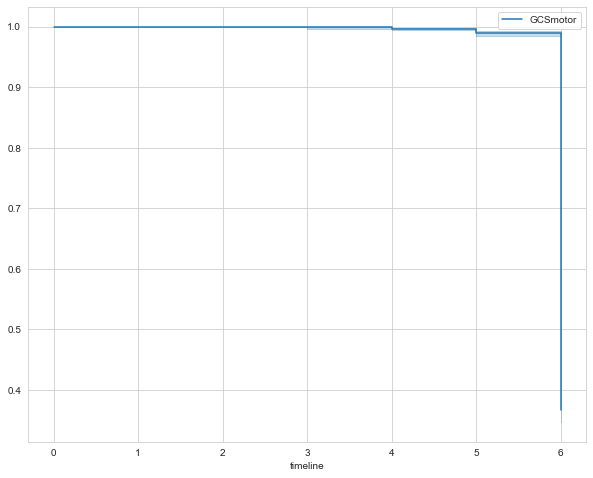

In [73]:
kmf.plot(figsize=(10,8))

In [82]:
1- kmf.cumulative_density_

,GCSmotor
timeline,
0.0,1.000000
1.0,1.000000
2.0,1.000000
3.0,0.999571
4.0,0.996992
5.0,0.989594
6.0,0.366732


<AxesSubplot:xlabel='R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE'>

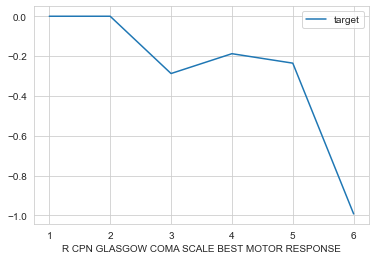

In [87]:
np.log(stats.groupby(['R CPN GLASGOW COMA SCALE BEST MOTOR RESPONSE']).agg({'target':'mean'})).plot()